In [1]:
from statsmodels.formula.api import ols
from statsmodels.graphics.api import interaction_plot, abline_plot
from statsmodels.stats.anova import anova_lm

import statsmodels.api as sm

import dataframe_image as dfi

In [2]:
import os

try:
    os.mkdir("../PLOTS/F_SUB_GENDER")
except:
    print("F_SUB_GENDER dir exists.")

#For testing, leave commented
swivel = 0
#swivel_order = [2, 1, 7, 3, 16, 6, 12, 9, 10, 4, 5, 15, 8, 14, 20, 0, 22, 13, 19, 11, 18, 21, 17]

desired_file_prefix = "F_GENDER" 

normalize_data=True

by_year = 1
lnconvert=False
 

F_SUB_GENDER dir exists.


# FUNCTIONS

In [3]:
def color_corr_green(val):
  color = 'green' if val > 0.8 else 'black'
  return 'color: %s' % color


In [4]:
def gen_boxplot():

 case_list = []

 # Create list of data cases
 #
 for index in range(0,len(global_y_soc1)):
    name = global_y_soc1[index][0]
    if (name[5:] not in case_list):
        case_list.append(name[5:])

 print(case_list)

 # Handle one case at a time
 #
 for case in case_list:
        
    #print("case = ",case)
    
    pd_df = pd.DataFrame()
    sel_y = []
    
    for index in range(0,len(global_y_soc1)):
        
        name  = global_y_soc1[index][0]
        sel_y = global_y_soc1[index][1]
        
        # Cycle through years
        #
        if (case in name):    
            #print(case,name)
            name = name[0:5] + name[8:]
            #print("8 ",name)
            
            df = pd.DataFrame()
            df[name] = sel_y
            
            #Q1 = df[name].quantile(0.25)
            #Q3 = df[name].quantile(0.75)
            #IQR = Q3 - Q1    #IQR is interquartile range. 

            #filter = (df[name] >= Q1 - 1.5 * IQR) & (df[name] <= Q3 + 1.5 *IQR)
            #print(filter)
            #df = df.loc[filter]
            
            q = df[name].quantile(0.80)
            df = df[df[name] < q]
            
            pd_df = pd.concat([pd_df,df],axis=1)
        
            #print(pd_df)

    # Get occupation
    for code in soc_new_code:
        #print(code[0][0:2])
        if (code[0][0:2].find(case[0:2]) >= 0):
            #print(code[0],code[1])
            ocup = str(code[0]) + " " + str(code[1])
            
    #print(ocup)

    title = desired_file_prefix + " " + ocup + " boxplot " + str(case[3:])
    plt.figure(title,figsize=(10, 10))
    plt.title(title)

    #plt.ylim(0.0, 3e-6)

    pd_df.boxplot()
    plt.xticks(rotation = 90)
    plt.tight_layout()  

    save_title = "../PLOTS/" + desired_file_output + title + ".png"
    save_title = save_title.replace(",","")
    save_title = save_title.replace(" ","_")
    plt.savefig(save_title, dpi=100, bbox_inches='tight')
    
    plt.show()
    
    #print("HERE")
    #print(df[df['YEAR'].str.contains(name)])
    
    ## ########################## correlations ######################
    
    title = title + "_pearson_corr"

    df_corr = pd_df.corr(method='pearson').style.applymap(color_corr_green)

    df = pd_df.corr(method='pearson')
 
    df_styled = df.style.background_gradient(axis=None, vmin=0.45, vmax=1.0)
  
    save_file = "../PLOTS/" + desired_file_output + title + ".png"
    dfi.export(df_styled, save_file, max_cols=-1, max_rows=-1)

    save_file = "../PLOTS/" + desired_file_output + title + ".xlsx"
    df_corr.to_excel(save_file)

    display(df_styled)        

# ALL CORRELATIONS

In [5]:
# Generate all correlations
#
def gen_corr():

  pd_df = pd.DataFrame()
  sel_y = []
    
  case_list = []

  # Create list of data cases
  #
  for index in range(0,len(global_y_soc1)):
    name = global_y_soc1[index][0]
    if (name[5:] not in case_list):
        case_list.append(name[5:])

  print(case_list)

  # Handle one case at a time
  #
  for case in case_list:
    
    for index in range(0,len(global_y_soc1)):
        
        name  = global_y_soc1[index][0]
        sel_y = global_y_soc1[index][1]
        
        # Cycle through years
        #
        if (case in name):    
            #print(case,name)
            
            temp_pd_df = pd.DataFrame()
            temp_pd_df[name] = sel_y
            pd_df = pd.concat([pd_df,temp_pd_df],axis=1)
        
            #print(pd_df)

            # Get occupation
            for code in soc_new_code:
                #print(code[0][0:2])
                if (code[0][0:2].find(case[0:2]) >= 0):
                    #print(code[0],code[1])
                    ocup = str(code[0]) + " " + str(code[1])
            
  #print(ocup)

  title = desired_file_prefix + ocup +" ALL boxplot " + str(case[3:])
  plt.figure(title,figsize=(10, 10))
  plt.title(title)

  #plt.ylim(0.0, 3e-6)

  pd_df.boxplot()
  plt.xticks(rotation = 90)
  plt.tight_layout()  

  save_title = "../PLOTS/" + desired_file_output + title + ".png"
  save_title = save_title.replace(",","")
  save_title = save_title.replace(" ","_")
  plt.savefig(save_title, dpi=100, bbox_inches='tight')
    
  plt.show()
    
  #print("HERE")
  #print(df[df['YEAR'].str.contains(name)])
    
  ## ########################## correlations ######################
    
  title = title + "_pearson_corr"

  df_corr = pd_df.corr(method='pearson').style.applymap(color_corr_green)

  df = pd_df.corr(method='pearson')
 
  df_styled = df.style.background_gradient(axis=None, vmin=0.45, vmax=1.0)
  
  save_file = "../PLOTS/" + desired_file_output + title + ".png"
  dfi.export(df_styled, save_file, max_cols=-1, max_rows=-1)

  save_file = "../PLOTS/" + desired_file_output + title + ".xlsx"
  df_corr.to_excel(save_file)

  display(df_styled)        



########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty not found....defining
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
11-0000 Management Occupations
 
############ OCCUPATION ############
11-0000 Management Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
11-0000 Management Occupations
 
############ OCCUPATION ############
11-0000 Management Occupations
 
########################################## NEW YEAR ##########################################

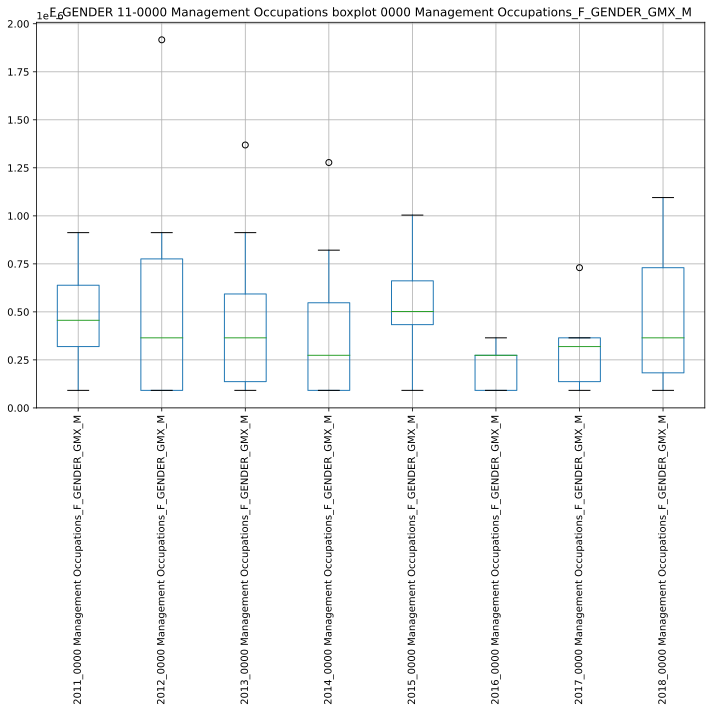

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/223926.970165:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223927.007238:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223927.255616:INFO:headless_shell.cc(660)] Written to file /tmp/tmpl3uxrw_8/temp.png.
[1013/223927.484723:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223927.522107:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223927.815126:INFO:headless_shell.cc(660)] Written to file /tmp/tmp9pf9bqbb/temp.png.
[1013/223928.077400:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223928.118154:WARNI

,2011_0000 Management Occupations_F_GENDER_GMX_M,2012_0000 Management Occupations_F_GENDER_GMX_M,2013_0000 Management Occupations_F_GENDER_GMX_M,2014_0000 Management Occupations_F_GENDER_GMX_M,2015_0000 Management Occupations_F_GENDER_GMX_M,2016_0000 Management Occupations_F_GENDER_GMX_M,2017_0000 Management Occupations_F_GENDER_GMX_M,2018_0000 Management Occupations_F_GENDER_GMX_M
2011_0000 Management Occupations_F_GENDER_GMX_M,1.000000,0.676292,-0.300160,0.732900,0.486172,-0.715247,0.247039,0.562721
2012_0000 Management Occupations_F_GENDER_GMX_M,0.676292,1.000000,-0.006255,0.327362,0.532958,-0.074263,-0.024048,-0.488312
2013_0000 Management Occupations_F_GENDER_GMX_M,-0.300160,-0.006255,1.000000,0.014550,0.653068,-0.649989,0.068466,-0.468708
2014_0000 Management Occupations_F_GENDER_GMX_M,0.732900,0.327362,0.014550,1.000000,0.466911,-0.669107,-0.312363,0.559249
2015_0000 Management Occupations_F_GENDER_GMX_M,0.486172,0.532958,0.653068,0.466911,1.000000,-0.613530,-0.180211,-0.762092
2016_0000 Management Occupations_F_GENDER_GMX_M,-0.715247,-0.074263,-0.649989,-0.669107,-0.613530,1.000000,-0.186886,-0.302122
2017_0000 Management Occupations_F_GENDER_GMX_M,0.247039,-0.024048,0.068466,-0.312363,-0.180211,-0.186886,1.000000,-0.094868
2018_0000 Management Occupations_F_GENDER_GMX_M,0.562721,-0.488312,-0.468708,0.559249,-0.762092,-0.302122,-0.094868,1.000000


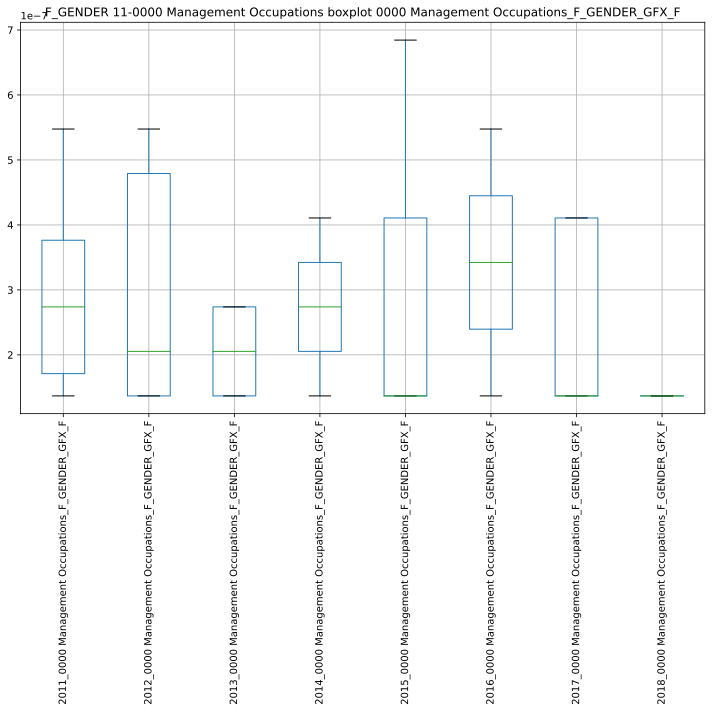

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/223930.990379:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223931.029068:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223931.229810:INFO:headless_shell.cc(660)] Written to file /tmp/tmp333qjm5i/temp.png.
[1013/223931.445690:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223931.485687:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223931.777677:INFO:headless_shell.cc(660)] Written to file /tmp/tmpa_etoq07/temp.png.
[1013/223932.058837:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223932.091168:WARNI

,2011_0000 Management Occupations_F_GENDER_GFX_F,2012_0000 Management Occupations_F_GENDER_GFX_F,2013_0000 Management Occupations_F_GENDER_GFX_F,2014_0000 Management Occupations_F_GENDER_GFX_F,2015_0000 Management Occupations_F_GENDER_GFX_F,2016_0000 Management Occupations_F_GENDER_GFX_F,2017_0000 Management Occupations_F_GENDER_GFX_F,2018_0000 Management Occupations_F_GENDER_GFX_F
2011_0000 Management Occupations_F_GENDER_GFX_F,1.000000,0.870388,-0.192450,-1.000000,1.000000,nan,-0.774597,nan
2012_0000 Management Occupations_F_GENDER_GFX_F,0.870388,1.000000,0.188982,-0.866025,1.000000,-1.000000,-1.000000,nan
2013_0000 Management Occupations_F_GENDER_GFX_F,-0.192450,0.188982,1.000000,nan,nan,nan,0.500000,nan
2014_0000 Management Occupations_F_GENDER_GFX_F,-1.000000,-0.866025,nan,1.000000,-1.000000,1.000000,0.866025,nan
2015_0000 Management Occupations_F_GENDER_GFX_F,1.000000,1.000000,nan,-1.000000,1.000000,-1.000000,-0.500000,nan
2016_0000 Management Occupations_F_GENDER_GFX_F,nan,-1.000000,nan,1.000000,-1.000000,1.000000,1.000000,nan
2017_0000 Management Occupations_F_GENDER_GFX_F,-0.774597,-1.000000,0.500000,0.866025,-0.500000,1.000000,1.000000,nan
2018_0000 Management Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['11-0000 Management Occupations_F_GENDER_GMX_M', '11-0000 Management Occupations_F_GENDER_GFX_F']


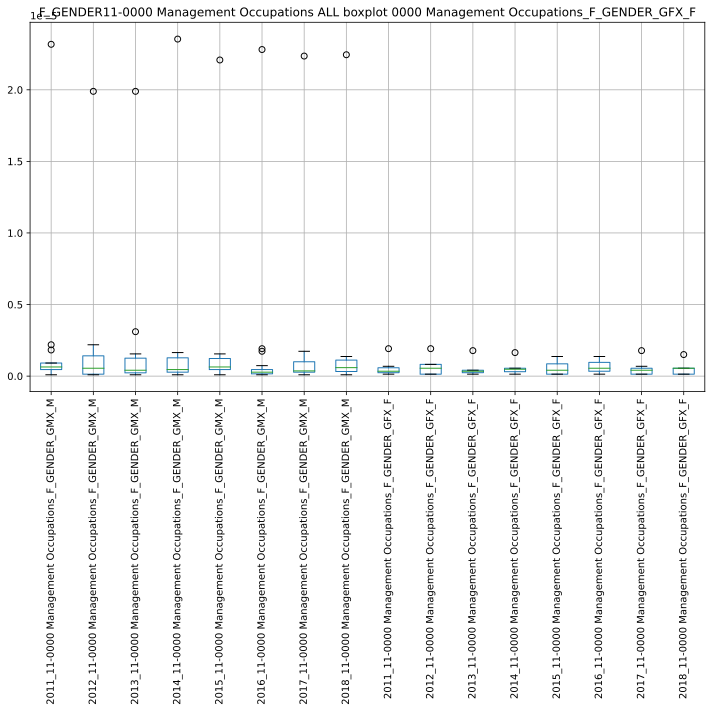

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/223935.339175:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223935.381152:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223935.622969:INFO:headless_shell.cc(660)] Written to file /tmp/tmpdh1t28mp/temp.png.
[1013/223935.842328:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223935.879738:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223936.205529:INFO:headless_shell.cc(660)] Written to file /tmp/tmpkw1dq39r/temp.png.
[1013/223936.465750:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223936.507610:WARNI

,2011_11-0000 Management Occupations_F_GENDER_GMX_M,2012_11-0000 Management Occupations_F_GENDER_GMX_M,2013_11-0000 Management Occupations_F_GENDER_GMX_M,2014_11-0000 Management Occupations_F_GENDER_GMX_M,2015_11-0000 Management Occupations_F_GENDER_GMX_M,2016_11-0000 Management Occupations_F_GENDER_GMX_M,2017_11-0000 Management Occupations_F_GENDER_GMX_M,2018_11-0000 Management Occupations_F_GENDER_GMX_M,2011_11-0000 Management Occupations_F_GENDER_GFX_F,2012_11-0000 Management Occupations_F_GENDER_GFX_F,2013_11-0000 Management Occupations_F_GENDER_GFX_F,2014_11-0000 Management Occupations_F_GENDER_GFX_F,2015_11-0000 Management Occupations_F_GENDER_GFX_F,2016_11-0000 Management Occupations_F_GENDER_GFX_F,2017_11-0000 Management Occupations_F_GENDER_GFX_F,2018_11-0000 Management Occupations_F_GENDER_GFX_F
2011_11-0000 Management Occupations_F_GENDER_GMX_M,1.000000,-0.138495,-0.072596,-0.012397,0.990539,-0.119550,-0.023088,-0.107014,-0.024414,0.131072,-0.198920,-0.036903,0.695058,0.785714,-0.299461,0.006555
2012_11-0000 Management Occupations_F_GENDER_GMX_M,-0.138495,1.000000,-0.041535,-0.008867,-0.087292,0.987301,-0.004784,-0.140816,0.103737,0.114063,-0.020270,0.004256,0.318823,0.877338,-0.136506,-0.642856
2013_11-0000 Management Occupations_F_GENDER_GMX_M,-0.072596,-0.041535,1.000000,-0.099634,-0.122695,-0.028814,-0.100598,-0.151014,-0.191399,-0.030726,0.982484,-0.351070,0.975343,0.500000,0.100485,-0.331840
2014_11-0000 Management Occupations_F_GENDER_GMX_M,-0.012397,-0.008867,-0.099634,1.000000,-0.131378,-0.098671,0.993416,-0.077768,-0.494373,-0.313557,-0.065105,-0.376417,0.982941,0.748753,-0.208502,-0.147182
2015_11-0000 Management Occupations_F_GENDER_GMX_M,0.990539,-0.087292,-0.122695,-0.131378,1.000000,-0.056962,-0.142445,-0.107355,-0.003632,0.155886,-0.240960,-0.052908,0.940222,0.500000,-0.294455,0.031999
2016_11-0000 Management Occupations_F_GENDER_GMX_M,-0.119550,0.987301,-0.028814,-0.098671,-0.056962,1.000000,-0.090534,-0.118112,0.098341,0.147829,-0.029160,0.097981,-0.717258,-0.188982,0.243602,-0.384474
2017_11-0000 Management Occupations_F_GENDER_GMX_M,-0.023088,-0.004784,-0.100598,0.993416,-0.142445,-0.090534,1.000000,-0.081471,-0.517326,-0.290597,-0.042505,0.361459,0.536073,0.944911,-0.162104,-0.673266
2018_11-0000 Management Occupations_F_GENDER_GMX_M,-0.107014,-0.140816,-0.151014,-0.077768,-0.107355,-0.118112,-0.081471,1.000000,-0.296725,-0.234729,-0.282226,-0.057850,0.932693,0.914807,0.933675,0.028930
2011_11-0000 Management Occupations_F_GENDER_GFX_F,-0.024414,0.103737,-0.191399,-0.494373,-0.003632,0.098341,-0.517326,-0.296725,1.000000,-0.260368,-0.085052,-0.177845,-0.566975,-0.327327,-0.228884,0.140200
2012_11-0000 Management Occupations_F_GENDER_GFX_F,0.131072,0.114063,-0.030726,-0.313557,0.155886,0.147829,-0.290597,-0.234729,-0.260368,1.000000,-0.000000,0.897658,-0.506309,-0.755929,-0.404994,-0.205560


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
#################

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER

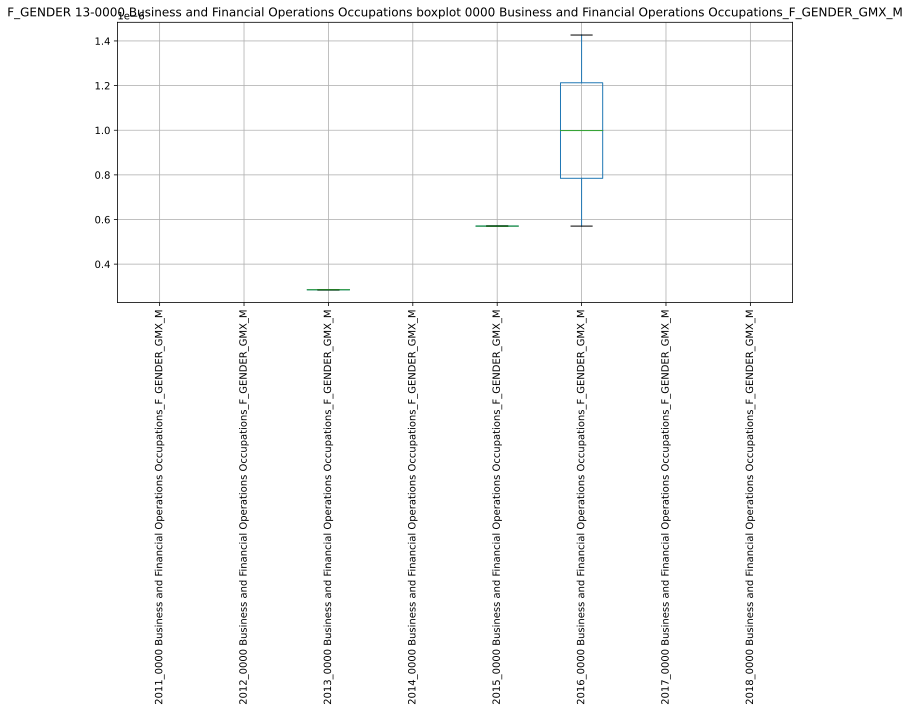

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/223943.832391:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223943.869122:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223944.082169:INFO:headless_shell.cc(660)] Written to file /tmp/tmpfb52dgrv/temp.png.
[1013/223944.299325:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223944.337065:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223944.602717:INFO:headless_shell.cc(660)] Written to file /tmp/tmpu0nd2gvk/temp.png.
[1013/223944.848519:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223944.888419:WARNI

,2011_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2012_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2013_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2014_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2015_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2016_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2017_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2018_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M
2011_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,1.000000,nan,nan
2017_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan


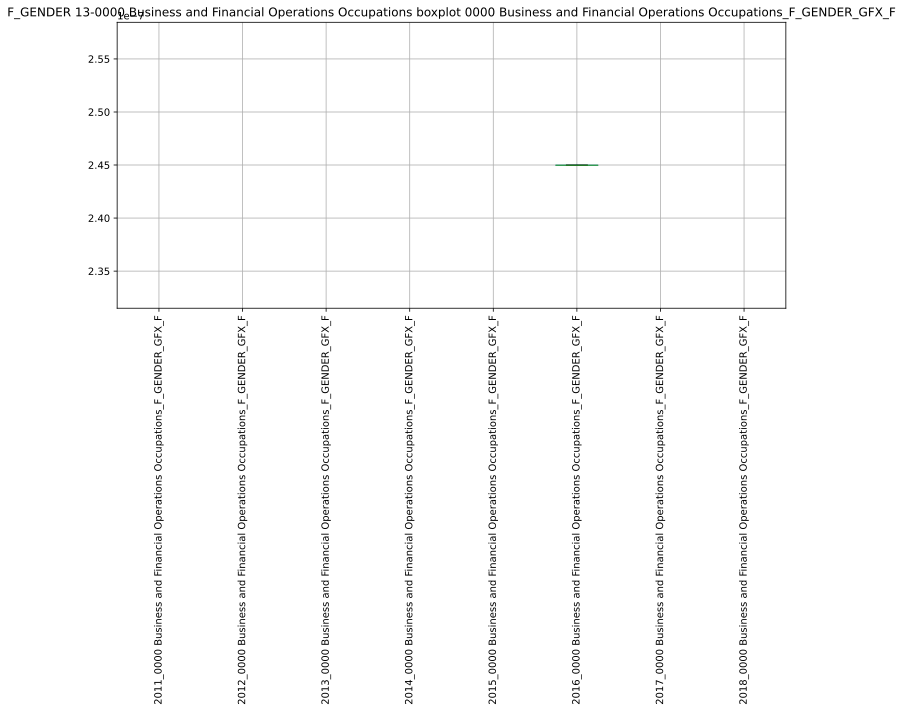

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/223948.864188:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223948.901034:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223949.109660:INFO:headless_shell.cc(660)] Written to file /tmp/tmp5xy__t_l/temp.png.
[1013/223949.317627:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223949.362140:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223949.637994:INFO:headless_shell.cc(660)] Written to file /tmp/tmpzzevvj06/temp.png.
[1013/223949.896152:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223949.932371:WARNI

,2011_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2012_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2013_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2014_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2015_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2016_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2017_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2018_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F
2011_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M', '13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F']


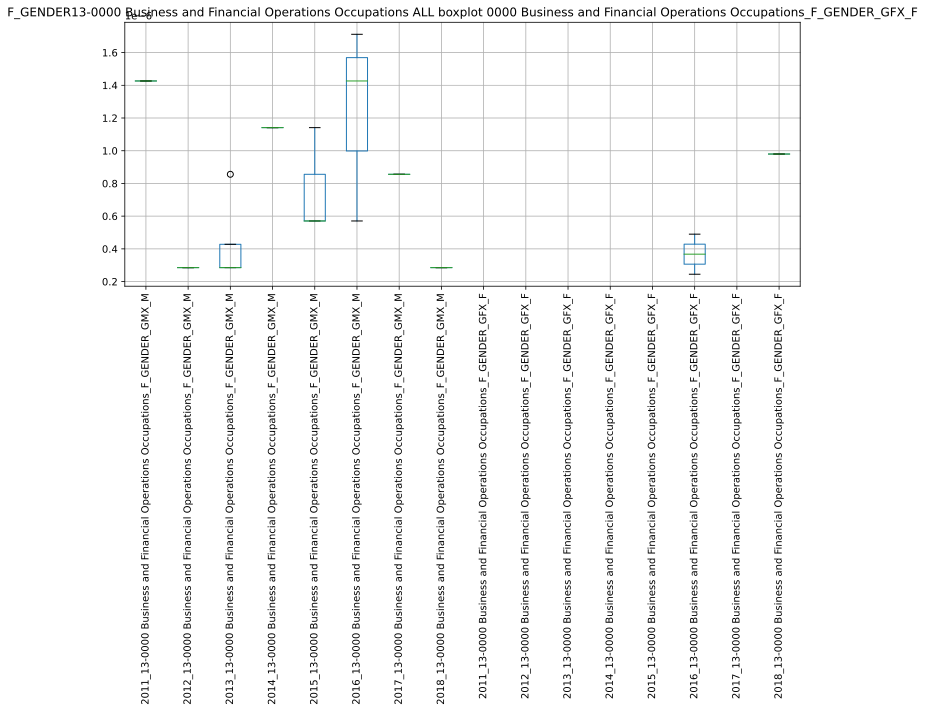

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/223954.550462:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223954.589011:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223954.854412:INFO:headless_shell.cc(660)] Written to file /tmp/tmpwbwikfu1/temp.png.
[1013/223955.090270:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223955.129390:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/223955.522005:INFO:headless_shell.cc(660)] Written to file /tmp/tmpfinuyod9/temp.png.
[1013/223955.839168:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/223955.876731:WARNI

,2011_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2012_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2013_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2014_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2015_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2016_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2017_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2018_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,2011_13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2012_13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2013_13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2014_13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2015_13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2016_13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2017_13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,2018_13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F
2011_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,1.000000,nan,-0.500000,0.693375,nan,nan,nan,nan,nan,nan,nan,-1.000000,nan,nan
2014_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2015_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,-0.500000,nan,1.000000,0.277350,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2016_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,0.693375,nan,0.277350,1.000000,nan,nan,nan,nan,nan,nan,nan,-1.000000,nan,nan
2017_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2018_13-0000 Business and Financial Operations Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2011_13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_13-0000 Business and Financial Operations Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########################################## NEW YEAR ###############################################


/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
####

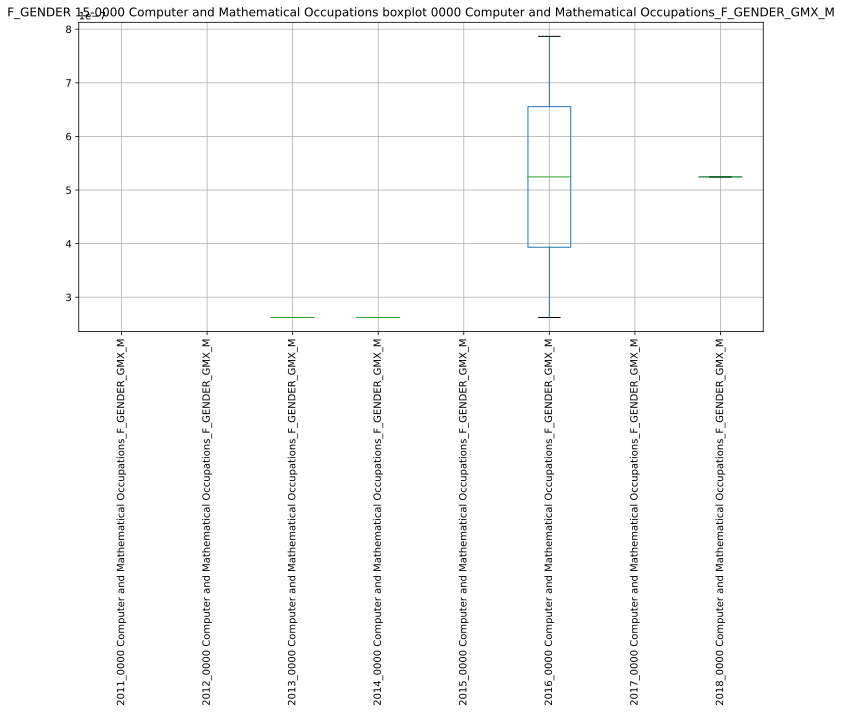

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224005.067136:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224005.103556:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224005.311942:INFO:headless_shell.cc(660)] Written to file /tmp/tmpru_6n6wf/temp.png.
[1013/224005.529554:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224005.569215:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224005.860835:INFO:headless_shell.cc(660)] Written to file /tmp/tmpca7gixt_/temp.png.
[1013/224006.110126:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224006.151533:WARNI

,2011_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2012_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2013_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2014_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2015_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2016_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2017_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2018_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M
2011_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,1.000000,nan,nan
2017_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan


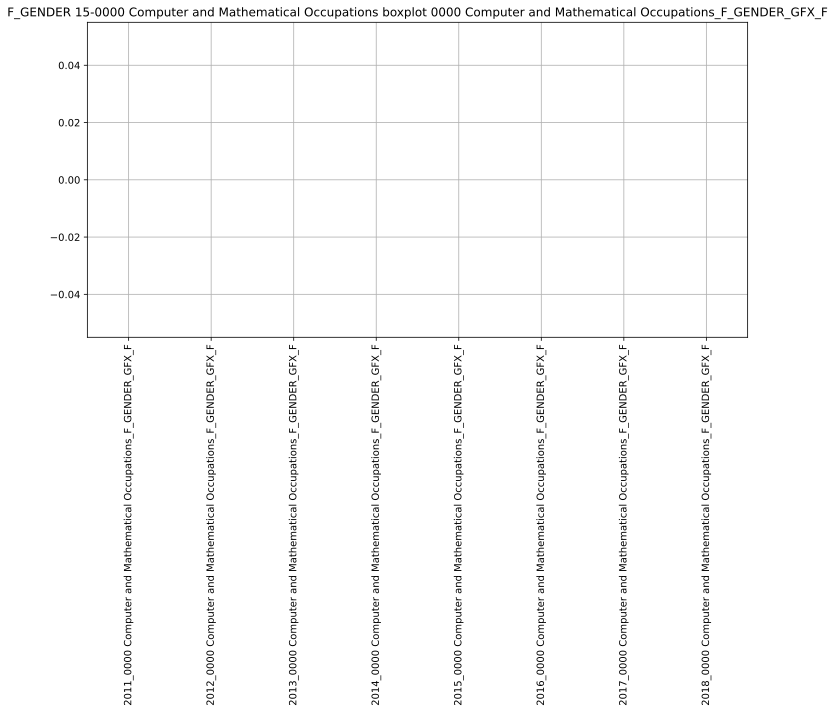

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224008.828924:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224008.866303:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224009.082707:INFO:headless_shell.cc(660)] Written to file /tmp/tmpmvkpbknn/temp.png.
[1013/224009.296107:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224009.332854:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224009.628741:INFO:headless_shell.cc(660)] Written to file /tmp/tmprkmndk28/temp.png.
[1013/224009.902699:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224009.940619:WARNI

,2011_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2012_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2013_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2014_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2015_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2016_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2017_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2018_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F
2011_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M', '15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F']


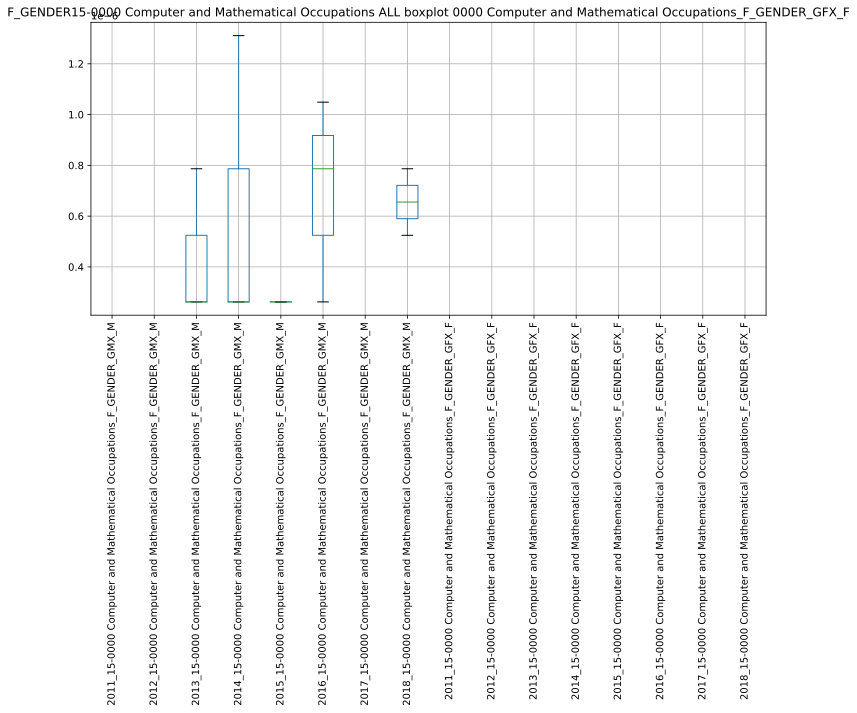

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224013.034562:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224013.075243:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224013.294007:INFO:headless_shell.cc(660)] Written to file /tmp/tmp431yh5lz/temp.png.
[1013/224013.507120:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224013.543945:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224013.951886:INFO:headless_shell.cc(660)] Written to file /tmp/tmpgaqmg01m/temp.png.
[1013/224014.257123:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224014.295678:WARNI

,2011_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2012_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2013_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2014_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2015_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2016_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2017_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2018_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,2011_15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2012_15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2013_15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2014_15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2015_15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2016_15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2017_15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,2018_15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F
2011_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,1.000000,-0.500000,nan,0.188982,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan
2014_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,-0.500000,1.000000,nan,-0.944911,nan,-1.000000,nan,nan,nan,nan,nan,nan,nan,nan
2015_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2016_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,0.188982,-0.944911,nan,1.000000,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan
2017_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2018_15-0000 Computer and Mathematical Occupations_F_GENDER_GMX_M,nan,nan,1.000000,-1.000000,nan,1.000000,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan
2011_15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_15-0000 Computer and Mathematical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
#####################################

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_G

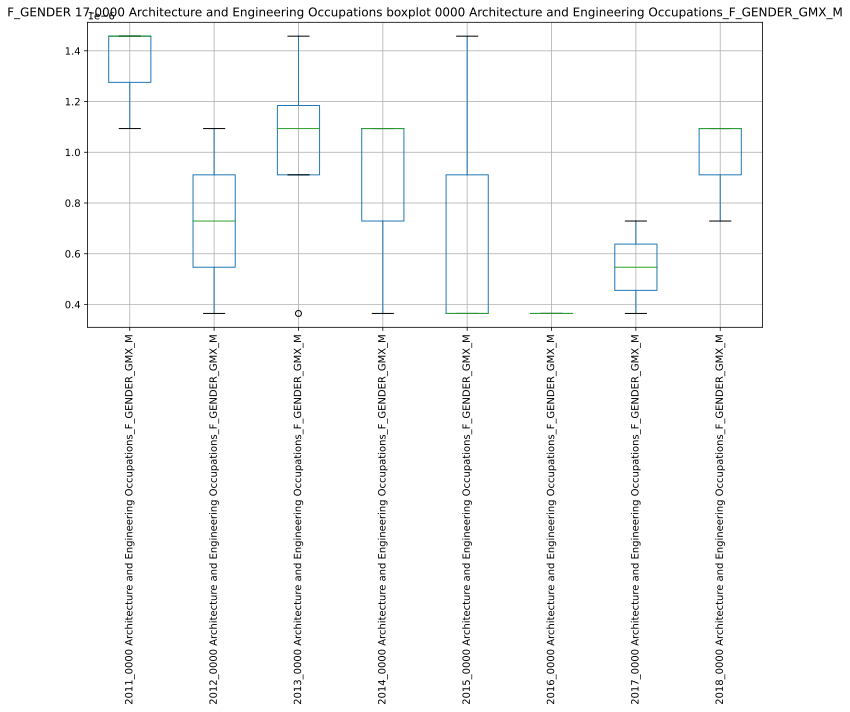

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224023.428837:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224023.468233:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224023.677877:INFO:headless_shell.cc(660)] Written to file /tmp/tmphr2kknc7/temp.png.
[1013/224023.894720:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224023.936608:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224024.203172:INFO:headless_shell.cc(660)] Written to file /tmp/tmpz549jge_/temp.png.
[1013/224024.454935:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224024.492893:WARNI

,2011_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2012_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2013_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2014_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2015_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2016_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2017_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2018_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M
2011_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,1.000000,nan,nan,-1.000000,nan,nan,nan,-1.000000
2012_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,nan,1.000000,-1.000000,nan,-1.000000,nan,-1.000000,-1.000000
2013_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,nan,-1.000000,1.000000,1.000000,0.188982,nan,1.000000,1.000000
2014_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,-1.000000,nan,1.000000,1.000000,nan,nan,nan,1.000000
2015_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,nan,-1.000000,0.188982,nan,1.000000,nan,1.000000,1.000000
2016_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,nan,-1.000000,1.000000,nan,1.000000,nan,1.000000,1.000000
2018_0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,-1.000000,-1.000000,1.000000,1.000000,1.000000,nan,1.000000,1.000000


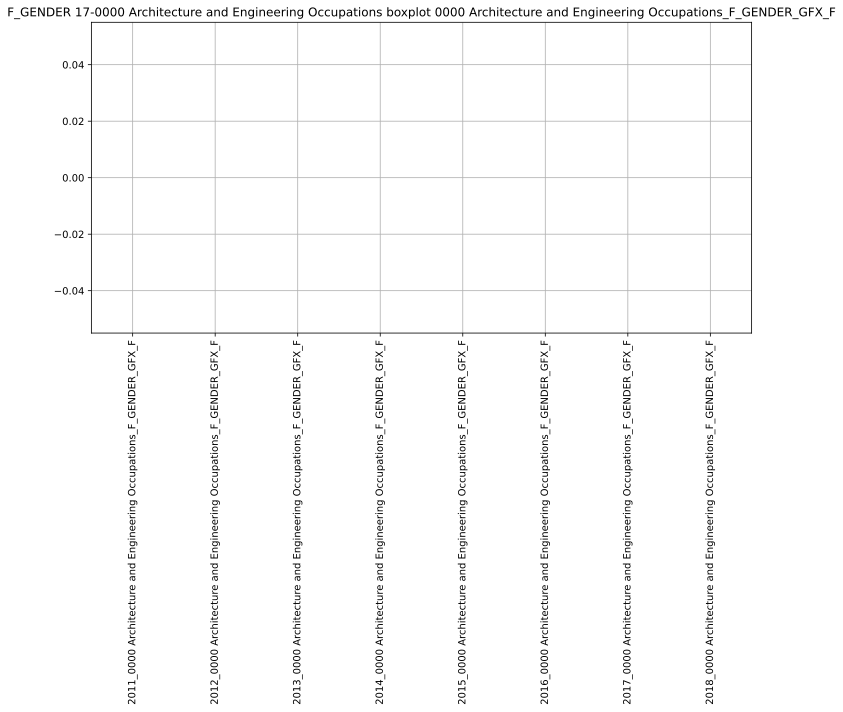

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224027.156641:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224027.199036:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224027.411923:INFO:headless_shell.cc(660)] Written to file /tmp/tmpd0xku8w1/temp.png.
[1013/224027.623754:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224027.663210:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224027.951044:INFO:headless_shell.cc(660)] Written to file /tmp/tmpzjrd1y2j/temp.png.
[1013/224028.217906:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224028.259841:WARNI

,2011_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2012_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2013_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2014_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2015_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2016_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2017_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2018_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F
2011_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M', '17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F']


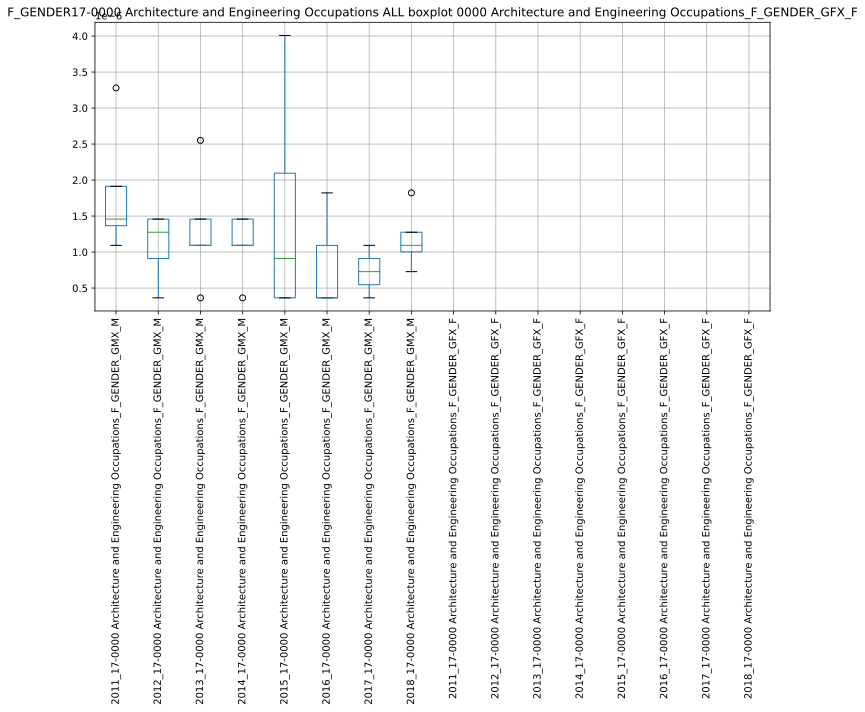

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224031.404429:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224031.460302:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224031.693866:INFO:headless_shell.cc(660)] Written to file /tmp/tmp4am3iqsz/temp.png.
[1013/224031.924477:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224031.961554:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224032.368682:INFO:headless_shell.cc(660)] Written to file /tmp/tmps4xdiam8/temp.png.
[1013/224032.701302:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224032.737851:WARNI

,2011_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2012_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2013_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2014_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2015_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2016_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2017_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2018_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,2011_17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2012_17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2013_17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2014_17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2015_17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2016_17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2017_17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,2018_17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F
2011_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,1.000000,-0.957427,-0.344656,0.435194,-0.208763,-0.514259,-0.155543,-0.097823,nan,nan,nan,nan,nan,nan,nan,nan
2012_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,-0.957427,1.000000,0.471405,-0.166667,0.199875,0.738549,0.327327,0.374634,nan,nan,nan,nan,nan,nan,nan,nan
2013_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,-0.344656,0.471405,1.000000,0.465847,0.855065,0.490990,0.981981,0.344378,nan,nan,nan,nan,nan,nan,nan,nan
2014_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,0.435194,-0.166667,0.465847,1.000000,0.149906,0.487950,0.654654,0.749269,nan,nan,nan,nan,nan,nan,nan,nan
2015_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,-0.208763,0.199875,0.855065,0.149906,1.000000,0.018452,0.974355,-0.182520,nan,nan,nan,nan,nan,nan,nan,nan
2016_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,-0.514259,0.738549,0.490990,0.487950,0.018452,1.000000,0.866025,0.899229,nan,nan,nan,nan,nan,nan,nan,nan
2017_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,-0.155543,0.327327,0.981981,0.654654,0.974355,0.866025,1.000000,0.866025,nan,nan,nan,nan,nan,nan,nan,nan
2018_17-0000 Architecture and Engineering Occupations_F_GENDER_GMX_M,-0.097823,0.374634,0.344378,0.749269,-0.182520,0.899229,0.866025,1.000000,nan,nan,nan,nan,nan,nan,nan,nan
2011_17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_17-0000 Architecture and Engineering Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
#############

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GE

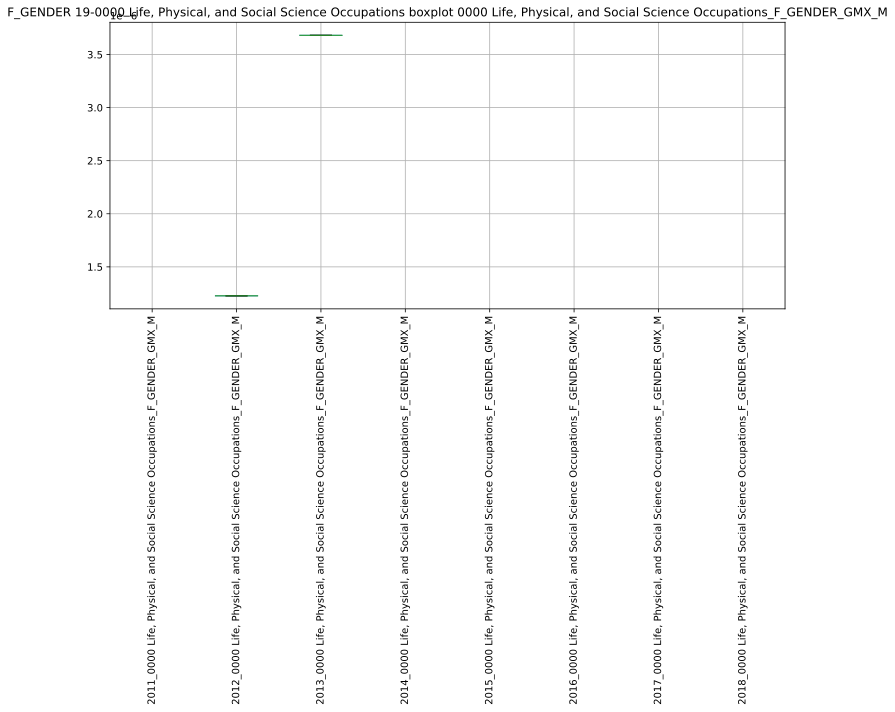

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224042.127856:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224042.164921:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224042.373236:INFO:headless_shell.cc(660)] Written to file /tmp/tmpzujrdxmf/temp.png.
[1013/224042.589461:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224042.626754:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224042.898859:INFO:headless_shell.cc(660)] Written to file /tmp/tmpx7s7zkqe/temp.png.
[1013/224043.162145:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224043.204104:WARNI

,"2011_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2012_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2013_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2014_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2015_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2016_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2017_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2018_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M"
"2011_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan
"2012_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan
"2013_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan
"2014_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan
"2015_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan
"2016_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan
"2017_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan
"2018_0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan


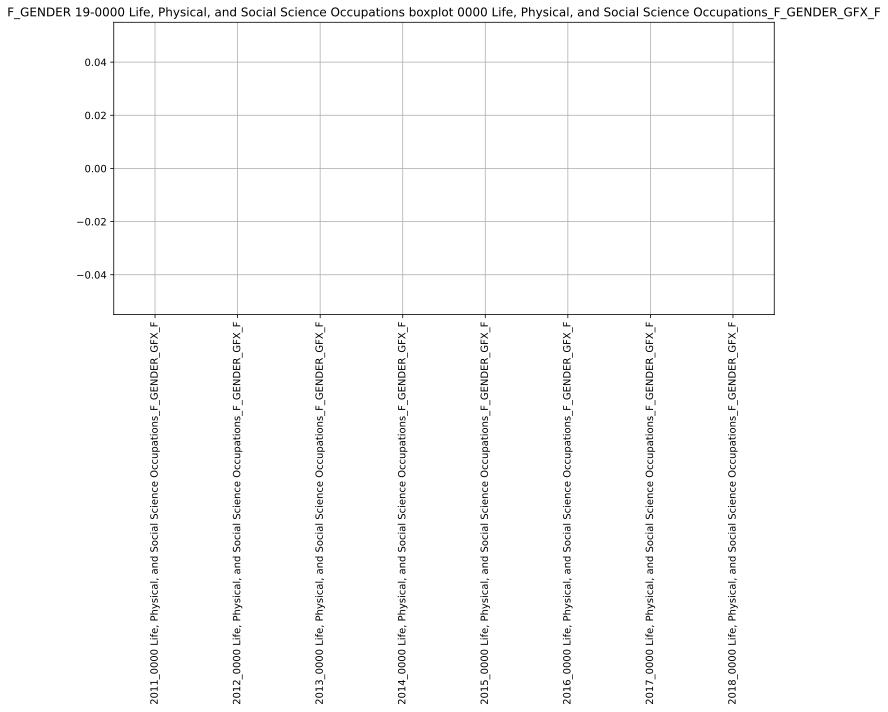

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224047.111785:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224047.148474:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224047.356704:INFO:headless_shell.cc(660)] Written to file /tmp/tmp_lp23aeo/temp.png.
[1013/224047.579581:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224047.619307:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224047.922526:INFO:headless_shell.cc(660)] Written to file /tmp/tmp11s6cn9t/temp.png.
[1013/224048.190203:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224048.229730:WARNI

,"2011_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2012_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2013_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2014_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2015_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2016_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2017_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2018_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F"
"2011_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2012_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2013_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2014_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2015_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2016_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2017_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2018_0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M', '19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F']


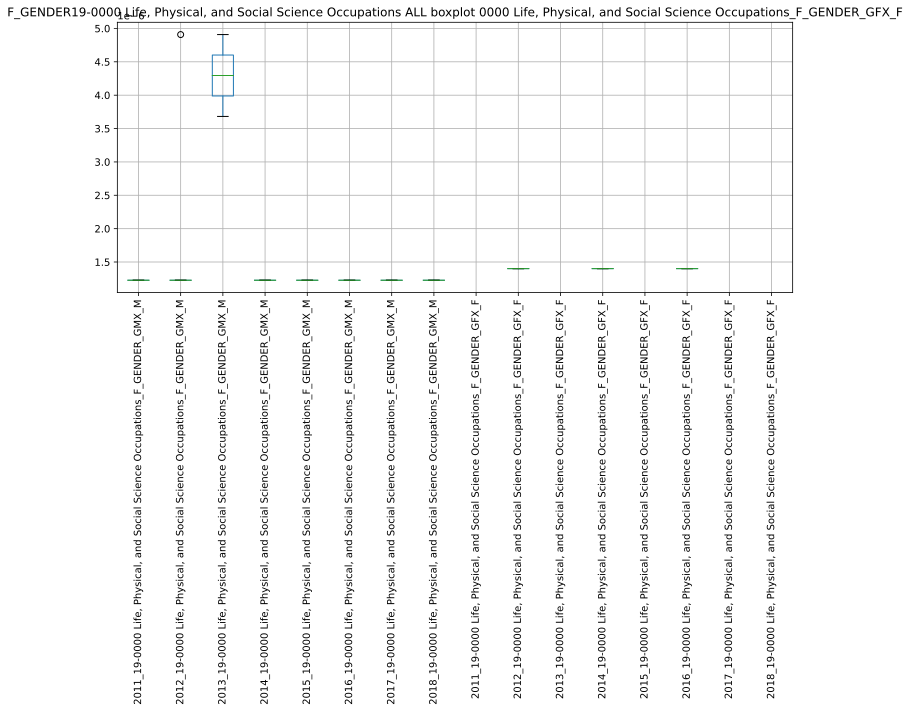

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224052.721120:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224052.760278:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224052.995745:INFO:headless_shell.cc(660)] Written to file /tmp/tmp08x59y14/temp.png.
[1013/224053.216632:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224053.253156:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224053.645484:INFO:headless_shell.cc(660)] Written to file /tmp/tmp9s_gjmtp/temp.png.
[1013/224053.961826:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224054.004834:WARNI

,"2011_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2012_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2013_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2014_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2015_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2016_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2017_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2018_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M","2011_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2012_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2013_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2014_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2015_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2016_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2017_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F","2018_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F"
"2011_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2012_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2013_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2014_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2015_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2016_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2017_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2018_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2011_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2012_19-0000 Life, Physical, and Social Science Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
#####################################

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
########################################## BOX PLOTS ###############################################
['21-0000 Community and Social Service Occupations_F_GENDER_GMX_M', '21-0000 Community and Social Service Occupations_F_GENDER_GFX_F']


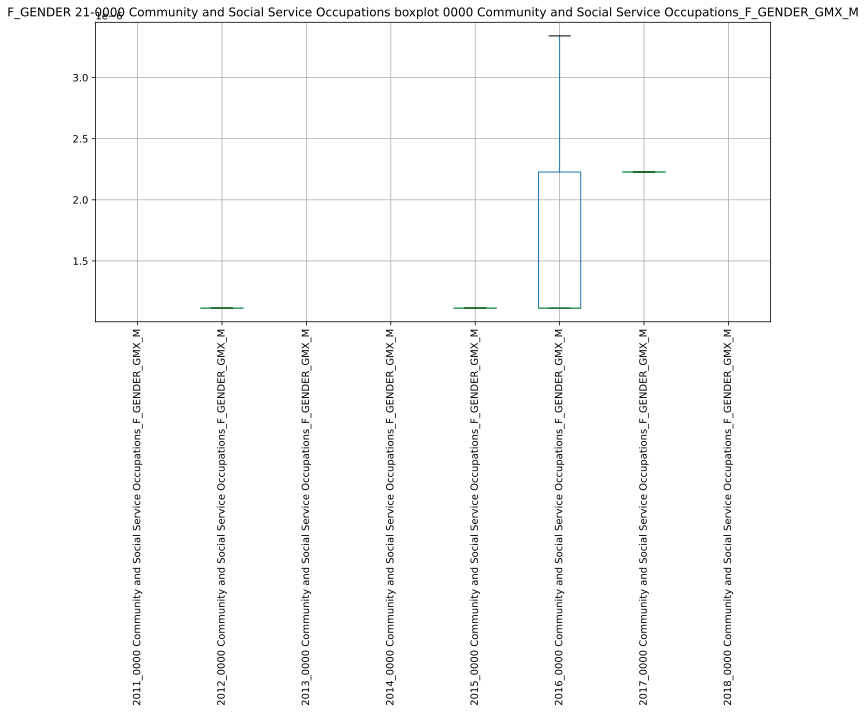

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224103.158682:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224103.195613:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224103.435266:INFO:headless_shell.cc(660)] Written to file /tmp/tmpwm00xfo1/temp.png.
[1013/224103.639617:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224103.680767:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224103.946159:INFO:headless_shell.cc(660)] Written to file /tmp/tmpfo1greu8/temp.png.
[1013/224104.221773:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224104.249904:WARNI

,2011_0000 Community and Social Service Occupations_F_GENDER_GMX_M,2012_0000 Community and Social Service Occupations_F_GENDER_GMX_M,2013_0000 Community and Social Service Occupations_F_GENDER_GMX_M,2014_0000 Community and Social Service Occupations_F_GENDER_GMX_M,2015_0000 Community and Social Service Occupations_F_GENDER_GMX_M,2016_0000 Community and Social Service Occupations_F_GENDER_GMX_M,2017_0000 Community and Social Service Occupations_F_GENDER_GMX_M,2018_0000 Community and Social Service Occupations_F_GENDER_GMX_M
2011_0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,1.000000,nan,nan
2017_0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan


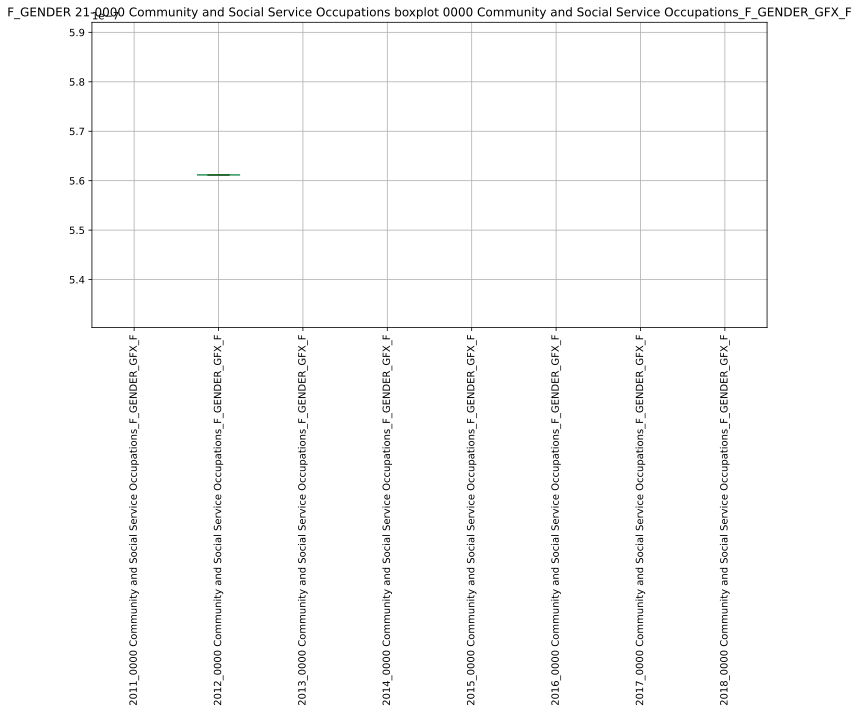

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224108.226755:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224108.263682:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224108.494877:INFO:headless_shell.cc(660)] Written to file /tmp/tmpp5kliydd/temp.png.
[1013/224108.711849:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224108.748806:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224109.039512:INFO:headless_shell.cc(660)] Written to file /tmp/tmpfn5_tdmf/temp.png.
[1013/224109.301035:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224109.339172:WARNI

,2011_0000 Community and Social Service Occupations_F_GENDER_GFX_F,2012_0000 Community and Social Service Occupations_F_GENDER_GFX_F,2013_0000 Community and Social Service Occupations_F_GENDER_GFX_F,2014_0000 Community and Social Service Occupations_F_GENDER_GFX_F,2015_0000 Community and Social Service Occupations_F_GENDER_GFX_F,2016_0000 Community and Social Service Occupations_F_GENDER_GFX_F,2017_0000 Community and Social Service Occupations_F_GENDER_GFX_F,2018_0000 Community and Social Service Occupations_F_GENDER_GFX_F
2011_0000 Community and Social Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Community and Social Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Community and Social Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Community and Social Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Community and Social Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Community and Social Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Community and Social Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Community and Social Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['21-0000 Community and Social Service Occupations_F_GENDER_GMX_M', '21-0000 Community and Social Service Occupations_F_GENDER_GFX_F']


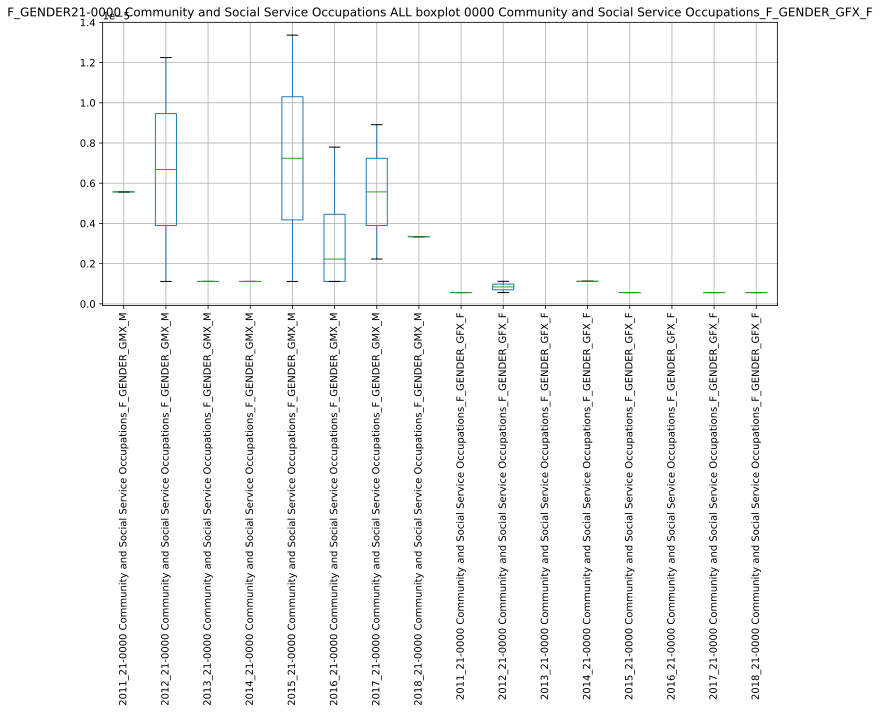

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224112.538326:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224112.576031:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224112.830249:INFO:headless_shell.cc(660)] Written to file /tmp/tmpe64pzus5/temp.png.
[1013/224113.042962:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224113.081003:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224113.485811:INFO:headless_shell.cc(660)] Written to file /tmp/tmpkr2k0m1u/temp.png.
[1013/224113.800084:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224113.838979:WARNI

,2011_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,2012_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,2013_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,2014_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,2015_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,2016_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,2017_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,2018_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,2011_21-0000 Community and Social Service Occupations_F_GENDER_GFX_F,2012_21-0000 Community and Social Service Occupations_F_GENDER_GFX_F,2013_21-0000 Community and Social Service Occupations_F_GENDER_GFX_F,2014_21-0000 Community and Social Service Occupations_F_GENDER_GFX_F,2015_21-0000 Community and Social Service Occupations_F_GENDER_GFX_F,2016_21-0000 Community and Social Service Occupations_F_GENDER_GFX_F,2017_21-0000 Community and Social Service Occupations_F_GENDER_GFX_F,2018_21-0000 Community and Social Service Occupations_F_GENDER_GFX_F
2011_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,1.000000,nan,nan,1.000000,nan,-1.000000,nan,nan,1.000000,nan,nan,nan,nan,nan,nan
2013_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2015_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,1.000000,nan,nan,1.000000,nan,-1.000000,nan,nan,1.000000,nan,nan,nan,nan,nan,nan
2016_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2017_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,-1.000000,nan,nan,-1.000000,nan,1.000000,nan,nan,-1.000000,nan,nan,nan,nan,nan,nan
2018_21-0000 Community and Social Service Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2011_21-0000 Community and Social Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_21-0000 Community and Social Service Occupations_F_GENDER_GFX_F,nan,1.000000,nan,nan,1.000000,nan,-1.000000,nan,nan,1.000000,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
23-0000 Legal Occupations
 
############ OCCUPATION ############
23-0000 Legal Occupations
 
########################################## NEW YEAR ###############################################


/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
23-0000 Legal Occupations
 
############ OCCUPATION ############
23-0000 Legal Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
23-0000 Legal Occupations
 
############ OCCUPATION ############
23-0000 Legal Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
23-0000 Legal Occupations
 
############ OCCUPA

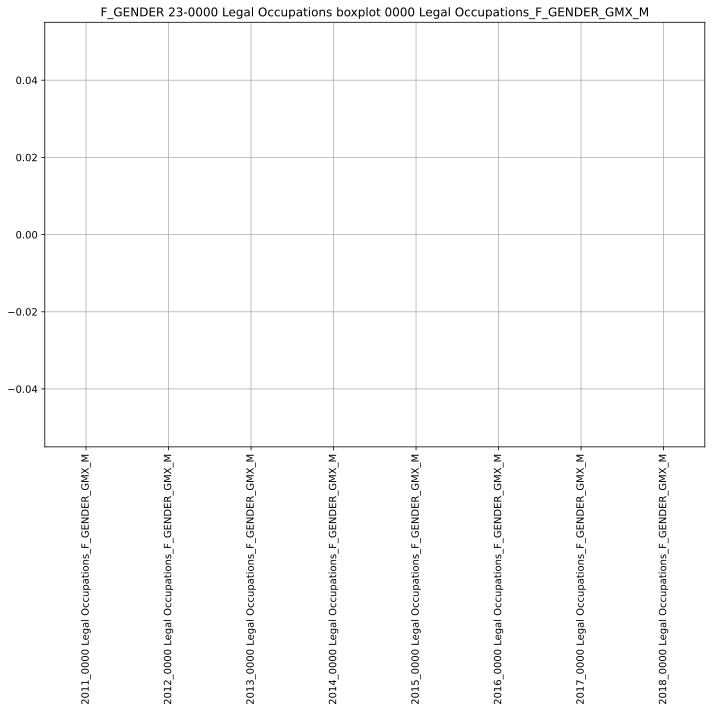

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224122.964770:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224123.001989:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224123.209340:INFO:headless_shell.cc(660)] Written to file /tmp/tmpat7k9a2j/temp.png.
[1013/224123.422684:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224123.459698:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224123.732493:INFO:headless_shell.cc(660)] Written to file /tmp/tmp5hcrcx45/temp.png.
[1013/224124.010641:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224124.038839:WARNI

,2011_0000 Legal Occupations_F_GENDER_GMX_M,2012_0000 Legal Occupations_F_GENDER_GMX_M,2013_0000 Legal Occupations_F_GENDER_GMX_M,2014_0000 Legal Occupations_F_GENDER_GMX_M,2015_0000 Legal Occupations_F_GENDER_GMX_M,2016_0000 Legal Occupations_F_GENDER_GMX_M,2017_0000 Legal Occupations_F_GENDER_GMX_M,2018_0000 Legal Occupations_F_GENDER_GMX_M
2011_0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan


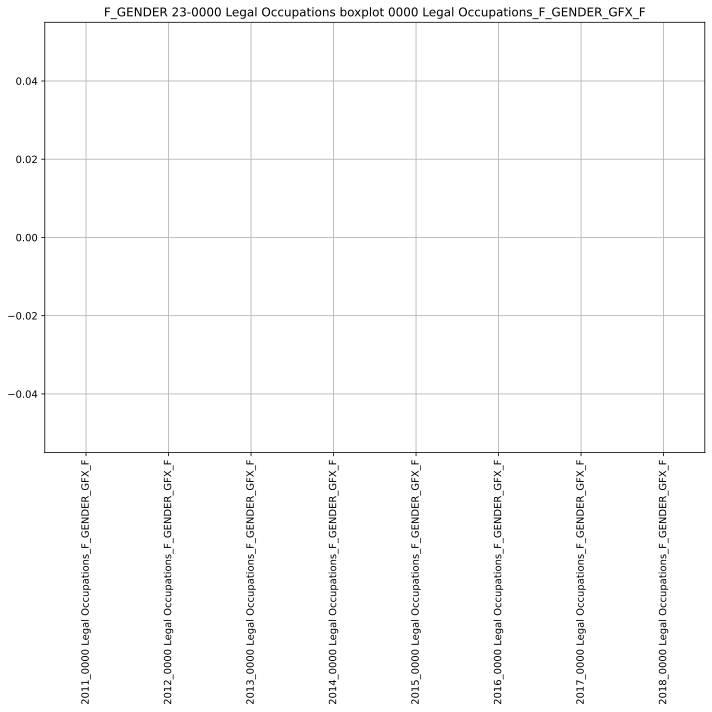

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224126.611806:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224126.649330:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224126.864392:INFO:headless_shell.cc(660)] Written to file /tmp/tmpr3g3apki/temp.png.
[1013/224127.070099:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224127.109266:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224127.381073:INFO:headless_shell.cc(660)] Written to file /tmp/tmptqby6lbc/temp.png.
[1013/224127.643779:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224127.681053:WARNI

,2011_0000 Legal Occupations_F_GENDER_GFX_F,2012_0000 Legal Occupations_F_GENDER_GFX_F,2013_0000 Legal Occupations_F_GENDER_GFX_F,2014_0000 Legal Occupations_F_GENDER_GFX_F,2015_0000 Legal Occupations_F_GENDER_GFX_F,2016_0000 Legal Occupations_F_GENDER_GFX_F,2017_0000 Legal Occupations_F_GENDER_GFX_F,2018_0000 Legal Occupations_F_GENDER_GFX_F
2011_0000 Legal Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Legal Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Legal Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Legal Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Legal Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Legal Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Legal Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Legal Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['23-0000 Legal Occupations_F_GENDER_GMX_M', '23-0000 Legal Occupations_F_GENDER_GFX_F']


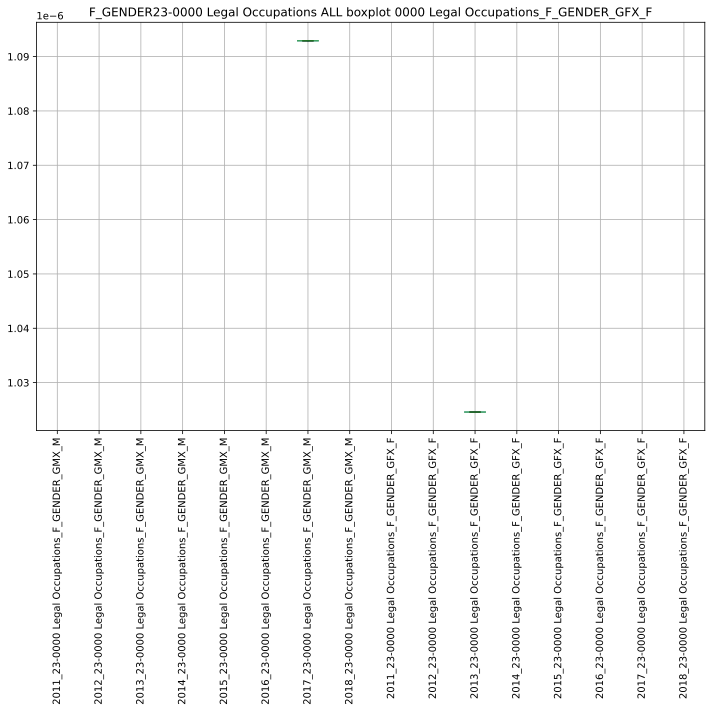

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224130.905139:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224130.942408:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224131.167965:INFO:headless_shell.cc(660)] Written to file /tmp/tmp334qajxx/temp.png.
[1013/224131.390936:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224131.427458:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224131.742550:INFO:headless_shell.cc(660)] Written to file /tmp/tmp1gzoh6ww/temp.png.
[1013/224132.003439:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224132.040889:WARNI

,2011_23-0000 Legal Occupations_F_GENDER_GMX_M,2012_23-0000 Legal Occupations_F_GENDER_GMX_M,2013_23-0000 Legal Occupations_F_GENDER_GMX_M,2014_23-0000 Legal Occupations_F_GENDER_GMX_M,2015_23-0000 Legal Occupations_F_GENDER_GMX_M,2016_23-0000 Legal Occupations_F_GENDER_GMX_M,2017_23-0000 Legal Occupations_F_GENDER_GMX_M,2018_23-0000 Legal Occupations_F_GENDER_GMX_M,2011_23-0000 Legal Occupations_F_GENDER_GFX_F,2012_23-0000 Legal Occupations_F_GENDER_GFX_F,2013_23-0000 Legal Occupations_F_GENDER_GFX_F,2014_23-0000 Legal Occupations_F_GENDER_GFX_F,2015_23-0000 Legal Occupations_F_GENDER_GFX_F,2016_23-0000 Legal Occupations_F_GENDER_GFX_F,2017_23-0000 Legal Occupations_F_GENDER_GFX_F,2018_23-0000 Legal Occupations_F_GENDER_GFX_F
2011_23-0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_23-0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013_23-0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014_23-0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2015_23-0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2016_23-0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2017_23-0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2018_23-0000 Legal Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2011_23-0000 Legal Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_23-0000 Legal Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
25-0000 Educational Instruction and Library Occupations
 
############ OCCUPATION ############
25-0000 Educational Instruction and Library Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
25-0000 Educational Instruction and Library Occupations
 
############ OCCUPATION ############
25-0000 Educational Instruction and Library Occupations
 
#########

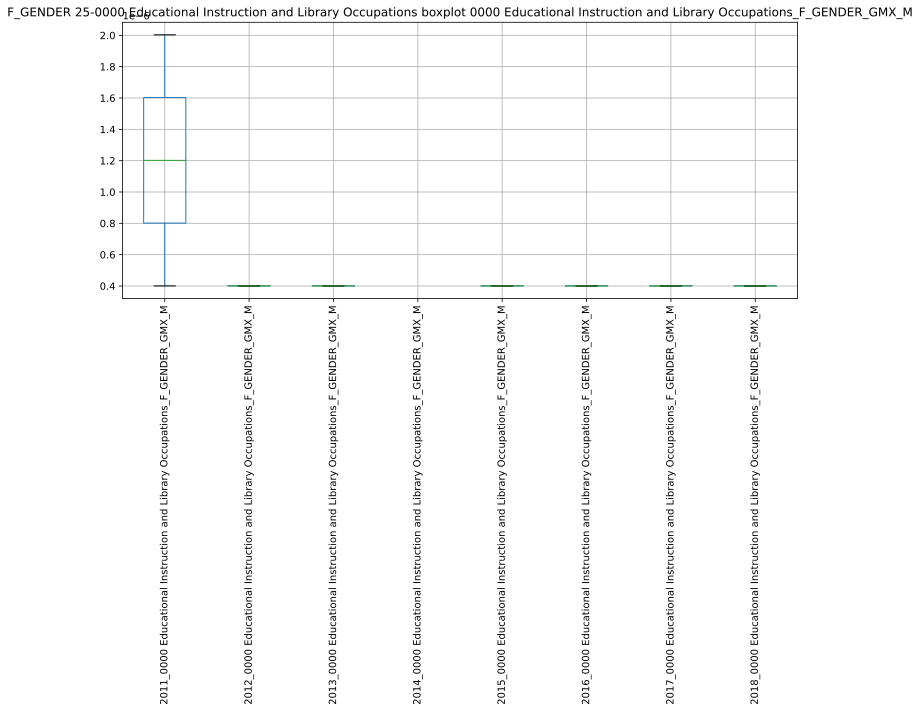

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224137.412071:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224137.452979:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224137.662746:INFO:headless_shell.cc(660)] Written to file /tmp/tmp66txlt_r/temp.png.
[1013/224137.880648:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224137.921172:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224138.214071:INFO:headless_shell.cc(660)] Written to file /tmp/tmpa4aci12f/temp.png.
[1013/224138.482862:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224138.519728:WARNI

,2011_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2012_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2013_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2014_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2015_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2016_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2017_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2018_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M
2011_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,1.000000,nan,nan,nan,nan,nan,nan,nan
2012_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan


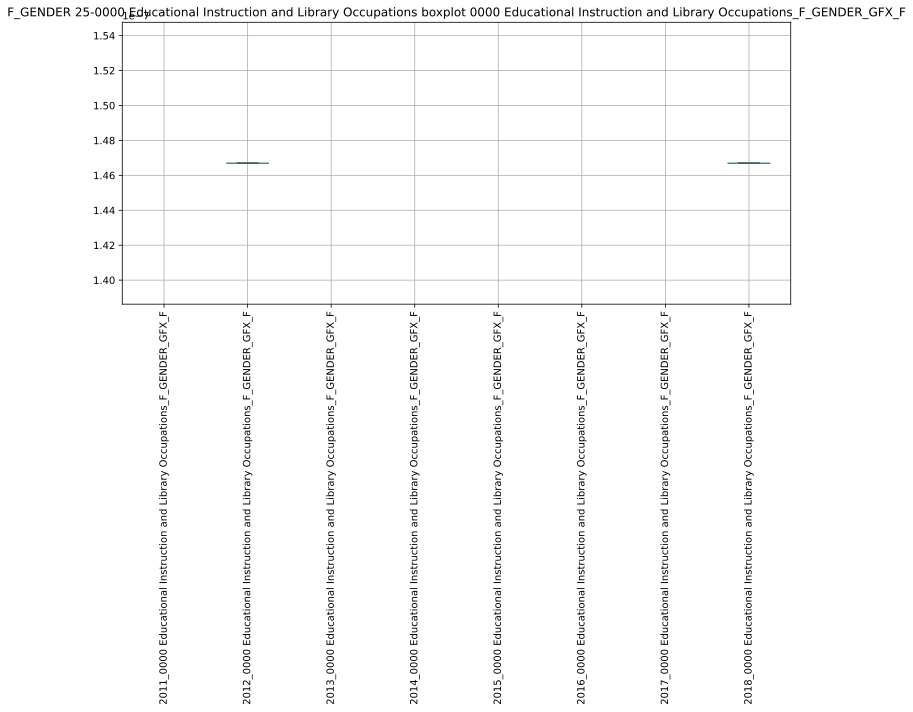

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224142.603002:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224142.639921:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224142.861263:INFO:headless_shell.cc(660)] Written to file /tmp/tmplgn3vque/temp.png.
[1013/224143.086038:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224143.125520:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224143.406783:INFO:headless_shell.cc(660)] Written to file /tmp/tmpiecn5hor/temp.png.
[1013/224143.675712:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224143.710302:WARNI

,2011_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2012_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2013_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2014_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2015_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2016_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2017_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2018_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F
2011_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M', '25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F']


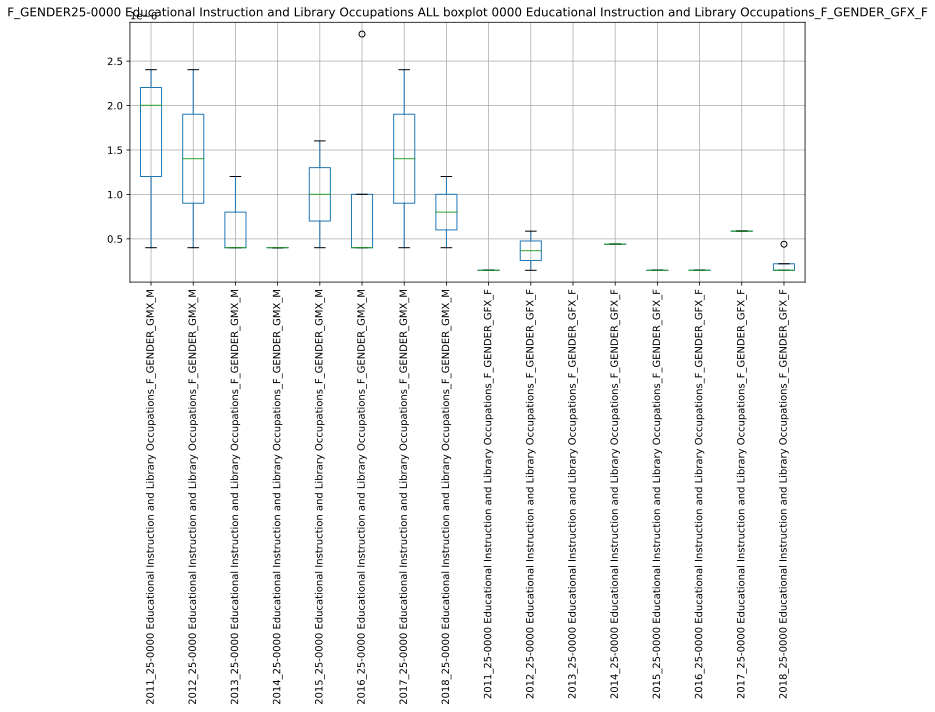

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224148.351540:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224148.389119:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224148.603948:INFO:headless_shell.cc(660)] Written to file /tmp/tmpaczuvt2u/temp.png.
[1013/224148.804009:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224148.841248:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224149.239404:INFO:headless_shell.cc(660)] Written to file /tmp/tmp86klyzvs/temp.png.
[1013/224149.549252:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224149.587241:WARNI

,2011_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2012_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2013_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2014_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2015_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2016_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2017_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2018_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,2011_25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2012_25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2013_25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2014_25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2015_25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2016_25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2017_25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,2018_25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F
2011_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,1.000000,1.000000,0.654654,nan,-1.000000,nan,-1.000000,-1.000000,nan,1.000000,nan,nan,nan,nan,nan,nan
2012_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,1.000000,1.000000,nan,nan,-1.000000,nan,-1.000000,-1.000000,nan,1.000000,nan,nan,nan,nan,nan,nan
2013_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,0.654654,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2015_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,-1.000000,-1.000000,nan,nan,1.000000,nan,1.000000,1.000000,nan,-1.000000,nan,nan,nan,nan,nan,nan
2016_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000
2017_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,-1.000000,-1.000000,nan,nan,1.000000,nan,1.000000,1.000000,nan,-1.000000,nan,nan,nan,nan,nan,nan
2018_25-0000 Educational Instruction and Library Occupations_F_GENDER_GMX_M,-1.000000,-1.000000,nan,nan,1.000000,nan,1.000000,1.000000,nan,-1.000000,nan,nan,nan,nan,nan,nan
2011_25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_25-0000 Educational Instruction and Library Occupations_F_GENDER_GFX_F,1.000000,1.000000,nan,nan,-1.000000,nan,-1.000000,-1.000000,nan,1.000000,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
27-0000 Arts, Design, Entertainment, Sports, and Media Occupations
 
############ OCCUPATION ############
27-0000 Arts, Design, Entertainment, Sports, and Media Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
27-0000 Arts, Design, Entertainment, Sports, and Media Occupations
 
############ OCCUPATION ############
27-0000 Arts, Design, Entertainmen

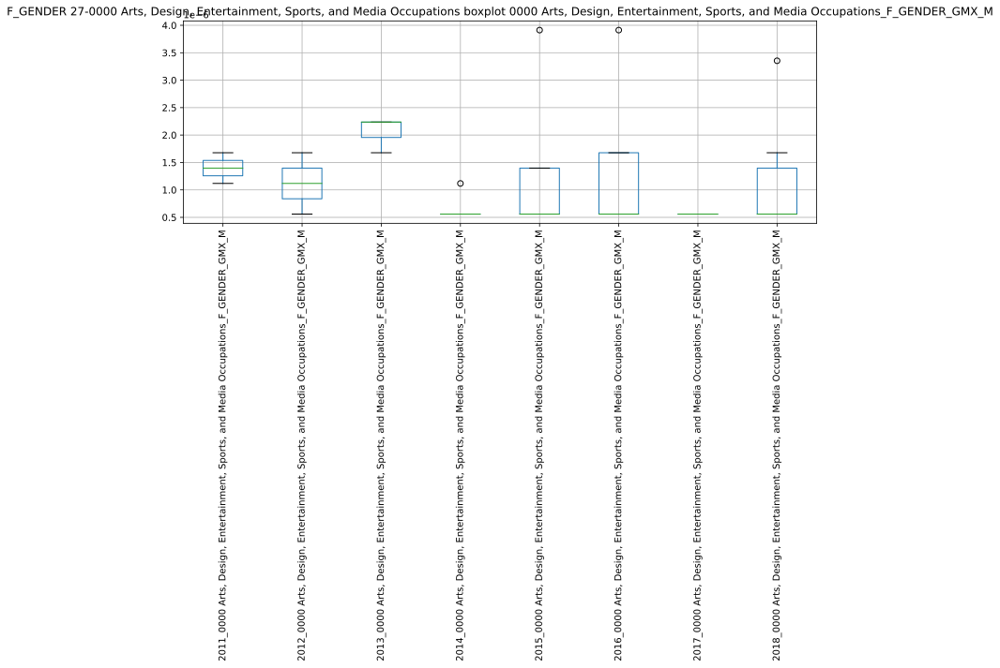

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224158.899087:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224158.938497:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224159.180099:INFO:headless_shell.cc(660)] Written to file /tmp/tmpa6dd10_d/temp.png.
[1013/224159.409161:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224159.448399:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224159.764275:INFO:headless_shell.cc(660)] Written to file /tmp/tmpw3_7qec8/temp.png.
[1013/224200.008885:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224200.047180:WARNI

,"2011_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2012_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2013_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2014_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2015_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2016_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2017_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2018_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M"
"2011_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",1.000000,nan,nan,nan,nan,nan,nan,-1.000000
"2012_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",nan,1.000000,nan,nan,nan,-1.000000,nan,nan
"2013_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",nan,nan,1.000000,nan,nan,nan,nan,0.327327
"2014_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",nan,nan,nan,1.000000,nan,nan,nan,nan
"2015_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,1.000000,0.944911,nan,nan
"2016_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",nan,-1.000000,nan,nan,0.944911,1.000000,nan,-0.522233
"2017_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",nan,nan,nan,nan,nan,nan,nan,nan
"2018_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",-1.000000,nan,0.327327,nan,nan,-0.522233,nan,1.000000


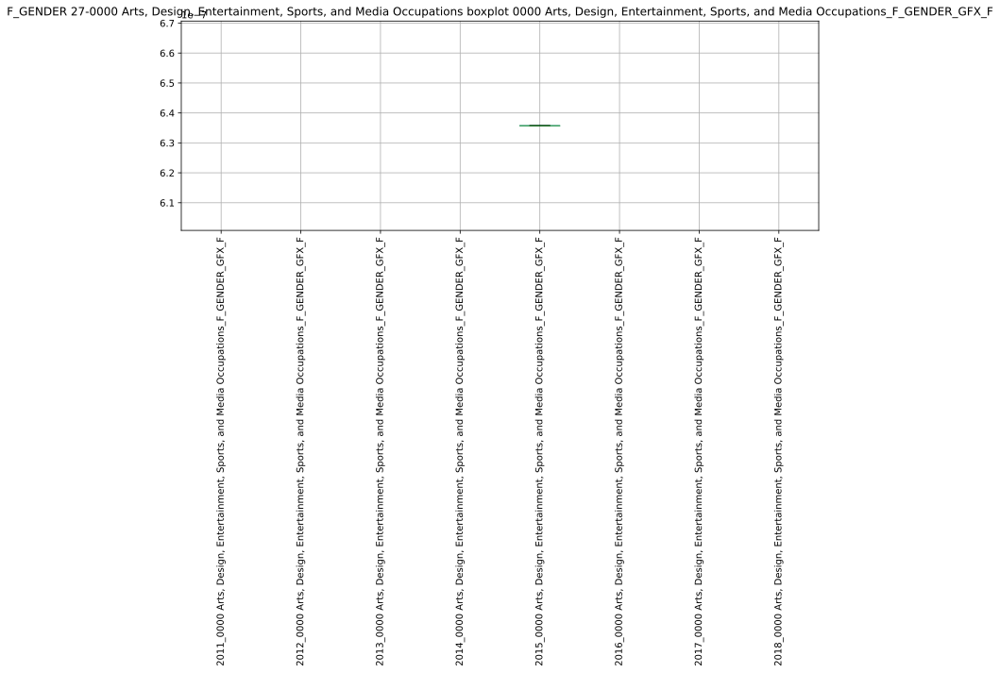

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224204.106508:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224204.144405:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224204.371698:INFO:headless_shell.cc(660)] Written to file /tmp/tmpg7u7_f4f/temp.png.
[1013/224204.591592:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224204.632586:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224204.892331:INFO:headless_shell.cc(660)] Written to file /tmp/tmpsi68auhz/temp.png.
[1013/224205.154036:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224205.194420:WARNI

,"2011_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2012_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2013_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2014_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2015_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2016_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2017_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2018_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F"
"2011_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2012_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2013_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2014_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2015_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2016_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2017_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2018_0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M', '27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F']


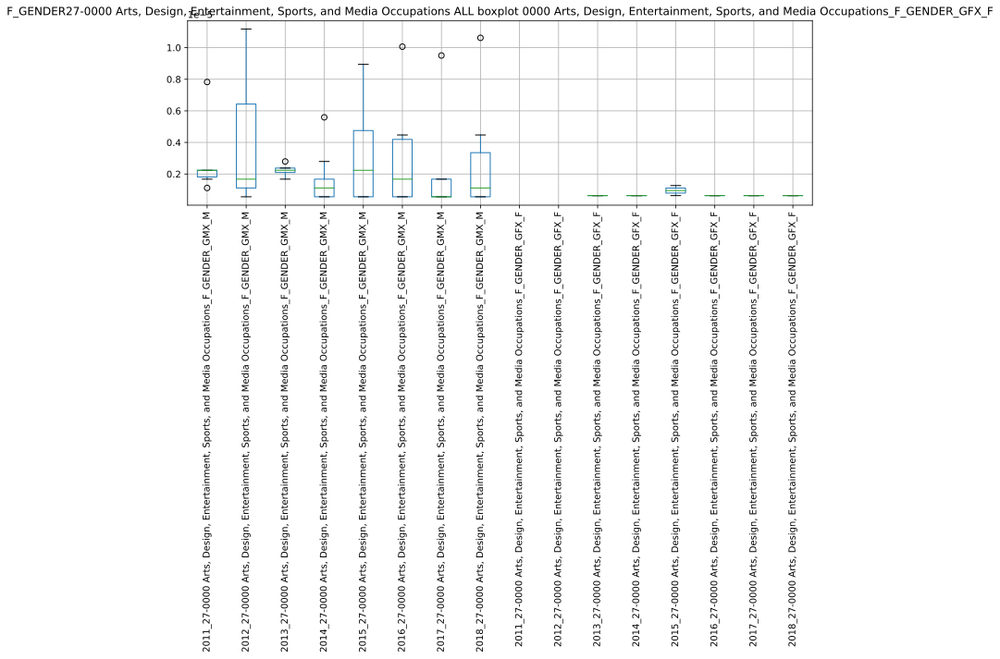

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224209.822404:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224209.862636:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224210.101997:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxpwe220h/temp.png.
[1013/224210.342794:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224210.379913:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224210.781546:INFO:headless_shell.cc(660)] Written to file /tmp/tmppztaf9xd/temp.png.
[1013/224211.093541:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224211.134479:WARNI

,"2011_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2012_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2013_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2014_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2015_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2016_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2017_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2018_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M","2011_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2012_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2013_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2014_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2015_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2016_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2017_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F","2018_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F"
"2011_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",1.000000,-0.580651,0.753778,0.822546,0.195590,0.061165,-0.389419,0.900550,nan,nan,nan,nan,-1.000000,nan,nan,nan
"2012_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",-0.580651,1.000000,-0.095783,-0.739780,0.993130,0.899870,nan,-0.620182,nan,nan,nan,nan,1.000000,nan,nan,nan
"2013_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",0.753778,-0.095783,1.000000,0.739923,-0.132020,0.347571,-0.000000,0.837530,nan,nan,nan,nan,-1.000000,nan,nan,nan
"2014_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",0.822546,-0.739780,0.739923,1.000000,-0.023076,0.035272,0.238904,0.848626,nan,nan,nan,nan,-1.000000,nan,nan,nan
"2015_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",0.195590,0.993130,-0.132020,-0.023076,1.000000,0.696430,-0.445857,-0.045770,nan,nan,nan,nan,1.000000,nan,nan,nan
"2016_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",0.061165,0.899870,0.347571,0.035272,0.696430,1.000000,0.093962,0.098852,nan,nan,nan,nan,1.000000,nan,nan,nan
"2017_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",-0.389419,nan,-0.000000,0.238904,-0.445857,0.093962,1.000000,0.042868,nan,nan,nan,nan,nan,nan,nan,nan
"2018_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GMX_M",0.900550,-0.620182,0.837530,0.848626,-0.045770,0.098852,0.042868,1.000000,nan,nan,nan,nan,-1.000000,nan,nan,nan
"2011_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2012_27-0000 Arts, Design, Entertainment, Sports, and Media Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
29-0000 Healthcare Practitioners and Technical Occupations
 
############ OCCUPATION ############
29-0000 Healthcare Practitioners and Technical Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
29-0000 Healthcare Practitioners and Technical Occupations
 
############ OCCUPATION ############
29-0000 Healthcare Practitioners and Technical Occupations

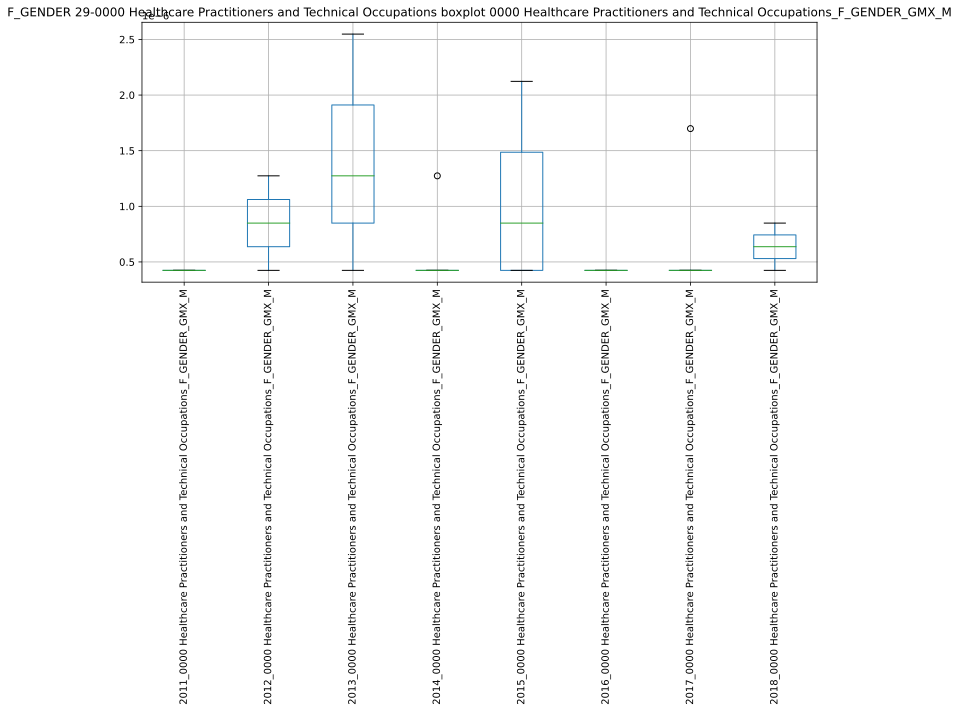

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224224.219368:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224224.262275:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224224.477446:INFO:headless_shell.cc(660)] Written to file /tmp/tmpvz_auv30/temp.png.
[1013/224224.697337:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224224.735123:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224225.038510:INFO:headless_shell.cc(660)] Written to file /tmp/tmpcnaqd8r9/temp.png.
[1013/224225.300079:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224225.341081:WARNI

,2011_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2012_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2013_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2014_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2015_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2016_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2017_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2018_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M
2011_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,nan,1.000000,-1.000000,-1.000000,1.000000,nan,1.000000,1.000000
2013_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,nan,-1.000000,1.000000,0.917663,-0.397360,nan,-1.000000,-1.000000
2014_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,nan,-1.000000,0.917663,1.000000,0.174078,nan,-0.333333,-1.000000
2015_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,nan,1.000000,-0.397360,0.174078,1.000000,nan,0.866025,1.000000
2016_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,nan,1.000000,-1.000000,-0.333333,0.866025,nan,1.000000,1.000000
2018_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,nan,1.000000,-1.000000,-1.000000,1.000000,nan,1.000000,1.000000


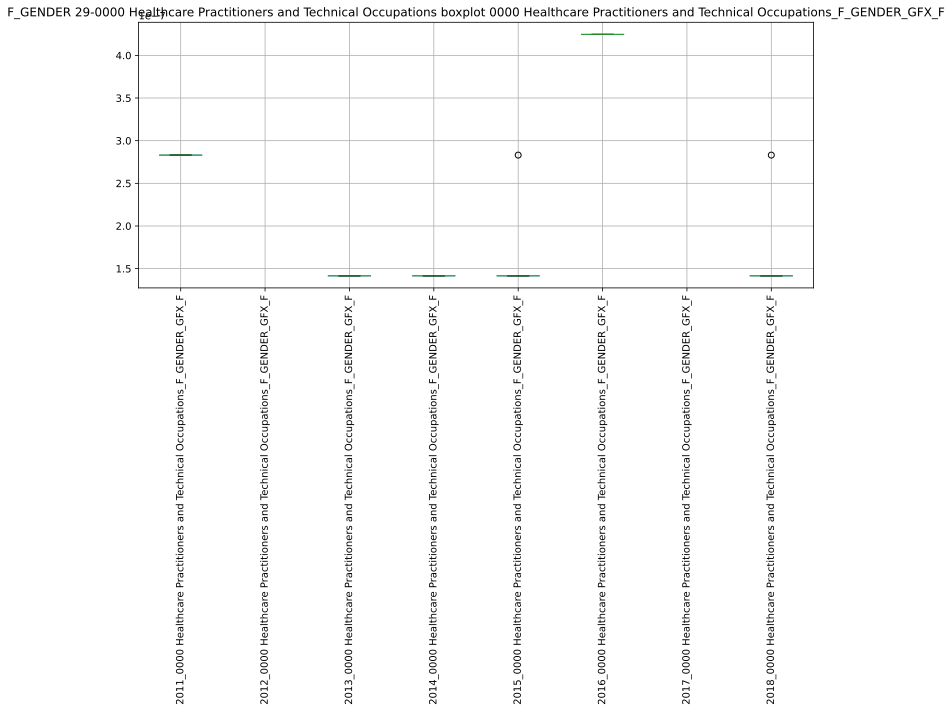

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224229.418811:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224229.470623:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224229.680995:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxs7d6yj8/temp.png.
[1013/224229.893520:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224229.930609:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224230.233760:INFO:headless_shell.cc(660)] Written to file /tmp/tmpgife9n0f/temp.png.
[1013/224230.493724:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224230.531749:WARNI

,2011_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2012_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2013_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2014_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2015_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2016_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2017_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2018_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F
2011_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,1.000000,nan,nan,nan
2016_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,1.000000


########################################## CORRELATIONS ###############################################
['29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M', '29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F']


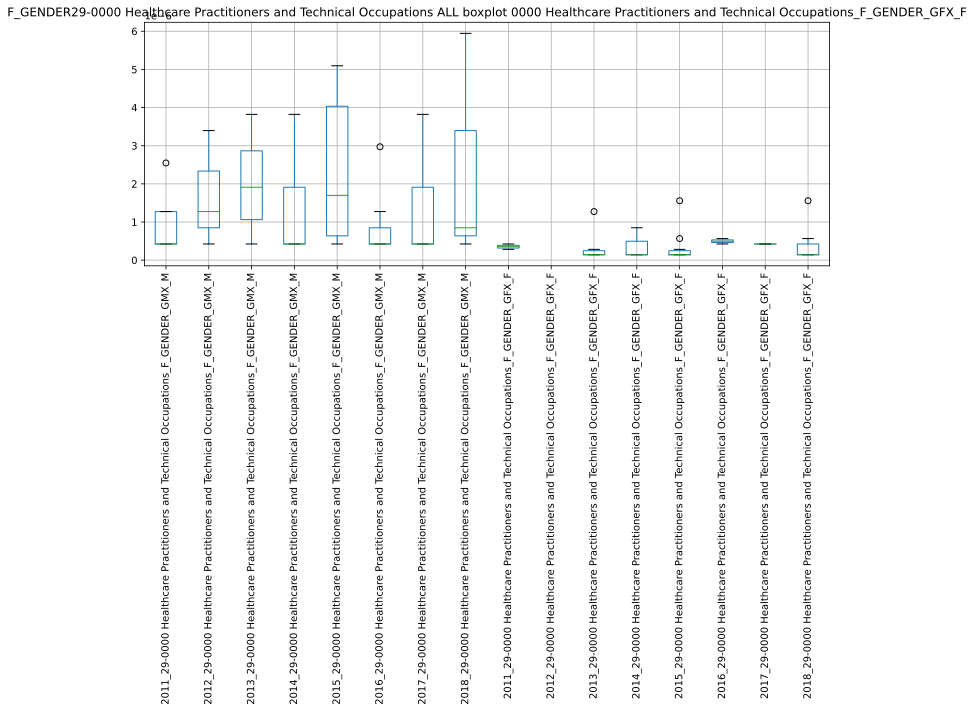

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224235.030440:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224235.068318:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224235.306672:INFO:headless_shell.cc(660)] Written to file /tmp/tmpvd_nccqw/temp.png.
[1013/224235.530495:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224235.567650:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224235.970408:INFO:headless_shell.cc(660)] Written to file /tmp/tmpcpl2s93i/temp.png.
[1013/224236.290257:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224236.330890:WARNI

,2011_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2012_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2013_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2014_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2015_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2016_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2017_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2018_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,2011_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2012_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2013_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2014_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2015_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2016_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2017_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,2018_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F
2011_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,1.000000,-0.240192,-0.907265,0.573611,-0.396111,0.066667,0.077762,-0.438948,1.000000,nan,0.724066,-0.500000,-0.130889,1.000000,nan,0.405551
2012_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,-0.240192,1.000000,0.583324,0.771454,0.997701,nan,0.866025,0.977641,1.000000,nan,-0.240192,-0.720577,nan,1.000000,nan,0.960769
2013_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,-0.907265,0.583324,1.000000,0.957255,0.681390,-0.333333,-0.237804,0.741081,-1.000000,nan,-0.782922,0.142857,nan,-1.000000,nan,-0.259851
2014_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,0.573611,0.771454,0.957255,1.000000,0.551149,-0.395594,-0.206430,0.888004,-1.000000,nan,-0.320558,-0.114708,-0.218159,-1.000000,nan,-0.014156
2015_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,-0.396111,0.997701,0.681390,0.551149,1.000000,-0.270244,-0.146592,0.989644,1.000000,nan,-0.108351,-0.671932,-0.450940,1.000000,nan,-0.391725
2016_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,0.066667,nan,-0.333333,-0.395594,-0.270244,1.000000,0.736691,nan,nan,nan,-0.154371,nan,-0.247347,nan,nan,0.874718
2017_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,0.077762,0.866025,-0.237804,-0.206430,-0.146592,0.736691,1.000000,0.741521,1.000000,nan,0.184466,-0.970725,-0.341660,1.000000,nan,0.790850
2018_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GMX_M,-0.438948,0.977641,0.741081,0.888004,0.989644,nan,0.741521,1.000000,1.000000,nan,-0.438948,-0.558661,nan,1.000000,nan,0.997609
2011_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,1.000000,1.000000,-1.000000,-1.000000,1.000000,nan,1.000000,1.000000,1.000000,nan,1.000000,-1.000000,nan,1.000000,nan,nan
2012_29-0000 Healthcare Practitioners and Technical Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
31-0000 Healthcare Support Occupations
 
############ OCCUPATION ############
31-0000 Healthcare Support Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
31-0000 Healthcare Support Occupations
 
############ OCCUPATION ############
31-0000 Healthcare Support Occupations
 
########################################## NEW YEAR #########################

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
31-0000 Healthcare Support Occupations
 
############ OCCUPATION ############
31-0000 Healthcare Support Occupations
 
########################################## BOX PLOTS ###############################################
['31-0000 Healthcare Support Occupations_F_GENDER_GMX_M', '31-0000 Healthcare Support Occupations_F_GENDER_GFX_F']


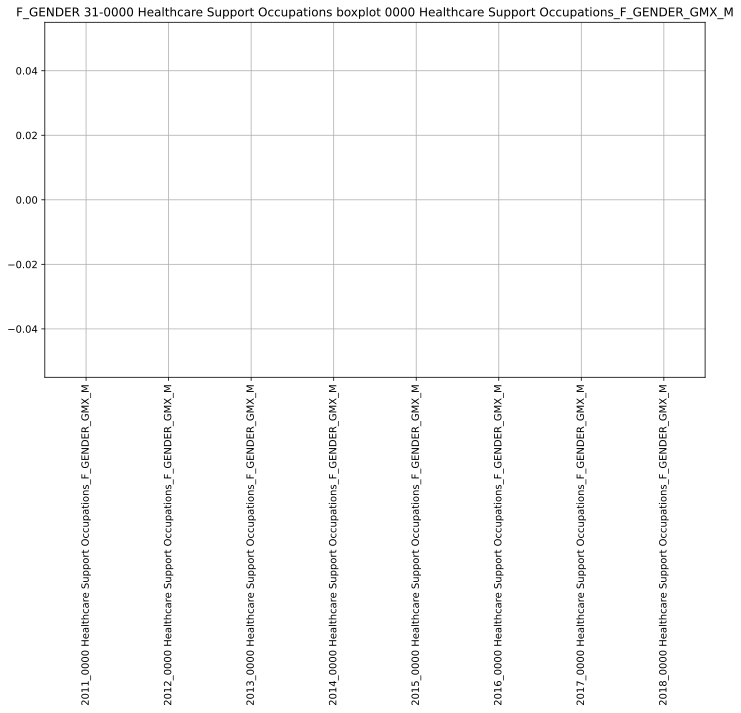

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224245.632951:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224245.674929:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224245.887196:INFO:headless_shell.cc(660)] Written to file /tmp/tmpgc65c72h/temp.png.
[1013/224246.098645:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224246.135485:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224246.406335:INFO:headless_shell.cc(660)] Written to file /tmp/tmpc72j0w1y/temp.png.
[1013/224246.690271:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224246.720983:WARNI

,2011_0000 Healthcare Support Occupations_F_GENDER_GMX_M,2012_0000 Healthcare Support Occupations_F_GENDER_GMX_M,2013_0000 Healthcare Support Occupations_F_GENDER_GMX_M,2014_0000 Healthcare Support Occupations_F_GENDER_GMX_M,2015_0000 Healthcare Support Occupations_F_GENDER_GMX_M,2016_0000 Healthcare Support Occupations_F_GENDER_GMX_M,2017_0000 Healthcare Support Occupations_F_GENDER_GMX_M,2018_0000 Healthcare Support Occupations_F_GENDER_GMX_M
2011_0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan


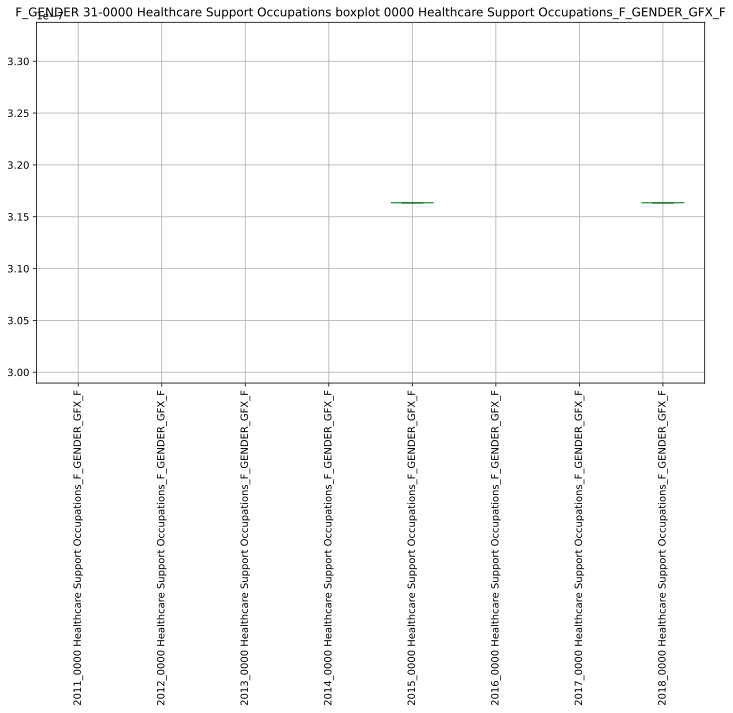

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224249.360308:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224249.388682:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224249.605603:INFO:headless_shell.cc(660)] Written to file /tmp/tmpztr0g4dl/temp.png.
[1013/224249.826031:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224249.864412:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224250.165737:INFO:headless_shell.cc(660)] Written to file /tmp/tmph1iityzl/temp.png.
[1013/224250.419754:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224250.456637:WARNI

,2011_0000 Healthcare Support Occupations_F_GENDER_GFX_F,2012_0000 Healthcare Support Occupations_F_GENDER_GFX_F,2013_0000 Healthcare Support Occupations_F_GENDER_GFX_F,2014_0000 Healthcare Support Occupations_F_GENDER_GFX_F,2015_0000 Healthcare Support Occupations_F_GENDER_GFX_F,2016_0000 Healthcare Support Occupations_F_GENDER_GFX_F,2017_0000 Healthcare Support Occupations_F_GENDER_GFX_F,2018_0000 Healthcare Support Occupations_F_GENDER_GFX_F
2011_0000 Healthcare Support Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Healthcare Support Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Healthcare Support Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Healthcare Support Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Healthcare Support Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Healthcare Support Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Healthcare Support Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Healthcare Support Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['31-0000 Healthcare Support Occupations_F_GENDER_GMX_M', '31-0000 Healthcare Support Occupations_F_GENDER_GFX_F']


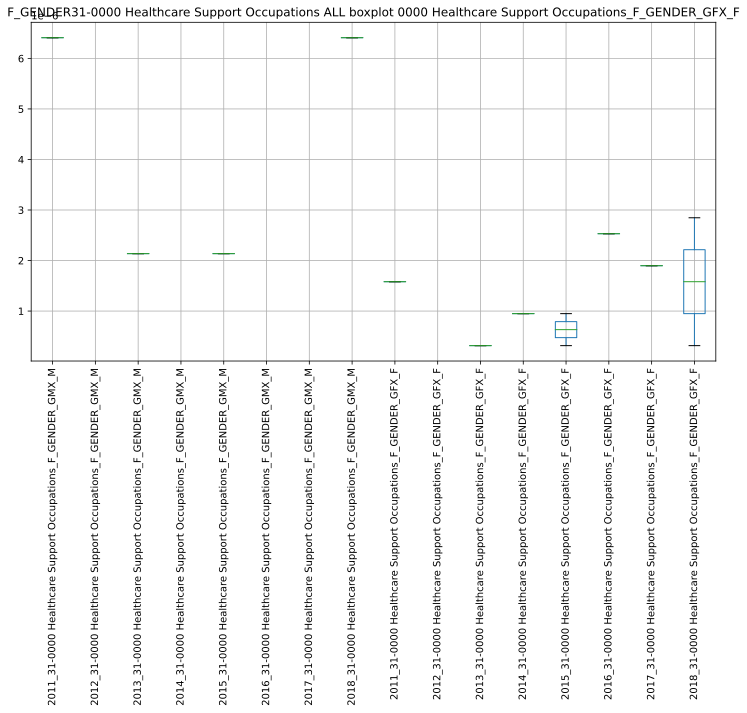

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224253.528880:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224253.569028:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224253.796665:INFO:headless_shell.cc(660)] Written to file /tmp/tmpevmkm4z2/temp.png.
[1013/224254.027799:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224254.068641:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224254.389309:INFO:headless_shell.cc(660)] Written to file /tmp/tmppdecvf2r/temp.png.
[1013/224254.653613:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224254.690804:WARNI

,2011_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,2012_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,2013_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,2014_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,2015_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,2016_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,2017_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,2018_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,2011_31-0000 Healthcare Support Occupations_F_GENDER_GFX_F,2012_31-0000 Healthcare Support Occupations_F_GENDER_GFX_F,2013_31-0000 Healthcare Support Occupations_F_GENDER_GFX_F,2014_31-0000 Healthcare Support Occupations_F_GENDER_GFX_F,2015_31-0000 Healthcare Support Occupations_F_GENDER_GFX_F,2016_31-0000 Healthcare Support Occupations_F_GENDER_GFX_F,2017_31-0000 Healthcare Support Occupations_F_GENDER_GFX_F,2018_31-0000 Healthcare Support Occupations_F_GENDER_GFX_F
2011_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2015_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2016_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2017_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2018_31-0000 Healthcare Support Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2011_31-0000 Healthcare Support Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_31-0000 Healthcare Support Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
33-0000 Protective Service Occupations
 
############ OCCUPATION ############
33-0000 Protective Service Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
33-0000 Protective Service Occupations
 
############ OCCUPATION ############
33-0000 Protective Service Occupations
 
########################################## NEW YEAR #########################

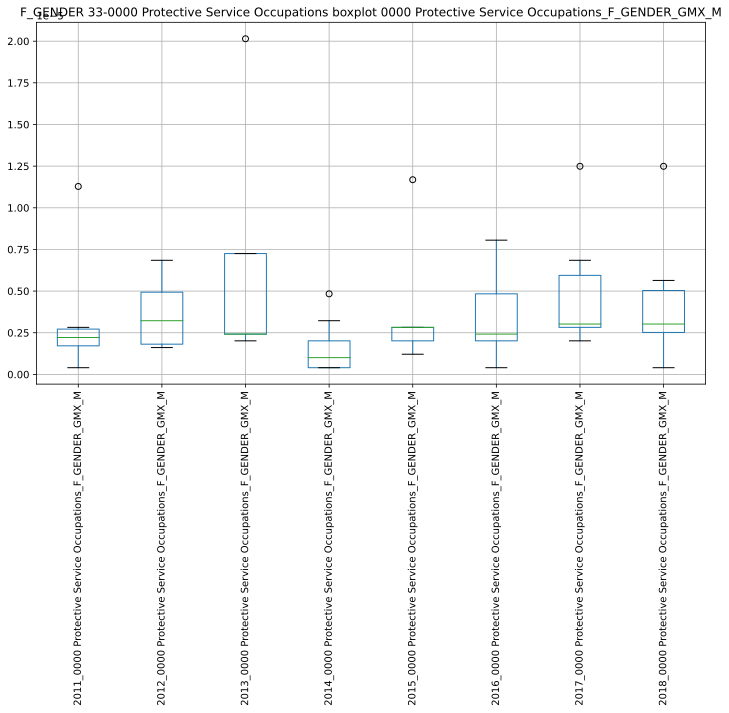

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224302.029713:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224302.067616:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224302.292717:INFO:headless_shell.cc(660)] Written to file /tmp/tmpve3_ew6m/temp.png.
[1013/224302.516020:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224302.555821:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224302.856718:INFO:headless_shell.cc(660)] Written to file /tmp/tmprzf7p_kz/temp.png.
[1013/224303.122187:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224303.161637:WARNI

,2011_0000 Protective Service Occupations_F_GENDER_GMX_M,2012_0000 Protective Service Occupations_F_GENDER_GMX_M,2013_0000 Protective Service Occupations_F_GENDER_GMX_M,2014_0000 Protective Service Occupations_F_GENDER_GMX_M,2015_0000 Protective Service Occupations_F_GENDER_GMX_M,2016_0000 Protective Service Occupations_F_GENDER_GMX_M,2017_0000 Protective Service Occupations_F_GENDER_GMX_M,2018_0000 Protective Service Occupations_F_GENDER_GMX_M
2011_0000 Protective Service Occupations_F_GENDER_GMX_M,1.000000,0.378004,-0.914702,0.339950,0.993824,0.176085,-0.240942,0.963086
2012_0000 Protective Service Occupations_F_GENDER_GMX_M,0.378004,1.000000,-0.500000,-0.504147,0.393343,0.034266,0.510507,0.233740
2013_0000 Protective Service Occupations_F_GENDER_GMX_M,-0.914702,-0.500000,1.000000,-0.064150,-0.098513,0.218989,-0.124534,-0.578581
2014_0000 Protective Service Occupations_F_GENDER_GMX_M,0.339950,-0.504147,-0.064150,1.000000,-1.000000,0.892206,0.085819,0.816026
2015_0000 Protective Service Occupations_F_GENDER_GMX_M,0.993824,0.393343,-0.098513,-1.000000,1.000000,0.194320,-0.514136,0.926752
2016_0000 Protective Service Occupations_F_GENDER_GMX_M,0.176085,0.034266,0.218989,0.892206,0.194320,1.000000,0.833971,0.415900
2017_0000 Protective Service Occupations_F_GENDER_GMX_M,-0.240942,0.510507,-0.124534,0.085819,-0.514136,0.833971,1.000000,-0.248677
2018_0000 Protective Service Occupations_F_GENDER_GMX_M,0.963086,0.233740,-0.578581,0.816026,0.926752,0.415900,-0.248677,1.000000


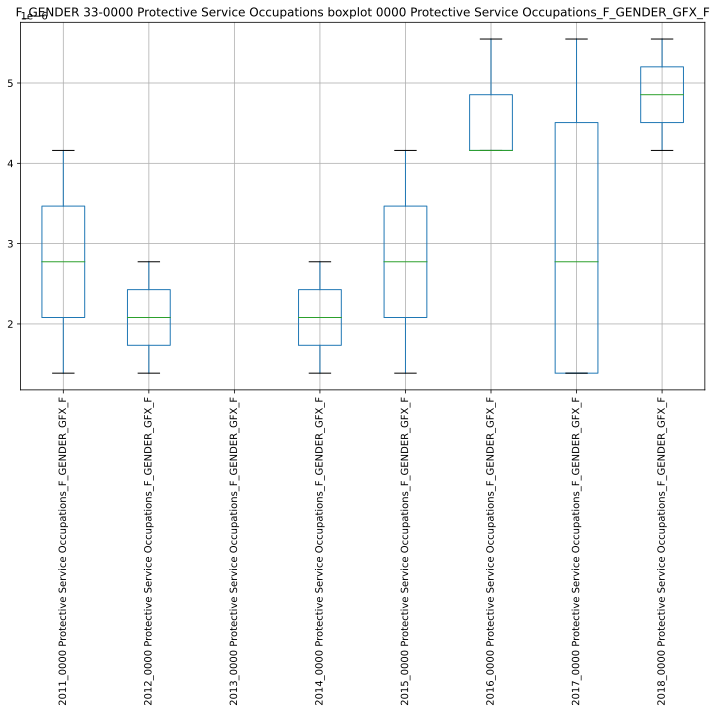

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224305.782215:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224305.820043:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224306.017202:INFO:headless_shell.cc(660)] Written to file /tmp/tmpf7p39nbt/temp.png.
[1013/224306.234081:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224306.272249:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224306.552446:INFO:headless_shell.cc(660)] Written to file /tmp/tmpli3zfstn/temp.png.
[1013/224306.809777:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224306.847467:WARNI

,2011_0000 Protective Service Occupations_F_GENDER_GFX_F,2012_0000 Protective Service Occupations_F_GENDER_GFX_F,2013_0000 Protective Service Occupations_F_GENDER_GFX_F,2014_0000 Protective Service Occupations_F_GENDER_GFX_F,2015_0000 Protective Service Occupations_F_GENDER_GFX_F,2016_0000 Protective Service Occupations_F_GENDER_GFX_F,2017_0000 Protective Service Occupations_F_GENDER_GFX_F,2018_0000 Protective Service Occupations_F_GENDER_GFX_F
2011_0000 Protective Service Occupations_F_GENDER_GFX_F,1.000000,nan,nan,1.000000,nan,nan,nan,1.000000
2012_0000 Protective Service Occupations_F_GENDER_GFX_F,nan,1.000000,nan,nan,1.000000,1.000000,nan,nan
2013_0000 Protective Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Protective Service Occupations_F_GENDER_GFX_F,1.000000,nan,nan,1.000000,nan,nan,nan,1.000000
2015_0000 Protective Service Occupations_F_GENDER_GFX_F,nan,1.000000,nan,nan,1.000000,1.000000,nan,nan
2016_0000 Protective Service Occupations_F_GENDER_GFX_F,nan,1.000000,nan,nan,1.000000,1.000000,nan,nan
2017_0000 Protective Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,1.000000,nan
2018_0000 Protective Service Occupations_F_GENDER_GFX_F,1.000000,nan,nan,1.000000,nan,nan,nan,1.000000


########################################## CORRELATIONS ###############################################
['33-0000 Protective Service Occupations_F_GENDER_GMX_M', '33-0000 Protective Service Occupations_F_GENDER_GFX_F']


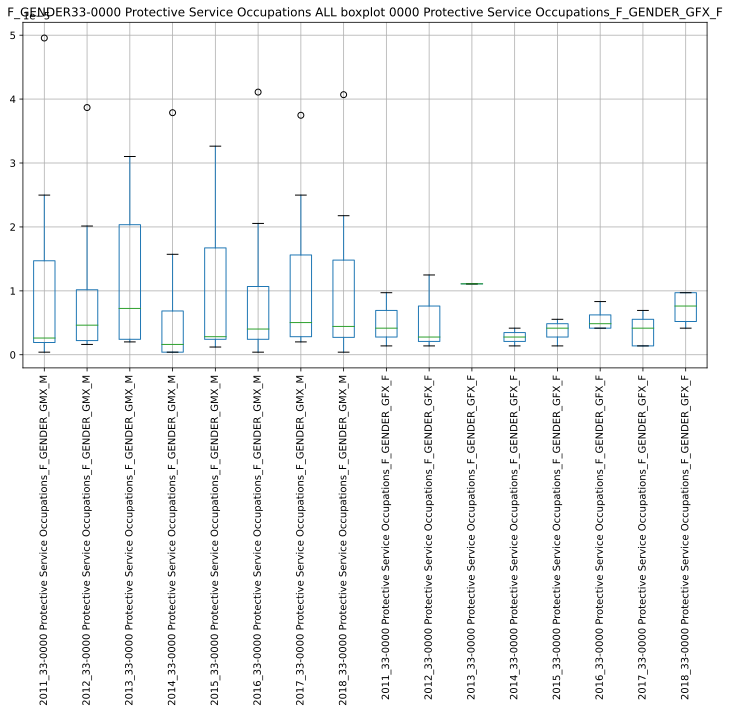

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224309.929353:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224309.969306:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224310.199742:INFO:headless_shell.cc(660)] Written to file /tmp/tmphgwyjbpk/temp.png.
[1013/224310.428314:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224310.466468:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224310.780769:INFO:headless_shell.cc(660)] Written to file /tmp/tmp7leaghjw/temp.png.
[1013/224311.038431:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224311.076934:WARNI

,2011_33-0000 Protective Service Occupations_F_GENDER_GMX_M,2012_33-0000 Protective Service Occupations_F_GENDER_GMX_M,2013_33-0000 Protective Service Occupations_F_GENDER_GMX_M,2014_33-0000 Protective Service Occupations_F_GENDER_GMX_M,2015_33-0000 Protective Service Occupations_F_GENDER_GMX_M,2016_33-0000 Protective Service Occupations_F_GENDER_GMX_M,2017_33-0000 Protective Service Occupations_F_GENDER_GMX_M,2018_33-0000 Protective Service Occupations_F_GENDER_GMX_M,2011_33-0000 Protective Service Occupations_F_GENDER_GFX_F,2012_33-0000 Protective Service Occupations_F_GENDER_GFX_F,2013_33-0000 Protective Service Occupations_F_GENDER_GFX_F,2014_33-0000 Protective Service Occupations_F_GENDER_GFX_F,2015_33-0000 Protective Service Occupations_F_GENDER_GFX_F,2016_33-0000 Protective Service Occupations_F_GENDER_GFX_F,2017_33-0000 Protective Service Occupations_F_GENDER_GFX_F,2018_33-0000 Protective Service Occupations_F_GENDER_GFX_F
2011_33-0000 Protective Service Occupations_F_GENDER_GMX_M,1.000000,-0.143630,0.562941,0.312978,0.606150,-0.334489,-0.145207,0.995695,0.957320,-0.627874,nan,0.885448,-0.957320,-0.448743,-0.564841,0.520387
2012_33-0000 Protective Service Occupations_F_GENDER_GMX_M,-0.143630,1.000000,0.099696,0.245986,0.210579,-0.260027,0.967019,-0.187312,0.524379,-0.913070,nan,0.675845,-0.524379,-0.323498,0.635821,-0.012329
2013_33-0000 Protective Service Occupations_F_GENDER_GMX_M,0.562941,0.099696,1.000000,-0.330053,0.945235,-0.257263,-0.078218,0.558658,0.828769,-0.369194,nan,0.708083,-0.828769,-0.232752,-0.625733,0.393464
2014_33-0000 Protective Service Occupations_F_GENDER_GMX_M,0.312978,0.245986,-0.330053,1.000000,-0.359865,-0.172532,0.336951,0.334873,0.633632,-0.087363,nan,0.476011,-0.633632,0.023338,-0.325091,0.192117
2015_33-0000 Protective Service Occupations_F_GENDER_GMX_M,0.606150,0.210579,0.945235,-0.359865,1.000000,-0.283283,0.058959,0.573360,0.966823,-0.654654,nan,0.901127,-0.966823,-0.538867,-0.540182,0.611361
2016_33-0000 Protective Service Occupations_F_GENDER_GMX_M,-0.334489,-0.260027,-0.257263,-0.172532,-0.283283,1.000000,-0.330045,-0.334021,-0.513951,-0.058945,nan,-0.342578,0.513951,0.427720,0.385431,-0.742703
2017_33-0000 Protective Service Occupations_F_GENDER_GMX_M,-0.145207,0.967019,-0.078218,0.336951,0.058959,-0.330045,1.000000,-0.186275,-0.579239,0.019030,nan,-0.414751,0.579239,0.402844,0.484123,-0.738143
2018_33-0000 Protective Service Occupations_F_GENDER_GMX_M,0.995695,-0.187312,0.558658,0.334873,0.573360,-0.334021,-0.186275,1.000000,0.832240,-0.374977,nan,0.712468,-0.832240,-0.186832,-0.617919,0.331095
2011_33-0000 Protective Service Occupations_F_GENDER_GFX_F,0.957320,0.524379,0.828769,0.633632,0.966823,-0.513951,-0.579239,0.832240,1.000000,-0.826033,nan,0.981981,-1.000000,-0.928571,0.327327,0.995871
2012_33-0000 Protective Service Occupations_F_GENDER_GFX_F,-0.627874,-0.913070,-0.369194,-0.087363,-0.654654,-0.058945,0.019030,-0.374977,-0.826033,1.000000,nan,-0.917663,0.826033,0.976221,-0.802955,-0.771454


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
35-0000 Food Preparation and Serving Related Occupations
 
############ OCCUPATION ############
35-0000 Food Preparation and Serving Related Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
35-0000 Food Preparation and Serving Related Occupations
 
############ OCCUPATION ############
35-0000 Food Preparation and Serving Related Occupations
 
#####

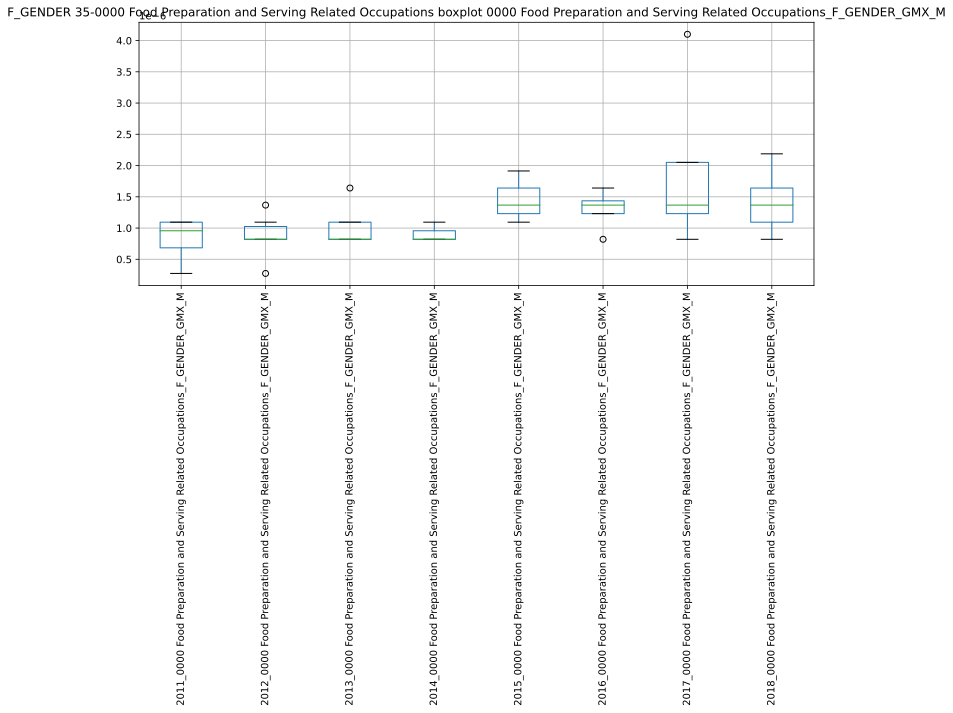

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224318.583810:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224318.612186:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224318.847476:INFO:headless_shell.cc(660)] Written to file /tmp/tmpozffl39i/temp.png.
[1013/224319.077032:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224319.114113:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224319.406641:INFO:headless_shell.cc(660)] Written to file /tmp/tmpm2l5wq02/temp.png.
[1013/224319.660982:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224319.701734:WARNI

,2011_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2012_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2013_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2014_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2015_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2016_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2017_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2018_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M
2011_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,1.000000,-1.000000,-0.944911,-1.000000,0.755929,1.000000,-0.870388,0.142857
2012_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,-1.000000,1.000000,0.292770,nan,nan,-0.426562,-1.000000,-0.990267
2013_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,-0.944911,0.292770,1.000000,1.000000,-1.000000,0.662266,0.987829,-0.378790
2014_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,-1.000000,nan,1.000000,1.000000,-0.755929,nan,1.000000,-1.000000
2015_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,0.755929,nan,-1.000000,-0.755929,1.000000,nan,-0.755929,1.000000
2016_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,1.000000,-0.426562,0.662266,nan,nan,1.000000,1.000000,0.388276
2017_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,-0.870388,-1.000000,0.987829,1.000000,-0.755929,1.000000,1.000000,0.339422
2018_0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,0.142857,-0.990267,-0.378790,-1.000000,1.000000,0.388276,0.339422,1.000000


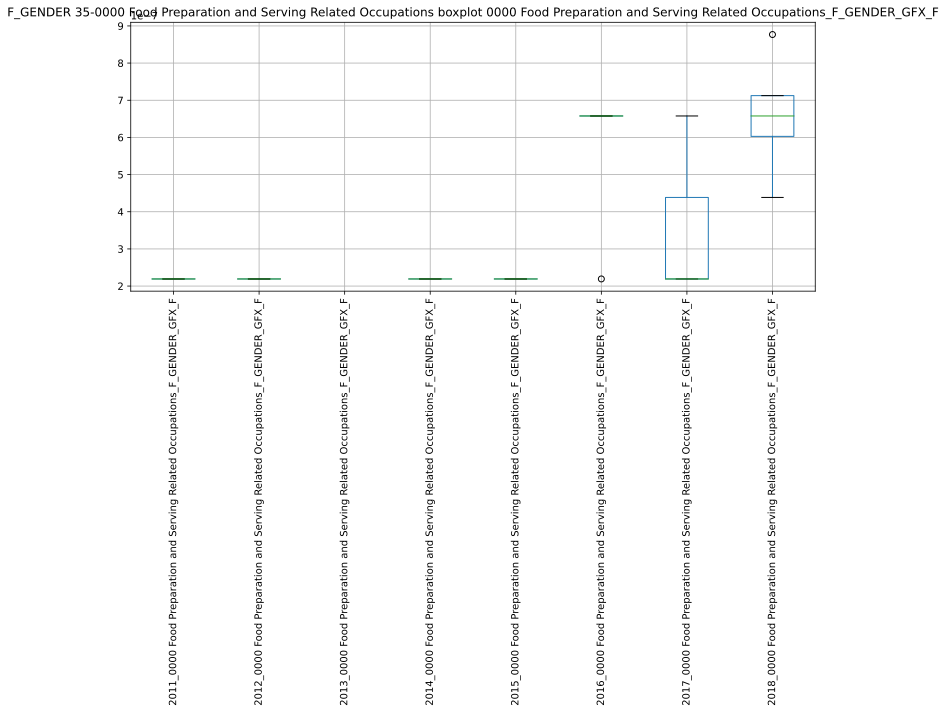

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224323.740172:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224323.778361:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224323.998368:INFO:headless_shell.cc(660)] Written to file /tmp/tmp64trpepl/temp.png.
[1013/224324.218627:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224324.256461:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224324.558721:INFO:headless_shell.cc(660)] Written to file /tmp/tmpet74nkpr/temp.png.
[1013/224324.817887:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224324.857458:WARNI

,2011_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2012_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2013_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2014_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2015_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2016_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2017_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2018_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F
2011_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,1.000000,nan,nan
2017_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,1.000000,1.000000
2018_0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,1.000000,1.000000


########################################## CORRELATIONS ###############################################
['35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M', '35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F']


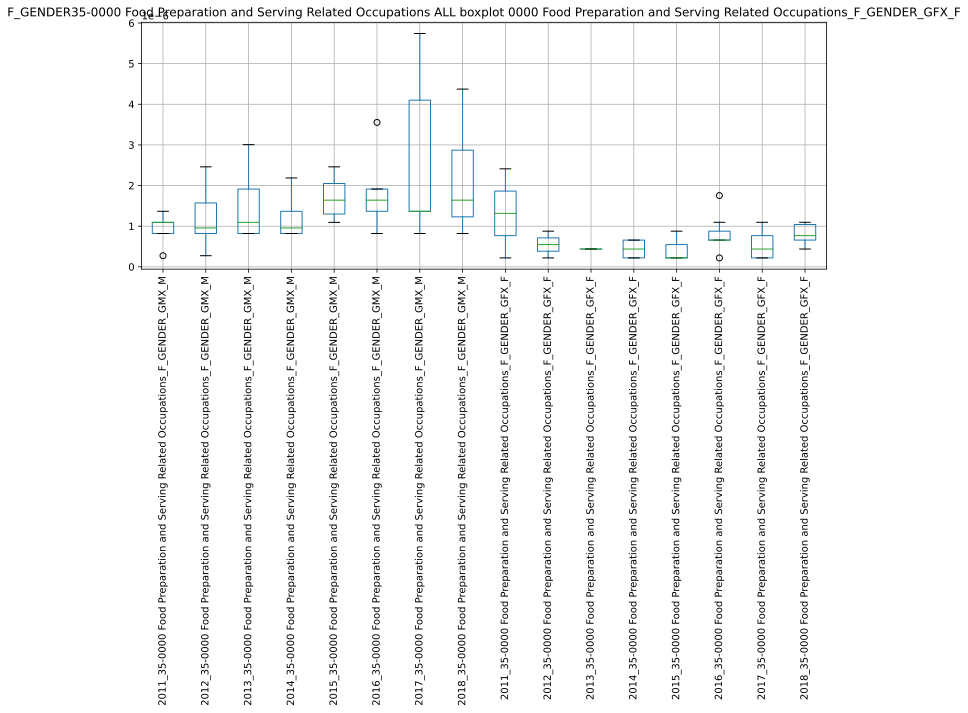

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224329.540849:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224329.578025:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224329.830379:INFO:headless_shell.cc(660)] Written to file /tmp/tmpkqukdi29/temp.png.
[1013/224330.056511:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224330.096709:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224330.509514:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxfps4nd1/temp.png.
[1013/224330.811674:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224330.849484:WARNI

,2011_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2012_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2013_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2014_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2015_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2016_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2017_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2018_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,2011_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2012_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2013_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2014_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2015_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2016_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2017_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,2018_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F
2011_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,1.000000,-0.424973,0.619839,0.404226,0.824530,0.440567,0.050572,0.612868,-1.000000,-1.000000,nan,-0.333333,0.277350,0.165531,0.502519,0.462652
2012_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,-0.424973,1.000000,0.371780,0.634192,0.011739,0.554825,0.842160,-0.062902,1.000000,1.000000,nan,0.991837,-0.987829,-0.172300,-0.353423,-0.440362
2013_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,0.619839,0.371780,1.000000,0.757554,0.548966,0.890640,0.634886,0.742594,-1.000000,-1.000000,nan,0.312348,0.082199,-0.440230,-0.235441,0.422666
2014_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,0.404226,0.634192,0.757554,1.000000,0.726235,0.970143,0.904534,0.261533,-1.000000,-1.000000,nan,0.727607,-0.654654,-0.420084,0.073127,0.073127
2015_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,0.824530,0.011739,0.548966,0.726235,1.000000,0.650945,0.409375,0.252695,-1.000000,-1.000000,nan,0.130189,-0.327327,0.225494,0.667308,0.039253
2016_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,0.440567,0.554825,0.890640,0.970143,0.650945,1.000000,0.888247,0.623328,-1.000000,-1.000000,nan,0.666667,-0.500000,-0.330560,-0.100504,0.351562
2017_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,0.050572,0.842160,0.634886,0.904534,0.409375,0.888247,1.000000,0.260470,-1.000000,-1.000000,nan,0.950654,-0.928571,-0.548443,-0.154341,0.235435
2018_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GMX_M,0.612868,-0.062902,0.742594,0.261533,0.252695,0.623328,0.260470,1.000000,-1.000000,-1.000000,nan,-0.215666,0.710742,-0.174058,-0.325128,0.791113
2011_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,-1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000,1.000000,nan,nan,nan,nan,-1.000000,-1.000000
2012_35-0000 Food Preparation and Serving Related Occupations_F_GENDER_GFX_F,-1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000,1.000000,nan,nan,nan,nan,-1.000000,-1.000000


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
37-0000 Building and Grounds Cleaning and Maintenance Occupations
 
############ OCCUPATION ############
37-0000 Building and Grounds Cleaning and Maintenance Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
37-0000 Building and Grounds Cleaning and Maintenance Occupations
 
############ OCCUPATION ############
37-0000 Building and Grounds Cleaning

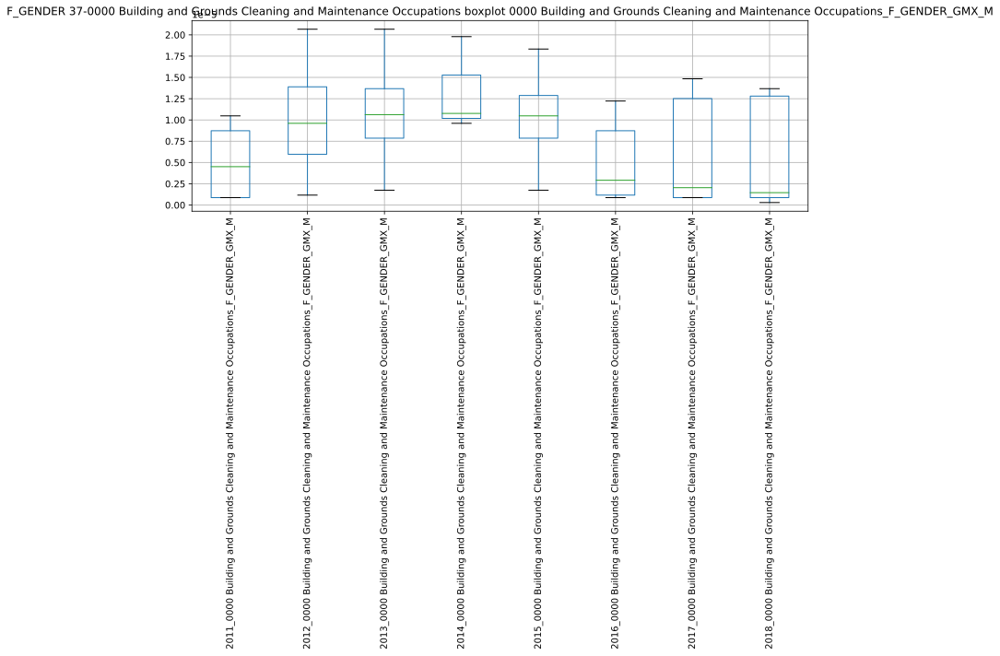

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224340.291691:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224340.328894:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224340.584273:INFO:headless_shell.cc(660)] Written to file /tmp/tmp6bfuia3b/temp.png.
[1013/224340.808763:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224340.845852:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224341.143189:INFO:headless_shell.cc(660)] Written to file /tmp/tmpms8c64v5/temp.png.
[1013/224341.405520:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224341.443641:WARNI

,2011_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2012_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2013_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2014_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2015_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2016_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2017_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2018_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M
2011_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,1.000000,-0.129856,-0.057214,1.000000,0.023020,0.996841,0.924648,0.956638
2012_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,-0.129856,1.000000,0.990489,-1.000000,0.982407,0.758355,0.971381,0.944430
2013_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,-0.057214,0.990489,1.000000,-1.000000,0.996742,0.898242,0.999885,0.996804
2014_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,1.000000,-1.000000,-1.000000,1.000000,-1.000000,-0.884749,-0.997762,-0.999179
2015_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,0.023020,0.982407,0.996742,-1.000000,1.000000,0.909392,0.999151,0.998547
2016_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,0.996841,0.758355,0.898242,-0.884749,0.909392,1.000000,0.929377,0.952095
2017_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,0.924648,0.971381,0.999885,-0.997762,0.999151,0.929377,1.000000,0.996608
2018_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,0.956638,0.944430,0.996804,-0.999179,0.998547,0.952095,0.996608,1.000000


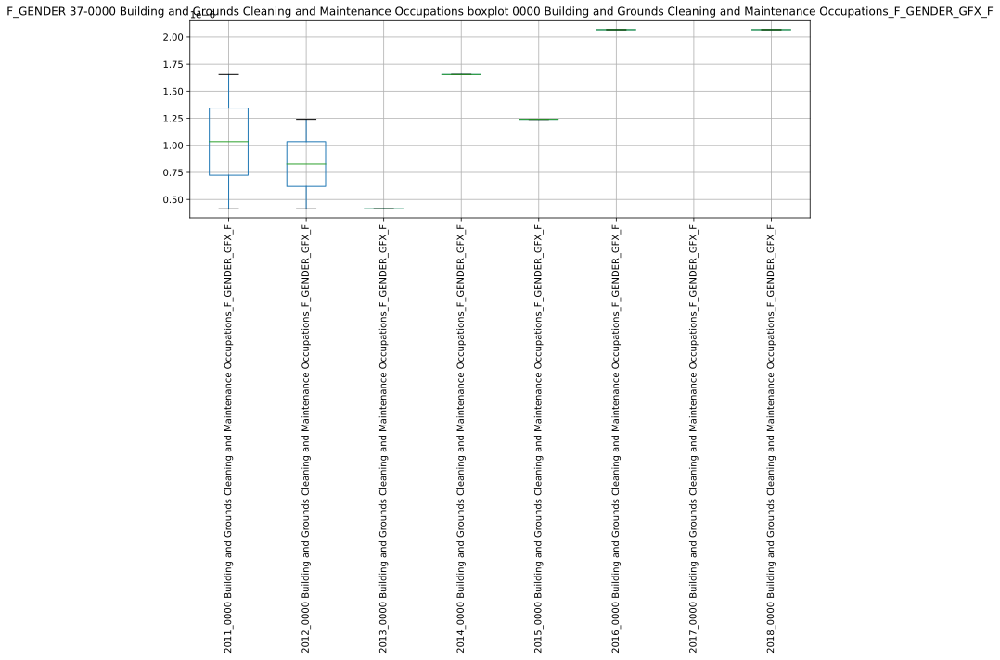

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224345.609049:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224345.645988:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224345.857264:INFO:headless_shell.cc(660)] Written to file /tmp/tmp2pnmhasy/temp.png.
[1013/224346.073708:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224346.110232:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224346.379187:INFO:headless_shell.cc(660)] Written to file /tmp/tmp_pv7809n/temp.png.
[1013/224346.633469:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224346.671799:WARNI

,2011_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2012_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2013_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2014_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2015_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2016_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2017_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2018_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F
2011_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,1.000000,-1.000000,nan,nan,nan,nan,nan,nan
2012_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,-1.000000,1.000000,nan,nan,nan,nan,nan,nan
2013_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M', '37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F']


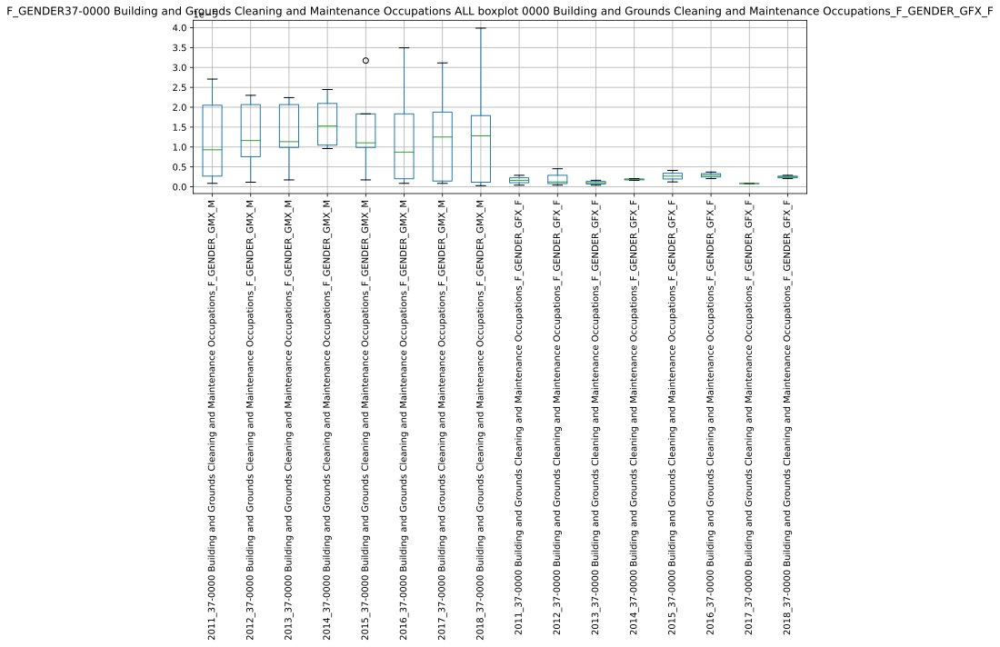

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224351.478209:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224351.516935:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224351.767254:INFO:headless_shell.cc(660)] Written to file /tmp/tmp7v121u1h/temp.png.
[1013/224351.992149:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224352.033069:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224352.452594:INFO:headless_shell.cc(660)] Written to file /tmp/tmpsbxtiope/temp.png.
[1013/224352.775691:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224352.813748:WARNI

,2011_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2012_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2013_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2014_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2015_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2016_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2017_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2018_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,2011_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2012_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2013_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2014_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2015_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2016_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2017_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,2018_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F
2011_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,1.000000,0.533952,0.538756,-0.017097,0.785915,-0.538756,-0.574952,-0.576867,0.726139,0.098804,-1.000000,-1.000000,-1.000000,-1.000000,nan,-1.000000
2012_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,0.533952,1.000000,0.993822,-0.120059,0.934550,0.438978,0.388507,0.409078,0.991870,0.666474,1.000000,1.000000,1.000000,1.000000,nan,1.000000
2013_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,0.538756,0.993822,1.000000,-0.173014,0.931896,0.472404,0.415044,0.434608,0.927708,0.456896,1.000000,1.000000,1.000000,1.000000,nan,1.000000
2014_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,-0.017097,-0.120059,-0.173014,1.000000,0.015281,-0.932628,-0.977637,-0.972451,-0.899129,-0.393147,-1.000000,-1.000000,-1.000000,-1.000000,nan,-1.000000
2015_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,0.785915,0.934550,0.931896,0.015281,1.000000,0.130588,0.057252,0.080404,0.917663,0.433555,1.000000,1.000000,1.000000,1.000000,nan,1.000000
2016_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,-0.538756,0.438978,0.472404,-0.932628,0.130588,1.000000,0.974499,0.982044,0.669238,0.019458,-1.000000,-1.000000,-1.000000,-1.000000,nan,-1.000000
2017_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,-0.574952,0.388507,0.415044,-0.977637,0.057252,0.974499,1.000000,0.984195,0.933257,0.470317,1.000000,1.000000,1.000000,1.000000,nan,1.000000
2018_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GMX_M,-0.576867,0.409078,0.434608,-0.972451,0.080404,0.982044,0.984195,1.000000,0.894920,0.384373,1.000000,1.000000,1.000000,1.000000,nan,1.000000
2011_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,0.726139,0.991870,0.927708,-0.899129,0.917663,0.669238,0.933257,0.894920,1.000000,0.755929,1.000000,1.000000,1.000000,1.000000,nan,1.000000
2012_37-0000 Building and Grounds Cleaning and Maintenance Occupations_F_GENDER_GFX_F,0.098804,0.666474,0.456896,-0.393147,0.433555,0.019458,0.470317,0.384373,0.755929,1.000000,1.000000,1.000000,1.000000,1.000000,nan,1.000000


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
39-0000 Personal Care and Service Occupations
 
############ OCCUPATION ############
39-0000 Personal Care and Service Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
39-0000 Personal Care and Service Occupations
 
############ OCCUPATION ############
39-0000 Personal Care and Service Occupations
 
########################################## NEW YE

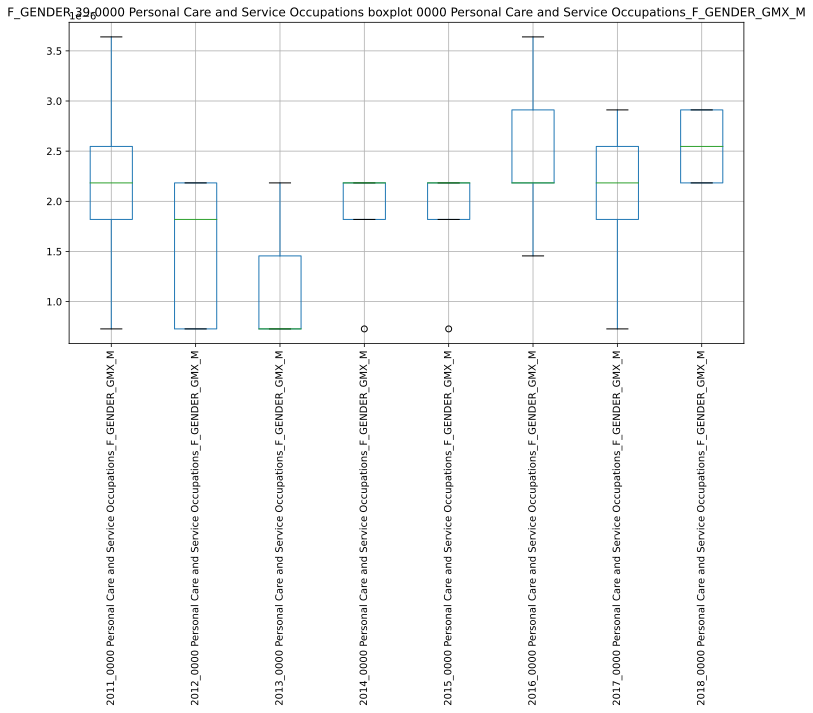

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224410.555811:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224410.596851:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224410.805894:INFO:headless_shell.cc(660)] Written to file /tmp/tmp8buxprl8/temp.png.
[1013/224411.032327:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224411.072805:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224411.343338:INFO:headless_shell.cc(660)] Written to file /tmp/tmp9eh7c25y/temp.png.
[1013/224411.600720:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224411.642144:WARNI

,2011_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2012_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2013_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2014_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2015_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2016_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2017_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2018_0000 Personal Care and Service Occupations_F_GENDER_GMX_M
2011_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,1.000000,0.500000,1.000000,nan,1.000000,0.866025,-0.944911,-0.500000
2012_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,0.500000,1.000000,1.000000,-0.522233,0.500000,0.134840,0.918559,-0.500000
2013_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,1.000000,1.000000,1.000000,nan,0.500000,nan,nan,-0.500000
2014_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,nan,-0.522233,nan,1.000000,nan,-0.866025,-0.755929,nan
2015_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,1.000000,0.500000,0.500000,nan,1.000000,nan,nan,-0.577350
2016_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,0.866025,0.134840,nan,-0.866025,nan,1.000000,0.000000,nan
2017_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,-0.944911,0.918559,nan,-0.755929,nan,0.000000,1.000000,1.000000
2018_0000 Personal Care and Service Occupations_F_GENDER_GMX_M,-0.500000,-0.500000,-0.500000,nan,-0.577350,nan,1.000000,1.000000


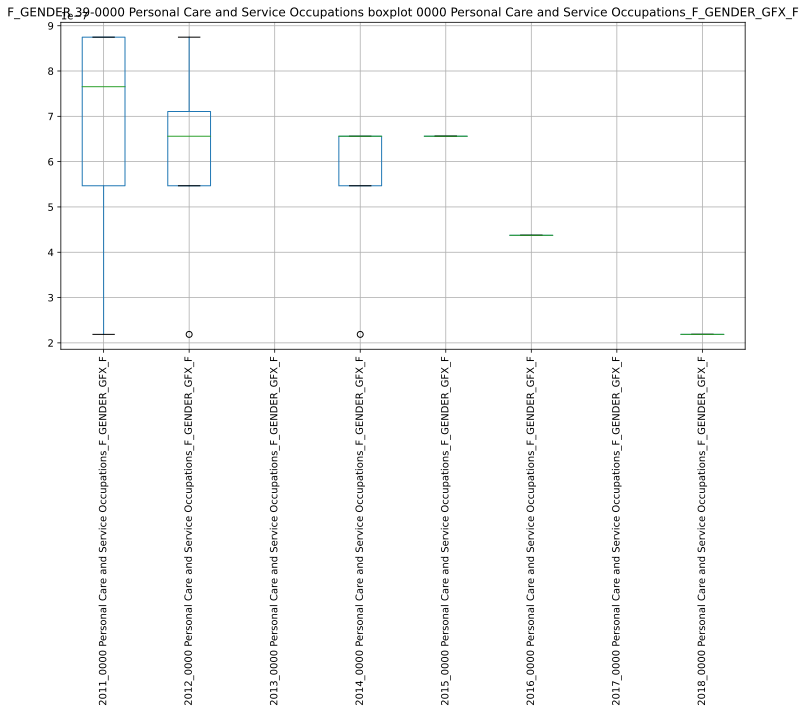

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224414.350164:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224414.387204:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224414.620300:INFO:headless_shell.cc(660)] Written to file /tmp/tmp_mrin8nj/temp.png.
[1013/224414.836928:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224414.873644:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224415.184924:INFO:headless_shell.cc(660)] Written to file /tmp/tmpv7t_325_/temp.png.
[1013/224415.457989:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224415.488059:WARNI

,2011_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2012_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2013_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2014_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2015_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2016_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2017_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2018_0000 Personal Care and Service Occupations_F_GENDER_GFX_F
2011_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,1.000000,-1.000000,nan,-0.188982,nan,nan,nan,nan
2012_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,-1.000000,1.000000,nan,-0.188982,nan,nan,nan,nan
2013_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,-0.188982,-0.188982,nan,1.000000,nan,nan,nan,nan
2015_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Personal Care and Service Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M', '39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F']


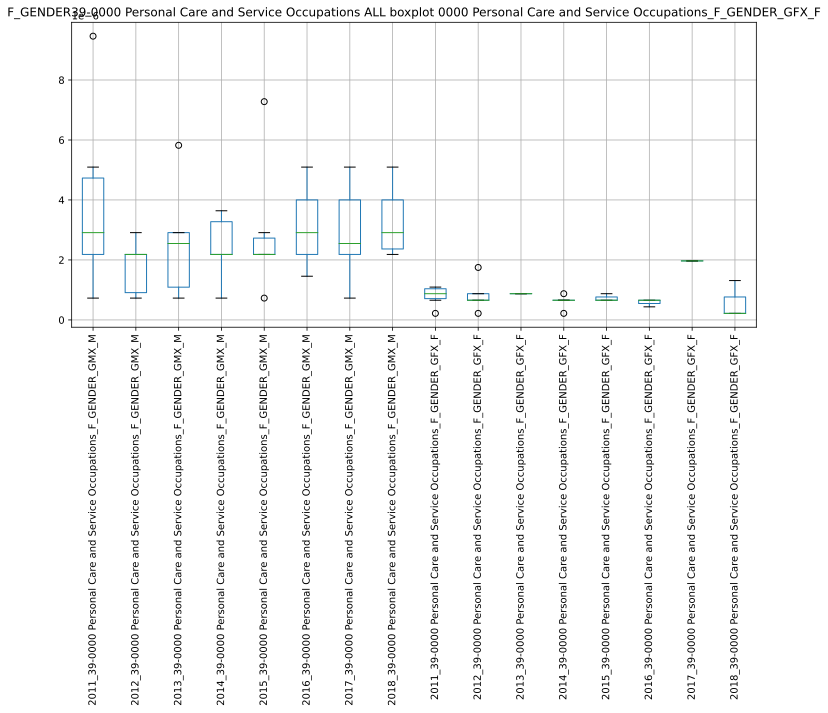

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224418.600706:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224418.637746:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224418.894880:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxm5gfc6l/temp.png.
[1013/224419.122359:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224419.165069:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224419.573849:INFO:headless_shell.cc(660)] Written to file /tmp/tmpvy7gf0bv/temp.png.
[1013/224419.890207:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224419.932386:WARNI

,2011_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2012_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2013_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2014_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2015_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2016_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2017_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2018_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,2011_39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2012_39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2013_39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2014_39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2015_39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2016_39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2017_39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F,2018_39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F
2011_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,1.000000,-0.334878,-0.018079,0.227933,0.302061,0.764161,0.246632,-0.085436,-0.663079,-0.194181,nan,0.305888,-0.500000,0.500000,nan,1.000000
2012_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,-0.334878,1.000000,0.638009,-0.073127,0.373101,-0.315063,-0.665703,0.100504,0.621582,-0.835073,nan,-0.102062,0.188982,-0.755929,nan,-0.944911
2013_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,-0.018079,0.638009,1.000000,-0.667179,0.922696,-0.094632,-0.447955,0.634811,0.667179,-0.522984,nan,0.427764,0.188982,-0.755929,nan,-0.944911
2014_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,0.227933,-0.073127,-0.667179,1.000000,-0.685994,0.054233,0.280056,-0.565916,-0.470588,-0.207791,nan,-0.218218,-1.000000,-0.500000,nan,0.500000
2015_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,0.302061,0.373101,0.922696,-0.685994,1.000000,0.197642,-0.238145,0.549972,0.385872,-0.390337,nan,0.527046,nan,nan,nan,nan
2016_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,0.764161,-0.315063,-0.094632,0.054233,0.197642,1.000000,0.223906,-0.372678,-0.786373,-0.172774,nan,-0.280671,0.277350,0.970725,nan,0.693375
2017_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,0.246632,-0.665703,-0.447955,0.280056,-0.238145,0.223906,1.000000,-0.641500,-0.350070,0.691095,nan,0.442269,-0.755929,0.188982,nan,0.944911
2018_39-0000 Personal Care and Service Occupations_F_GENDER_GMX_M,-0.085436,0.100504,0.634811,-0.565916,0.549972,-0.372678,-0.641500,1.000000,0.565916,-0.078860,nan,0.745356,-0.500000,-1.000000,nan,-0.500000
2011_39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F,-0.663079,0.621582,0.667179,-0.470588,0.385872,-0.786373,-0.350070,0.565916,1.000000,-0.196247,nan,0.354604,-0.000000,-0.866025,nan,-0.866025
2012_39-0000 Personal Care and Service Occupations_F_GENDER_GFX_F,-0.194181,-0.835073,-0.522984,-0.207791,-0.390337,-0.172774,0.691095,-0.078860,-0.196247,1.000000,nan,0.070535,0.188982,0.944911,nan,0.755929


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
41-0000 Sales and Related Occupations
 
############ OCCUPATION ############
41-0000 Sales and Related Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
41-0000 Sales and Related Occupations
 
############ OCCUPATION ############
41-0000 Sales and Related Occupations
 
########################################## NEW YEAR #############################

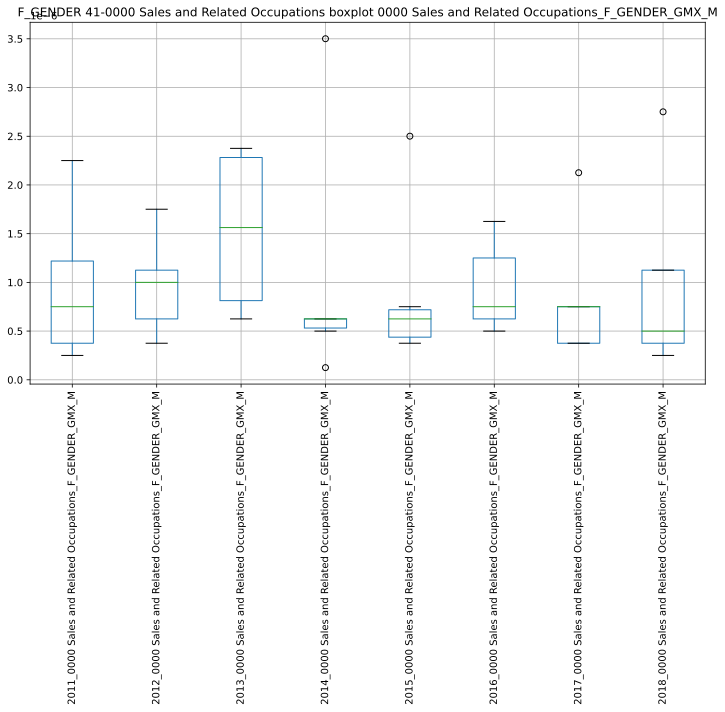

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224429.289544:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224429.330883:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224429.559406:INFO:headless_shell.cc(660)] Written to file /tmp/tmpq8q3kxd6/temp.png.
[1013/224429.791048:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224429.831693:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224430.121319:INFO:headless_shell.cc(660)] Written to file /tmp/tmpt7wpevqu/temp.png.
[1013/224430.389681:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224430.426690:WARNI

,2011_0000 Sales and Related Occupations_F_GENDER_GMX_M,2012_0000 Sales and Related Occupations_F_GENDER_GMX_M,2013_0000 Sales and Related Occupations_F_GENDER_GMX_M,2014_0000 Sales and Related Occupations_F_GENDER_GMX_M,2015_0000 Sales and Related Occupations_F_GENDER_GMX_M,2016_0000 Sales and Related Occupations_F_GENDER_GMX_M,2017_0000 Sales and Related Occupations_F_GENDER_GMX_M,2018_0000 Sales and Related Occupations_F_GENDER_GMX_M
2011_0000 Sales and Related Occupations_F_GENDER_GMX_M,1.000000,0.736716,0.618590,-0.256550,-0.186679,-0.783958,-0.889297,-0.464012
2012_0000 Sales and Related Occupations_F_GENDER_GMX_M,0.736716,1.000000,0.568507,nan,0.951950,0.634335,0.794851,0.717973
2013_0000 Sales and Related Occupations_F_GENDER_GMX_M,0.618590,0.568507,1.000000,nan,0.471446,-0.114708,0.563621,0.826049
2014_0000 Sales and Related Occupations_F_GENDER_GMX_M,-0.256550,nan,nan,1.000000,-0.107583,0.413449,0.577350,nan
2015_0000 Sales and Related Occupations_F_GENDER_GMX_M,-0.186679,0.951950,0.471446,-0.107583,1.000000,0.739131,0.940770,0.880192
2016_0000 Sales and Related Occupations_F_GENDER_GMX_M,-0.783958,0.634335,-0.114708,0.413449,0.739131,1.000000,0.847589,0.710376
2017_0000 Sales and Related Occupations_F_GENDER_GMX_M,-0.889297,0.794851,0.563621,0.577350,0.940770,0.847589,1.000000,0.973830
2018_0000 Sales and Related Occupations_F_GENDER_GMX_M,-0.464012,0.717973,0.826049,nan,0.880192,0.710376,0.973830,1.000000


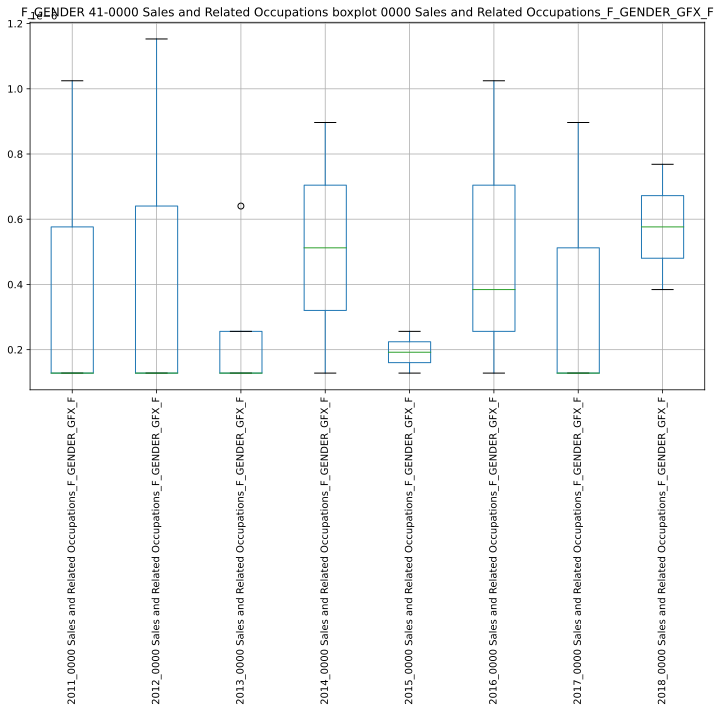

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224433.130158:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224433.167078:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224433.388945:INFO:headless_shell.cc(660)] Written to file /tmp/tmpq_1omcyq/temp.png.
[1013/224433.613097:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224433.650905:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224433.934513:INFO:headless_shell.cc(660)] Written to file /tmp/tmpgjyys8jf/temp.png.
[1013/224434.204092:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224434.243958:WARNI

,2011_0000 Sales and Related Occupations_F_GENDER_GFX_F,2012_0000 Sales and Related Occupations_F_GENDER_GFX_F,2013_0000 Sales and Related Occupations_F_GENDER_GFX_F,2014_0000 Sales and Related Occupations_F_GENDER_GFX_F,2015_0000 Sales and Related Occupations_F_GENDER_GFX_F,2016_0000 Sales and Related Occupations_F_GENDER_GFX_F,2017_0000 Sales and Related Occupations_F_GENDER_GFX_F,2018_0000 Sales and Related Occupations_F_GENDER_GFX_F
2011_0000 Sales and Related Occupations_F_GENDER_GFX_F,1.000000,-0.500000,-1.000000,nan,nan,-0.720577,-0.500000,1.000000
2012_0000 Sales and Related Occupations_F_GENDER_GFX_F,-0.500000,1.000000,1.000000,1.000000,nan,0.960769,1.000000,-1.000000
2013_0000 Sales and Related Occupations_F_GENDER_GFX_F,-1.000000,1.000000,1.000000,0.755929,nan,1.000000,1.000000,-1.000000
2014_0000 Sales and Related Occupations_F_GENDER_GFX_F,nan,1.000000,0.755929,1.000000,nan,1.000000,1.000000,nan
2015_0000 Sales and Related Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,1.000000,nan,nan,nan
2016_0000 Sales and Related Occupations_F_GENDER_GFX_F,-0.720577,0.960769,1.000000,1.000000,nan,1.000000,0.960769,-1.000000
2017_0000 Sales and Related Occupations_F_GENDER_GFX_F,-0.500000,1.000000,1.000000,1.000000,nan,0.960769,1.000000,-1.000000
2018_0000 Sales and Related Occupations_F_GENDER_GFX_F,1.000000,-1.000000,-1.000000,nan,nan,-1.000000,-1.000000,1.000000


########################################## CORRELATIONS ###############################################
['41-0000 Sales and Related Occupations_F_GENDER_GMX_M', '41-0000 Sales and Related Occupations_F_GENDER_GFX_F']


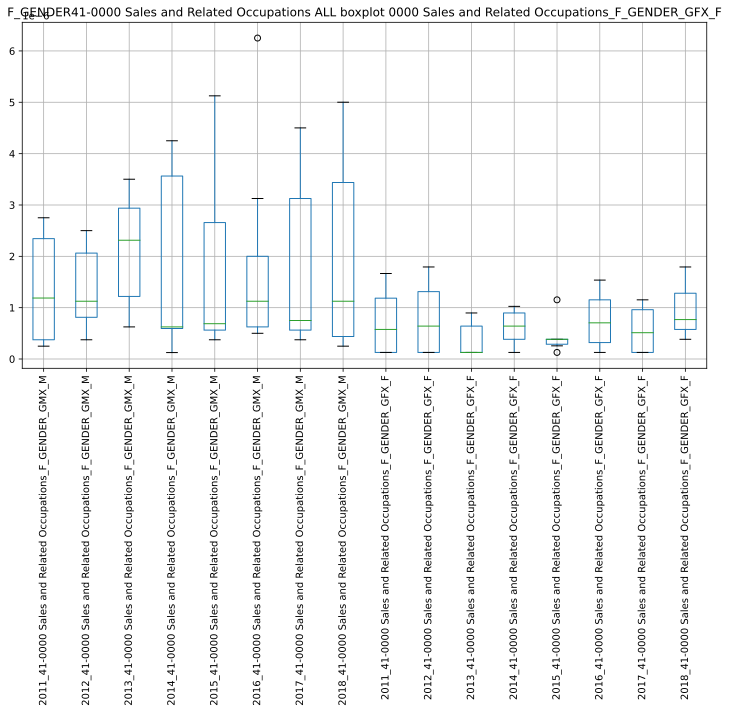

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224437.382400:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224437.423023:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224437.662750:INFO:headless_shell.cc(660)] Written to file /tmp/tmpqeih6at8/temp.png.
[1013/224437.888900:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224437.926698:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224438.229784:INFO:headless_shell.cc(660)] Written to file /tmp/tmprebx06sp/temp.png.
[1013/224438.489156:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224438.534204:WARNI

,2011_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,2012_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,2013_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,2014_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,2015_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,2016_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,2017_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,2018_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,2011_41-0000 Sales and Related Occupations_F_GENDER_GFX_F,2012_41-0000 Sales and Related Occupations_F_GENDER_GFX_F,2013_41-0000 Sales and Related Occupations_F_GENDER_GFX_F,2014_41-0000 Sales and Related Occupations_F_GENDER_GFX_F,2015_41-0000 Sales and Related Occupations_F_GENDER_GFX_F,2016_41-0000 Sales and Related Occupations_F_GENDER_GFX_F,2017_41-0000 Sales and Related Occupations_F_GENDER_GFX_F,2018_41-0000 Sales and Related Occupations_F_GENDER_GFX_F
2011_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,1.000000,0.907821,0.808381,0.399994,0.427725,0.313643,0.111568,0.821122,0.554426,0.688912,-0.321922,0.151920,0.607997,0.561522,0.706741,0.478731
2012_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,0.907821,1.000000,0.857861,0.134430,0.332090,0.334391,0.016031,0.918122,0.255942,0.321140,-0.270062,0.524605,0.654316,0.172337,0.373664,-0.993870
2013_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,0.808381,0.857861,1.000000,0.004480,0.234677,0.257239,-0.096068,0.904987,0.207796,0.340676,-0.478852,0.630635,0.748484,0.197200,0.399860,-0.997788
2014_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,0.399994,0.134430,0.004480,1.000000,0.849051,0.682230,0.853711,0.156963,-0.083979,0.622350,0.548683,-0.649136,0.371230,0.742174,0.619839,0.432055
2015_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,0.427725,0.332090,0.234677,0.849051,1.000000,0.953336,0.914645,0.282386,-0.588686,0.402075,0.715644,-0.112011,0.752420,0.480322,0.488177,-0.321822
2016_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,0.313643,0.334391,0.257239,0.682230,0.953336,1.000000,0.853279,0.281102,-0.722316,0.224639,0.718440,0.139124,0.823560,0.279229,0.332297,-0.568682
2017_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,0.111568,0.016031,-0.096068,0.853711,0.914645,0.853279,1.000000,0.072100,-0.735911,0.060435,0.923866,-0.265673,0.487453,0.197331,0.118849,-0.300699
2018_41-0000 Sales and Related Occupations_F_GENDER_GMX_M,0.821122,0.918122,0.904987,0.156963,0.282386,0.281102,0.072100,1.000000,0.277111,0.114655,-0.362664,0.634710,0.597683,-0.045756,0.155328,-0.788180
2011_41-0000 Sales and Related Occupations_F_GENDER_GFX_F,0.554426,0.255942,0.207796,-0.083979,-0.588686,-0.722316,-0.735911,0.277111,1.000000,0.500865,-0.901822,-0.383560,-0.422523,0.424321,0.407517,0.938487
2012_41-0000 Sales and Related Occupations_F_GENDER_GFX_F,0.688912,0.321140,0.340676,0.622350,0.402075,0.224639,0.060435,0.114655,0.500865,1.000000,-0.356091,-0.484985,0.354018,0.986282,0.992142,0.603425


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
43-0000 Office and Administrative Support Occupations
 
############ OCCUPATION ############
43-0000 Office and Administrative Support Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
43-0000 Office and Administrative Support Occupations
 
############ OCCUPATION ############
43-0000 Office and Administrative Support Occupations
 
#################

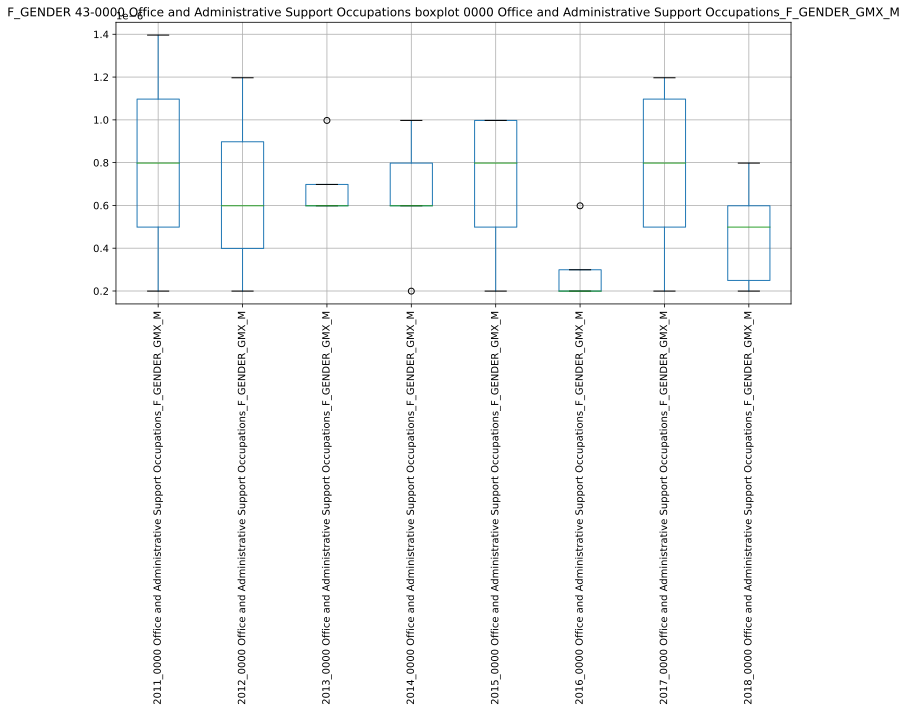

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224446.180557:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224446.218840:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224446.439215:INFO:headless_shell.cc(660)] Written to file /tmp/tmpfkqaqbk7/temp.png.
[1013/224446.657762:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224446.698477:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224447.001977:INFO:headless_shell.cc(660)] Written to file /tmp/tmppwx0mvde/temp.png.
[1013/224447.270266:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224447.313805:WARNI

,2011_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2012_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2013_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2014_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2015_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2016_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2017_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2018_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M
2011_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,1.000000,nan,-0.866025,1.000000,1.000000,nan,-0.944911,0.755929
2012_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,nan,1.000000,nan,-1.000000,-0.917663,nan,-0.563621,-0.596040
2013_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,-0.866025,nan,1.000000,nan,nan,-1.000000,0.866025,-0.500000
2014_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,1.000000,-1.000000,nan,1.000000,0.866025,-1.000000,-0.274774,0.943880
2015_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,1.000000,-0.917663,nan,0.866025,1.000000,nan,0.058026,0.674200
2016_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,nan,nan,-1.000000,-1.000000,nan,1.000000,-1.000000,0.000000
2017_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,-0.944911,-0.563621,0.866025,-0.274774,0.058026,-1.000000,1.000000,-0.458456
2018_0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,0.755929,-0.596040,-0.500000,0.943880,0.674200,0.000000,-0.458456,1.000000


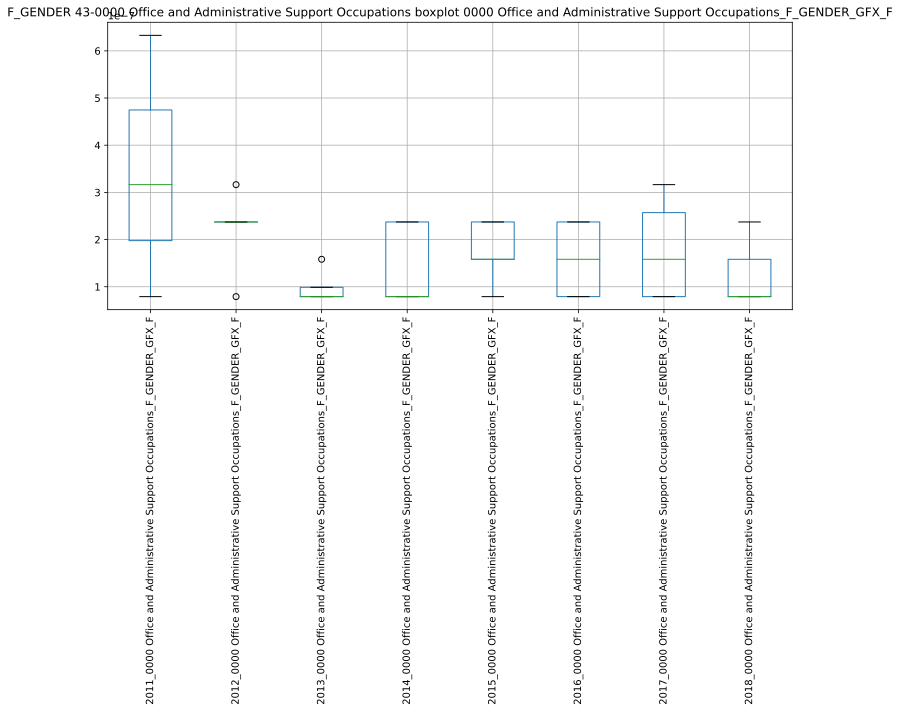

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224451.383092:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224451.423293:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224451.637329:INFO:headless_shell.cc(660)] Written to file /tmp/tmpd16v5x5o/temp.png.
[1013/224451.854375:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224451.898911:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224452.159650:INFO:headless_shell.cc(660)] Written to file /tmp/tmplj11px15/temp.png.
[1013/224452.422208:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224452.463082:WARNI

,2011_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2012_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2013_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2014_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2015_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2016_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2017_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2018_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F
2011_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,1.000000,0.904194,nan,-0.082199,-1.000000,0.821995,-1.000000,1.000000
2012_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,0.904194,1.000000,-1.000000,-0.583333,-0.522233,0.583333,0.220755,0.500000
2013_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,nan,-1.000000,1.000000,0.577350,1.000000,-1.000000,nan,-1.000000
2014_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,-0.082199,-0.583333,0.577350,1.000000,0.000000,-0.333333,-0.500000,0.500000
2015_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,-1.000000,-0.522233,1.000000,0.000000,1.000000,-1.000000,-0.755929,-1.000000
2016_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,0.821995,0.583333,-1.000000,-0.333333,-1.000000,1.000000,-0.500000,1.000000
2017_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,-1.000000,0.220755,nan,-0.500000,-0.755929,-0.500000,1.000000,nan
2018_0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,1.000000,0.500000,-1.000000,0.500000,-1.000000,1.000000,nan,1.000000


########################################## CORRELATIONS ###############################################
['43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M', '43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F']


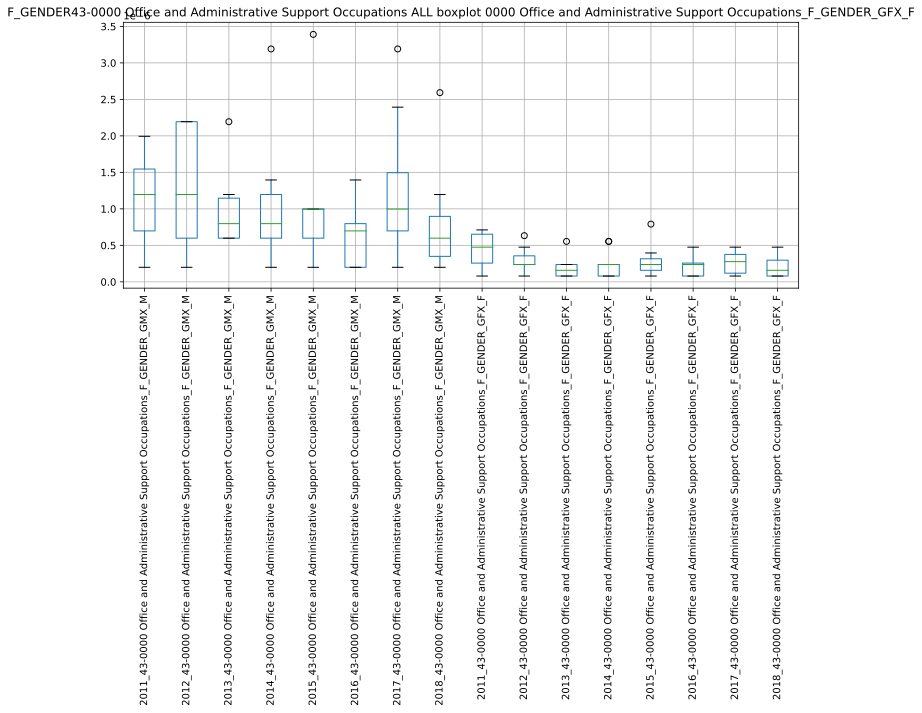

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224457.040106:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224457.078351:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224457.331527:INFO:headless_shell.cc(660)] Written to file /tmp/tmpgxvltz59/temp.png.
[1013/224457.555790:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224457.593854:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224458.009877:INFO:headless_shell.cc(660)] Written to file /tmp/tmp8jnq2hze/temp.png.
[1013/224458.334112:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224458.372539:WARNI

,2011_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2012_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2013_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2014_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2015_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2016_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2017_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2018_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,2011_43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2012_43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2013_43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2014_43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2015_43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2016_43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2017_43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,2018_43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F
2011_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,1.000000,-0.759615,0.564300,-0.461714,-0.784465,0.113583,-0.741274,0.144561,0.866296,-0.608552,0.044961,-0.222850,0.466063,-0.633724,-0.795554,0.779325
2012_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,-0.759615,1.000000,-0.570457,0.318527,0.416747,-0.563363,0.568026,-0.899700,-0.466453,0.432017,0.449100,-0.580465,-0.157137,0.144437,0.254808,-0.640585
2013_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,0.564300,-0.570457,1.000000,0.204124,0.102062,-0.126402,-0.503370,0.203343,0.370230,0.255466,-0.224942,-0.428817,0.873158,0.202375,-0.258185,0.999651
2014_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,-0.461714,0.318527,0.204124,1.000000,0.984260,-0.611938,-0.111795,-0.519702,-0.047088,0.756340,-0.442083,-0.448509,0.288918,0.717553,0.635654,0.552532
2015_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,-0.784465,0.416747,0.102062,0.984260,1.000000,-0.832993,0.729214,-0.342997,-0.235441,0.974937,-0.429770,-0.466569,0.179160,0.958600,0.749444,0.773545
2016_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,0.113583,-0.563363,-0.126402,-0.611938,-0.832993,1.000000,-0.071337,-0.105642,-0.631169,-0.498284,0.422756,0.673581,-0.162711,0.009703,-0.182927,0.493742
2017_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,-0.741274,0.568026,-0.503370,-0.111795,0.729214,-0.071337,1.000000,0.831331,-0.871614,0.004823,-0.064524,0.531833,-0.608339,-0.019881,0.551632,-0.587788
2018_43-0000 Office and Administrative Support Occupations_F_GENDER_GMX_M,0.144561,-0.899700,0.203343,-0.519702,-0.342997,-0.105642,0.831331,1.000000,0.558744,-0.248634,-0.149977,0.393693,-0.070700,-0.304866,-0.133038,0.928809
2011_43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,0.866296,-0.466453,0.370230,-0.047088,-0.235441,-0.631169,-0.871614,0.558744,1.000000,-0.322458,-0.634265,0.312348,0.463415,0.156174,-0.706322,0.362514
2012_43-0000 Office and Administrative Support Occupations_F_GENDER_GFX_F,-0.608552,0.432017,0.255466,0.756340,0.974937,-0.498284,0.004823,-0.248634,-0.322458,1.000000,-0.369374,-0.461716,0.213698,0.780488,0.648785,0.756745


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
45-0000 Farming, Fishing, and Forestry Occupations
 
############ OCCUPATION ############
45-0000 Farming, Fishing, and Forestry Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
45-0000 Farming, Fishing, and Forestry Occupations
 
############ OCCUPATION ############
45-0000 Farming, Fishing, and Forestry Occupations
 
#############################

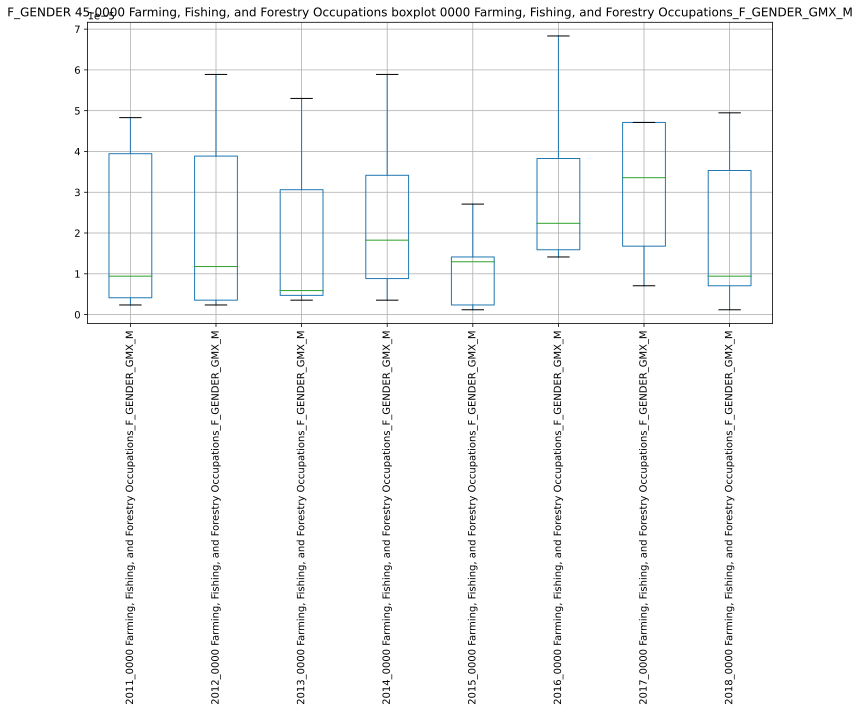

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224507.802032:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224507.838849:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224508.056547:INFO:headless_shell.cc(660)] Written to file /tmp/tmposw3oxf1/temp.png.
[1013/224508.276037:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224508.312813:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224508.591154:INFO:headless_shell.cc(660)] Written to file /tmp/tmpjbphrxh9/temp.png.
[1013/224508.860834:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224508.900043:WARNI

,"2011_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2012_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2013_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2014_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2015_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2016_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2017_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2018_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M"
"2011_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",1.000000,0.957711,0.430486,0.943915,0.897363,0.984081,0.959719,-0.274483
"2012_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.957711,1.000000,0.724476,0.956574,0.976333,0.990500,0.926341,-0.104693
"2013_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.430486,0.724476,1.000000,0.972041,-1.000000,0.944756,0.430486,0.987172
"2014_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.943915,0.956574,0.972041,1.000000,-1.000000,0.988983,0.999963,-0.145294
"2015_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.897363,0.976333,-1.000000,-1.000000,1.000000,-1.000000,0.934893,-0.600089
"2016_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.984081,0.990500,0.944756,0.988983,-1.000000,1.000000,0.986187,0.012027
"2017_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.959719,0.926341,0.430486,0.999963,0.934893,0.986187,1.000000,-0.469591
"2018_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",-0.274483,-0.104693,0.987172,-0.145294,-0.600089,0.012027,-0.469591,1.000000


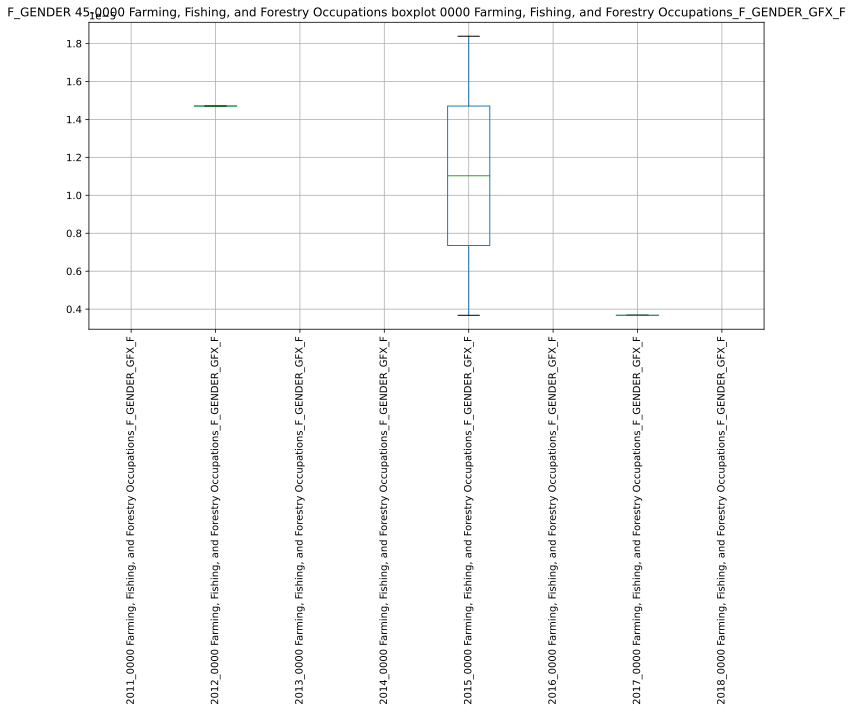

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224512.980514:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224513.018841:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224513.253673:INFO:headless_shell.cc(660)] Written to file /tmp/tmpzdnx1l2z/temp.png.
[1013/224513.461695:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224513.499397:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224513.804264:INFO:headless_shell.cc(660)] Written to file /tmp/tmpbfufq_2s/temp.png.
[1013/224514.064042:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224514.103446:WARNI

,"2011_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2012_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2013_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2014_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2015_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2016_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2017_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2018_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F"
"2011_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2012_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2013_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2014_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2015_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,1.000000,nan,nan,nan
"2016_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2017_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2018_0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M', '45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F']


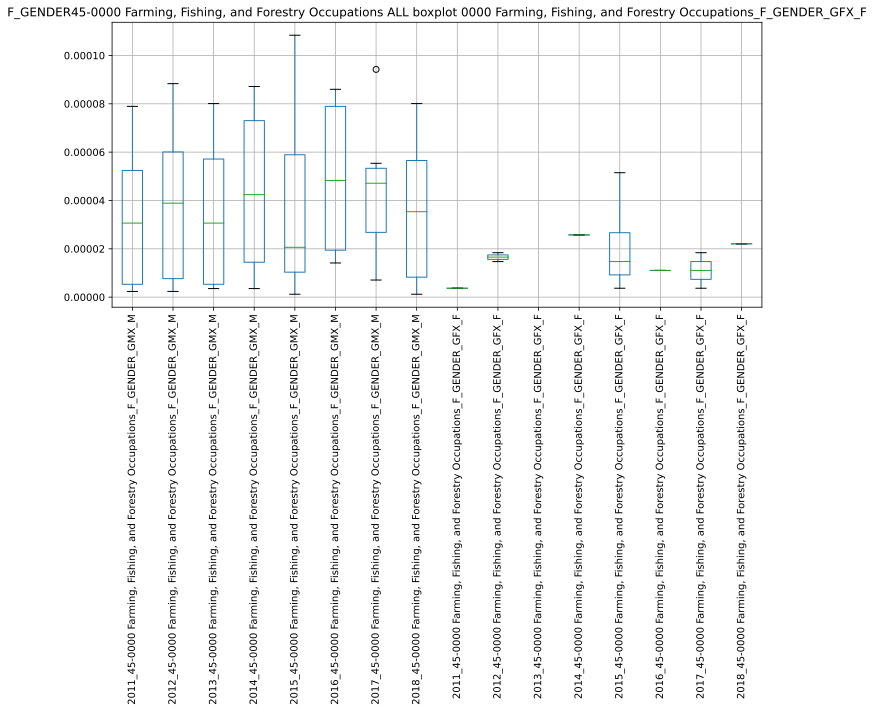

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224518.572840:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224518.609529:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224518.839173:INFO:headless_shell.cc(660)] Written to file /tmp/tmp99ksewx3/temp.png.
[1013/224519.065413:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224519.102161:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224519.506438:INFO:headless_shell.cc(660)] Written to file /tmp/tmp788fc2ea/temp.png.
[1013/224519.820146:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224519.856902:WARNI

,"2011_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2012_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2013_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2014_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2015_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2016_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2017_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2018_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M","2011_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2012_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2013_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2014_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2015_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2016_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2017_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F","2018_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F"
"2011_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",1.000000,0.978618,-0.251474,0.414133,0.926261,0.458496,0.306347,-0.112633,nan,-1.000000,nan,nan,0.945440,nan,-1.000000,nan
"2012_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.978618,1.000000,-0.165880,0.302334,0.977972,0.340201,0.283704,-0.007892,nan,-1.000000,nan,nan,0.921235,nan,-1.000000,nan
"2013_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",-0.251474,-0.165880,1.000000,0.207658,-0.014229,0.208588,0.437750,0.974821,nan,-1.000000,nan,nan,0.304875,nan,-1.000000,nan
"2014_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.414133,0.302334,0.207658,1.000000,0.255443,0.993816,0.869173,0.274075,nan,-1.000000,nan,nan,0.299317,nan,-1.000000,nan
"2015_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.926261,0.977972,-0.014229,0.255443,1.000000,0.298748,0.282947,0.152922,nan,-1.000000,nan,nan,0.961996,nan,-1.000000,nan
"2016_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.458496,0.340201,0.208588,0.993816,0.298748,1.000000,0.826585,0.273494,nan,-1.000000,nan,nan,0.403332,nan,-1.000000,nan
"2017_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",0.306347,0.283704,0.437750,0.869173,0.282947,0.826585,1.000000,0.543146,nan,-1.000000,nan,nan,0.127184,nan,-1.000000,nan
"2018_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GMX_M",-0.112633,-0.007892,0.974821,0.274075,0.152922,0.273494,0.543146,1.000000,nan,-1.000000,nan,nan,0.434384,nan,-1.000000,nan
"2011_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2012_45-0000 Farming, Fishing, and Forestry Occupations_F_GENDER_GFX_F",-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,nan,1.000000,nan,nan,-1.000000,nan,1.000000,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
47-0000 Construction and Extraction Occupations
 
############ OCCUPATION ############
47-0000 Construction and Extraction Occupations
 
########################################## NEW YEAR ###############################################


/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
47-0000 Construction and Extraction Occupations
 
############ OCCUPATION ############
47-0000 Construction and Extraction Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
47-0000 Construction and Extraction Occupations
 
############ OCCUPATION ############
47-0000 Construction and Extraction Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F

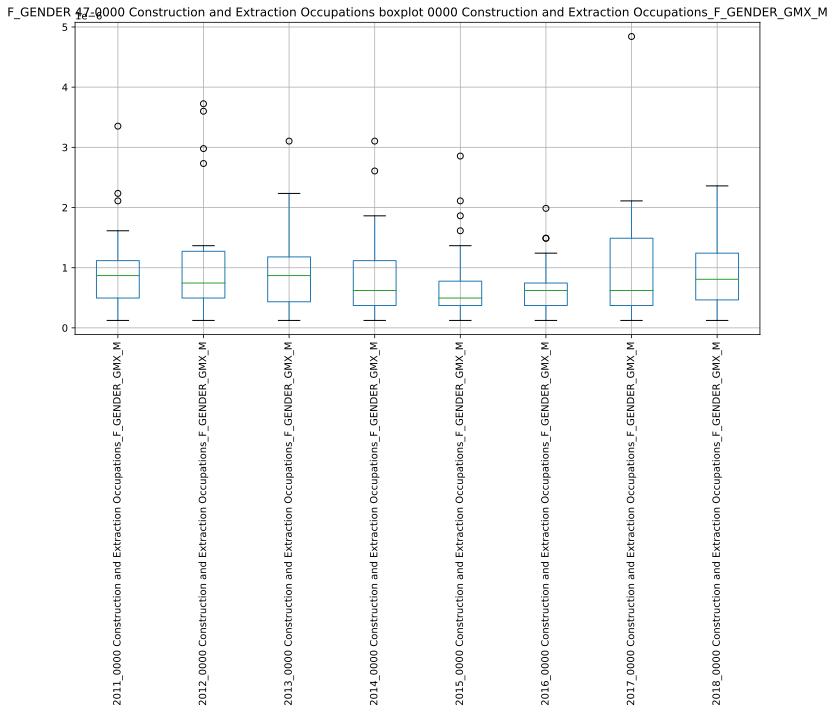

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224529.125338:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224529.166107:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224529.371640:INFO:headless_shell.cc(660)] Written to file /tmp/tmp40kxnve6/temp.png.
[1013/224529.599311:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224529.640513:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224529.913350:INFO:headless_shell.cc(660)] Written to file /tmp/tmp923zirtn/temp.png.
[1013/224530.190549:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224530.219062:WARNI

,2011_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2012_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2013_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2014_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2015_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2016_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2017_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2018_0000 Construction and Extraction Occupations_F_GENDER_GMX_M
2011_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,1.000000,0.123550,-0.122280,-0.316303,-0.244802,0.482209,0.425421,0.064205
2012_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,0.123550,1.000000,0.092419,0.445309,-0.282574,-0.228473,-0.105346,-0.255069
2013_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,-0.122280,0.092419,1.000000,0.183898,0.192099,0.435262,-0.147513,0.161995
2014_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,-0.316303,0.445309,0.183898,1.000000,-0.133680,-0.130055,-0.278425,-0.263360
2015_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,-0.244802,-0.282574,0.192099,-0.133680,1.000000,0.310902,-0.178476,0.145883
2016_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,0.482209,-0.228473,0.435262,-0.130055,0.310902,1.000000,0.562472,0.372882
2017_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,0.425421,-0.105346,-0.147513,-0.278425,-0.178476,0.562472,1.000000,0.228684
2018_0000 Construction and Extraction Occupations_F_GENDER_GMX_M,0.064205,-0.255069,0.161995,-0.263360,0.145883,0.372882,0.228684,1.000000


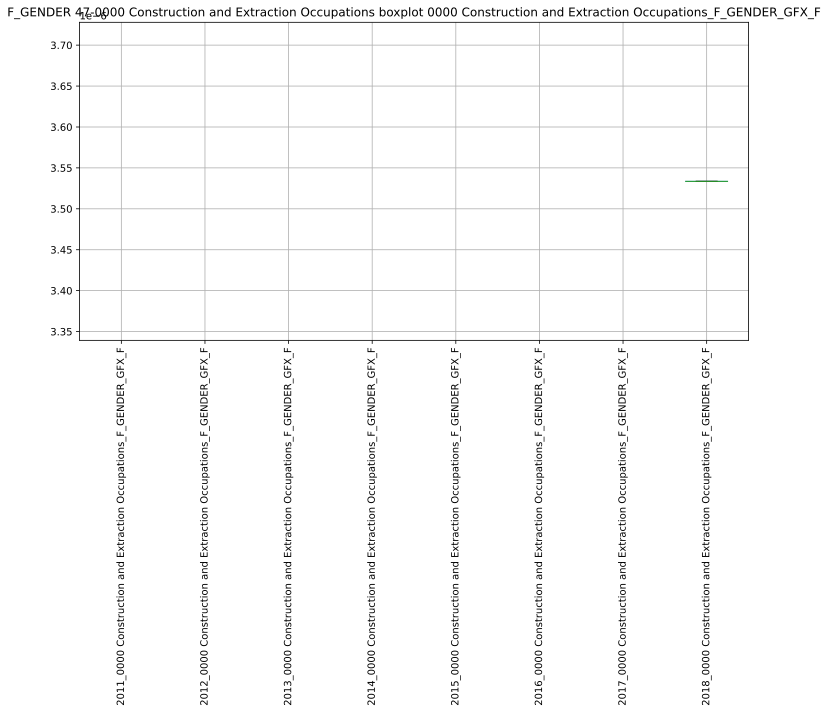

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224532.939175:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224532.975989:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224533.188259:INFO:headless_shell.cc(660)] Written to file /tmp/tmpzk8zb0di/temp.png.
[1013/224533.409179:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224533.450426:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224533.741294:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxfb0d1ts/temp.png.
[1013/224534.000391:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224534.041638:WARNI

,2011_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2012_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2013_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2014_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2015_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2016_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2017_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2018_0000 Construction and Extraction Occupations_F_GENDER_GFX_F
2011_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Construction and Extraction Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M', '47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F']


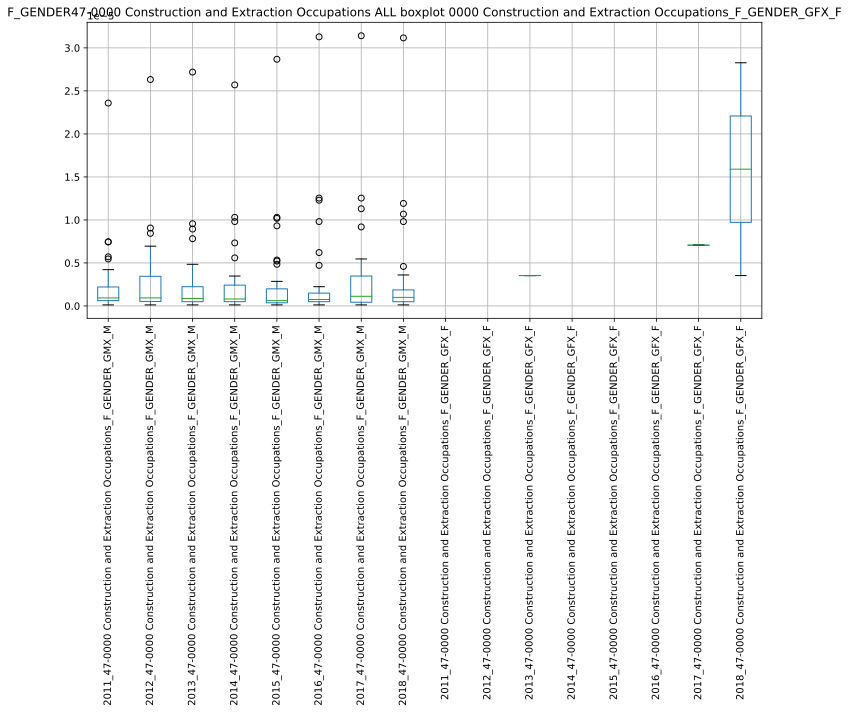

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224537.328855:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224537.367776:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224537.614239:INFO:headless_shell.cc(660)] Written to file /tmp/tmpgadb6eo5/temp.png.
[1013/224537.843411:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224537.883268:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224538.274283:INFO:headless_shell.cc(660)] Written to file /tmp/tmpppww8rnt/temp.png.
[1013/224538.592727:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224538.629426:WARNI

,2011_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2012_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2013_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2014_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2015_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2016_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2017_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2018_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,2011_47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2012_47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2013_47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2014_47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2015_47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2016_47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2017_47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F,2018_47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F
2011_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,1.000000,-0.019241,0.943357,0.068232,0.442625,-0.106182,0.195720,-0.138917,nan,nan,nan,nan,nan,nan,nan,-1.000000
2012_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,-0.019241,1.000000,0.005544,-0.111451,-0.091014,0.042474,-0.026450,0.035596,nan,nan,nan,nan,nan,nan,nan,-1.000000
2013_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,0.943357,0.005544,1.000000,-0.073011,0.414622,-0.072802,0.068443,-0.099404,nan,nan,nan,nan,nan,nan,nan,-1.000000
2014_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,0.068232,-0.111451,-0.073011,1.000000,-0.036247,-0.051487,0.776053,0.001560,nan,nan,nan,nan,nan,nan,nan,1.000000
2015_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,0.442625,-0.091014,0.414622,-0.036247,1.000000,-0.098604,0.021079,-0.121864,nan,nan,nan,nan,nan,nan,nan,-1.000000
2016_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,-0.106182,0.042474,-0.072802,-0.051487,-0.098604,1.000000,-0.122420,0.854977,nan,nan,nan,nan,nan,nan,nan,-1.000000
2017_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,0.195720,-0.026450,0.068443,0.776053,0.021079,-0.122420,1.000000,-0.026184,nan,nan,nan,nan,nan,nan,nan,-1.000000
2018_47-0000 Construction and Extraction Occupations_F_GENDER_GMX_M,-0.138917,0.035596,-0.099404,0.001560,-0.121864,0.854977,-0.026184,1.000000,nan,nan,nan,nan,nan,nan,nan,-1.000000
2011_47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_47-0000 Construction and Extraction Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
49-0000 Installation, Maintenance, and Repair Occupations
 
############ OCCUPATION ############
49-0000 Installation, Maintenance, and Repair Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
49-0000 Installation, Maintenance, and Repair Occupations
 
############ OCCUPATION ############
49-0000 Installation, Maintenance, and Repair Occupations
 
#

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
49-0000 Installation, Maintenance, and Repair Occupations
 
############ OCCUPATION ############
49-0000 Installation, Maintenance, and Repair Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
49-0000 Installation, Maintenance, and Repair Occupations
 
############ OCCUPATION ############
49-0000 Installation, Maintenance, and Repair Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict

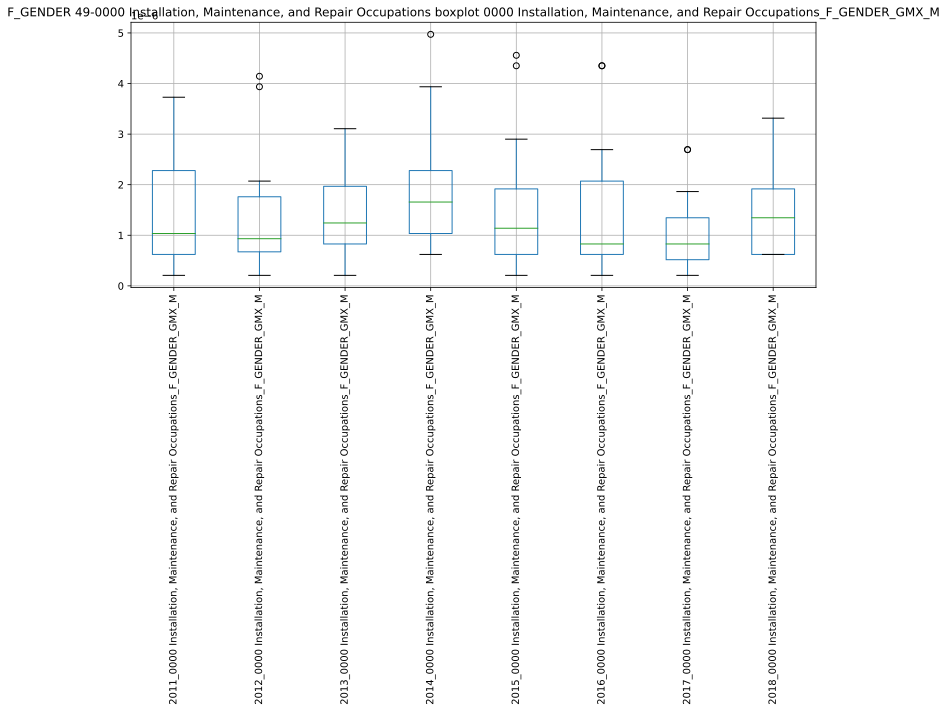

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224547.760094:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224547.798167:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224548.021343:INFO:headless_shell.cc(660)] Written to file /tmp/tmpu03wb0wd/temp.png.
[1013/224548.250727:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224548.291935:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224548.560194:INFO:headless_shell.cc(660)] Written to file /tmp/tmpr34e3l33/temp.png.
[1013/224548.817472:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224548.857155:WARNI

,"2011_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2012_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2013_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2014_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2015_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2016_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2017_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2018_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M"
"2011_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",1.000000,0.068426,0.315466,-0.071100,0.123652,0.619162,0.305113,0.222540
"2012_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.068426,1.000000,0.310605,0.688699,-0.197004,-0.006114,-0.178373,0.606522
"2013_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.315466,0.310605,1.000000,0.770024,-0.322114,-0.075116,-0.336621,0.582951
"2014_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",-0.071100,0.688699,0.770024,1.000000,-0.033512,-0.223938,0.074613,0.864378
"2015_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.123652,-0.197004,-0.322114,-0.033512,1.000000,0.529700,0.869585,-0.234643
"2016_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.619162,-0.006114,-0.075116,-0.223938,0.529700,1.000000,0.581800,-0.334190
"2017_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.305113,-0.178373,-0.336621,0.074613,0.869585,0.581800,1.000000,-0.065073
"2018_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.222540,0.606522,0.582951,0.864378,-0.234643,-0.334190,-0.065073,1.000000


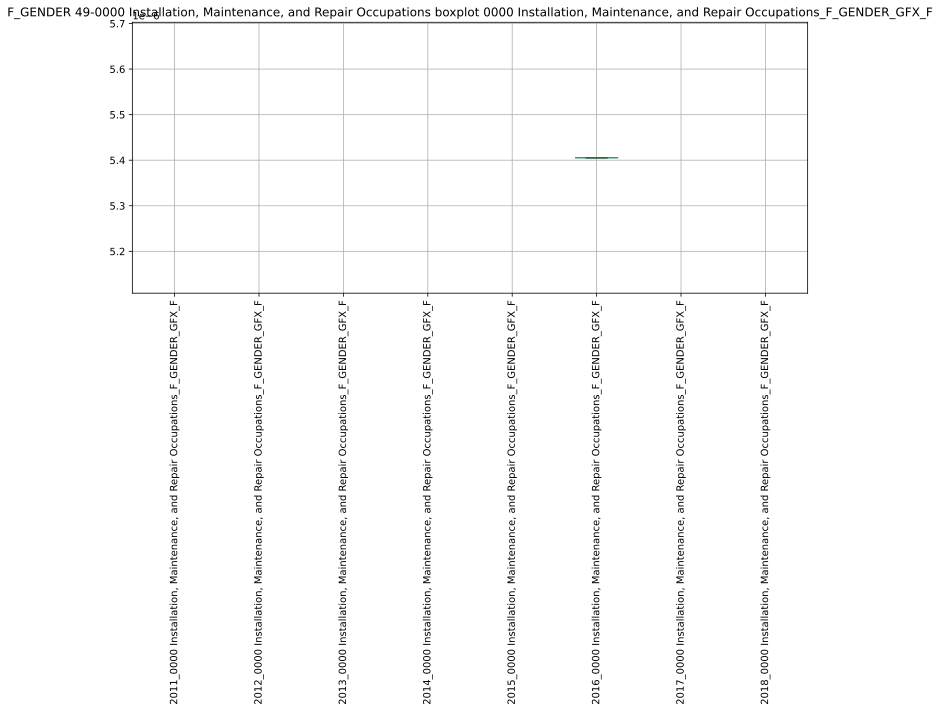

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224552.817630:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224552.858971:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224553.087218:INFO:headless_shell.cc(660)] Written to file /tmp/tmprhjetm02/temp.png.
[1013/224553.309357:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224553.351368:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224553.638594:INFO:headless_shell.cc(660)] Written to file /tmp/tmpqco7zqom/temp.png.
[1013/224553.901095:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224553.943669:WARNI

,"2011_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2012_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2013_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2014_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2015_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2016_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2017_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2018_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F"
"2011_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2012_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2013_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2014_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2015_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2016_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2017_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan
"2018_0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M', '49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F']


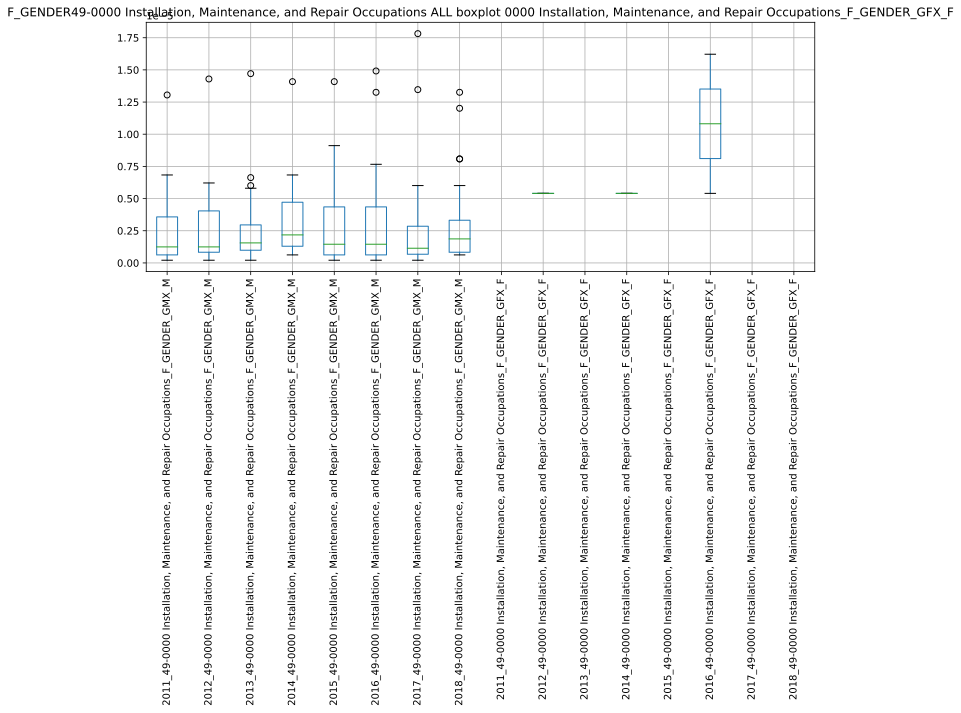

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224558.548263:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224558.588837:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224558.822379:INFO:headless_shell.cc(660)] Written to file /tmp/tmpo217oahw/temp.png.
[1013/224559.039091:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224559.076679:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224559.474385:INFO:headless_shell.cc(660)] Written to file /tmp/tmpw6_t7hcd/temp.png.
[1013/224559.786977:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224559.826015:WARNI

,"2011_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2012_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2013_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2014_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2015_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2016_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2017_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2018_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M","2011_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2012_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2013_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2014_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2015_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2016_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2017_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F","2018_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F"
"2011_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",1.000000,-0.040224,-0.020875,0.064790,0.093664,0.124135,0.049047,0.040178,nan,nan,nan,nan,nan,1.000000,nan,nan
"2012_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",-0.040224,1.000000,0.722694,-0.111162,0.279655,0.136015,0.166035,-0.215064,nan,nan,nan,nan,nan,-1.000000,nan,nan
"2013_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",-0.020875,0.722694,1.000000,0.147439,0.116625,0.004477,0.035483,0.153337,nan,nan,nan,nan,nan,-1.000000,nan,nan
"2014_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.064790,-0.111162,0.147439,1.000000,-0.161274,-0.125979,-0.173456,0.921231,nan,nan,nan,nan,nan,1.000000,nan,nan
"2015_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.093664,0.279655,0.116625,-0.161274,1.000000,0.571227,0.024111,-0.213959,nan,nan,nan,nan,nan,-1.000000,nan,nan
"2016_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.124135,0.136015,0.004477,-0.125979,0.571227,1.000000,0.254606,-0.139058,nan,nan,nan,nan,nan,-1.000000,nan,nan
"2017_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.049047,0.166035,0.035483,-0.173456,0.024111,0.254606,1.000000,-0.217283,nan,nan,nan,nan,nan,1.000000,nan,nan
"2018_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GMX_M",0.040178,-0.215064,0.153337,0.921231,-0.213959,-0.139058,-0.217283,1.000000,nan,nan,nan,nan,nan,1.000000,nan,nan
"2011_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
"2012_49-0000 Installation, Maintenance, and Repair Occupations_F_GENDER_GFX_F",nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
51-0000 Production Occupations
 
############ OCCUPATION ############
51-0000 Production Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
51-0000 Production Occupations
 
############ OCCUPATION ############
51-0000 Production Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.c

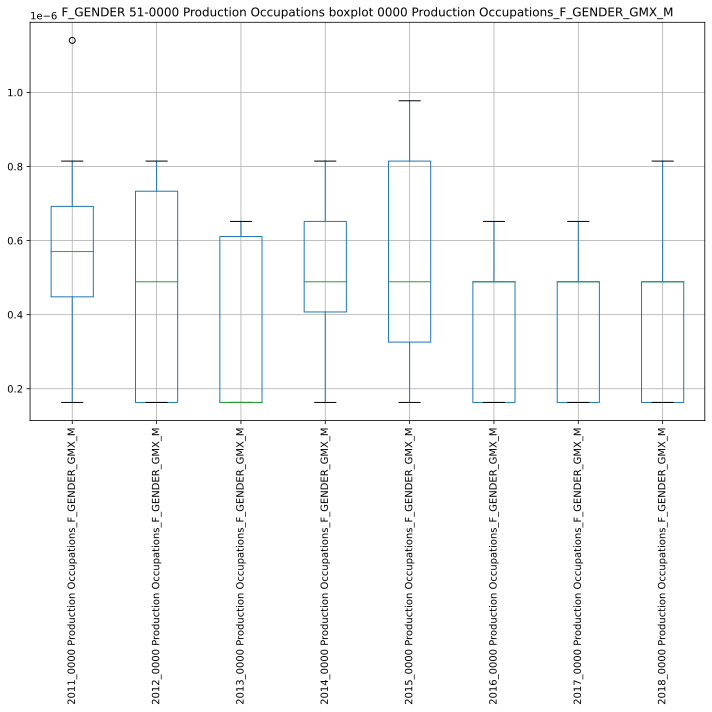

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224608.947622:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224608.989148:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224609.193755:INFO:headless_shell.cc(660)] Written to file /tmp/tmp_591lk6f/temp.png.
[1013/224609.409849:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224609.448099:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224609.726615:INFO:headless_shell.cc(660)] Written to file /tmp/tmpe42gmngr/temp.png.
[1013/224609.994023:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224610.031449:WARNI

,2011_0000 Production Occupations_F_GENDER_GMX_M,2012_0000 Production Occupations_F_GENDER_GMX_M,2013_0000 Production Occupations_F_GENDER_GMX_M,2014_0000 Production Occupations_F_GENDER_GMX_M,2015_0000 Production Occupations_F_GENDER_GMX_M,2016_0000 Production Occupations_F_GENDER_GMX_M,2017_0000 Production Occupations_F_GENDER_GMX_M,2018_0000 Production Occupations_F_GENDER_GMX_M
2011_0000 Production Occupations_F_GENDER_GMX_M,1.000000,0.324657,0.517746,-0.148906,-0.009526,0.488386,0.007312,-0.186467
2012_0000 Production Occupations_F_GENDER_GMX_M,0.324657,1.000000,-0.032186,-0.000000,0.025906,0.472887,0.386921,0.313074
2013_0000 Production Occupations_F_GENDER_GMX_M,0.517746,-0.032186,1.000000,0.040704,-0.141101,0.110432,-0.017376,-0.154782
2014_0000 Production Occupations_F_GENDER_GMX_M,-0.148906,-0.000000,0.040704,1.000000,-0.409960,-0.452911,0.176788,0.198594
2015_0000 Production Occupations_F_GENDER_GMX_M,-0.009526,0.025906,-0.141101,-0.409960,1.000000,0.478830,-0.039228,-0.555742
2016_0000 Production Occupations_F_GENDER_GMX_M,0.488386,0.472887,0.110432,-0.452911,0.478830,1.000000,-0.216982,0.014907
2017_0000 Production Occupations_F_GENDER_GMX_M,0.007312,0.386921,-0.017376,0.176788,-0.039228,-0.216982,1.000000,-0.456571
2018_0000 Production Occupations_F_GENDER_GMX_M,-0.186467,0.313074,-0.154782,0.198594,-0.555742,0.014907,-0.456571,1.000000


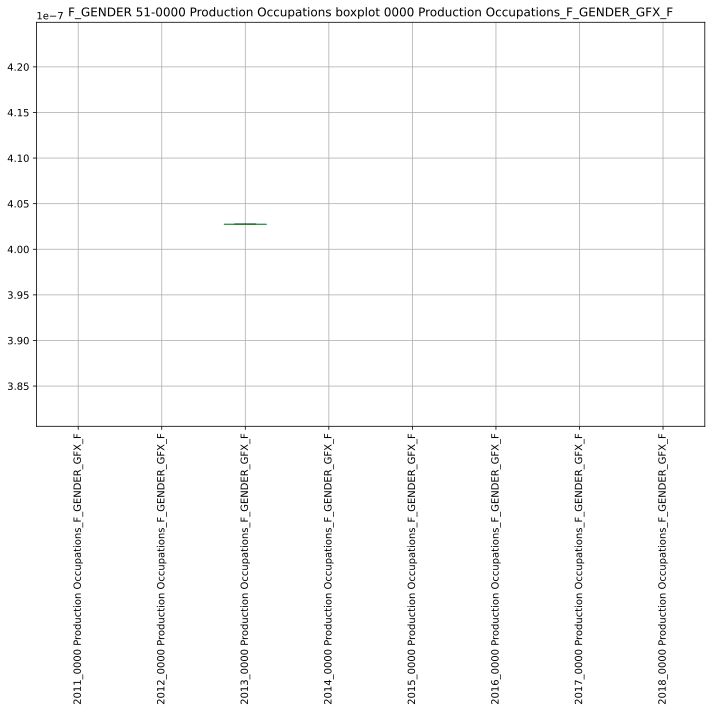

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224612.677508:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224612.715066:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224612.906116:INFO:headless_shell.cc(660)] Written to file /tmp/tmpolxjiiub/temp.png.
[1013/224613.105580:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224613.145715:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224613.430836:INFO:headless_shell.cc(660)] Written to file /tmp/tmpgipdyo0y/temp.png.
[1013/224613.704098:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224613.742805:WARNI

,2011_0000 Production Occupations_F_GENDER_GFX_F,2012_0000 Production Occupations_F_GENDER_GFX_F,2013_0000 Production Occupations_F_GENDER_GFX_F,2014_0000 Production Occupations_F_GENDER_GFX_F,2015_0000 Production Occupations_F_GENDER_GFX_F,2016_0000 Production Occupations_F_GENDER_GFX_F,2017_0000 Production Occupations_F_GENDER_GFX_F,2018_0000 Production Occupations_F_GENDER_GFX_F
2011_0000 Production Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Production Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Production Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Production Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Production Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Production Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Production Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Production Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['51-0000 Production Occupations_F_GENDER_GMX_M', '51-0000 Production Occupations_F_GENDER_GFX_F']


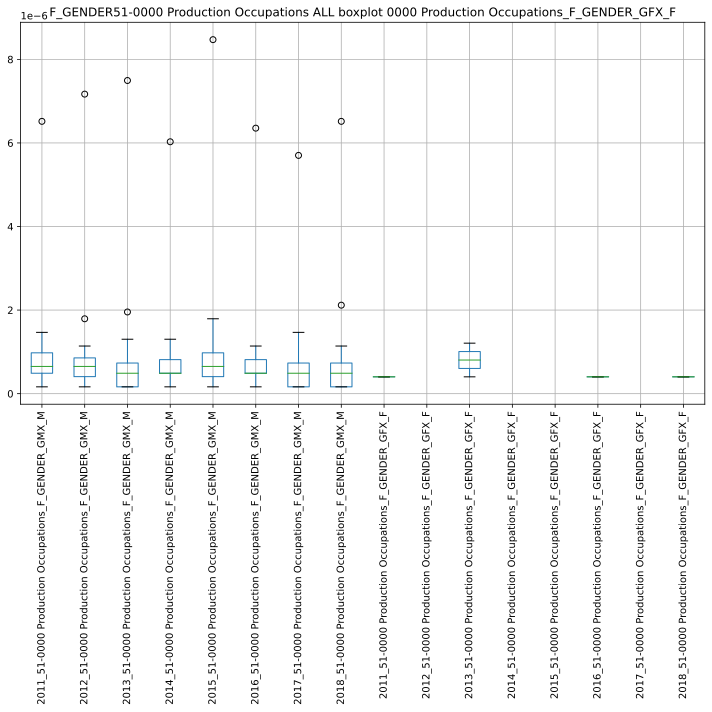

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224616.733700:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224616.775533:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224617.005839:INFO:headless_shell.cc(660)] Written to file /tmp/tmpgjphmvp_/temp.png.
[1013/224617.223102:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224617.265602:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224617.575011:INFO:headless_shell.cc(660)] Written to file /tmp/tmpt4niglzo/temp.png.
[1013/224617.827747:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224617.867229:WARNI

,2011_51-0000 Production Occupations_F_GENDER_GMX_M,2012_51-0000 Production Occupations_F_GENDER_GMX_M,2013_51-0000 Production Occupations_F_GENDER_GMX_M,2014_51-0000 Production Occupations_F_GENDER_GMX_M,2015_51-0000 Production Occupations_F_GENDER_GMX_M,2016_51-0000 Production Occupations_F_GENDER_GMX_M,2017_51-0000 Production Occupations_F_GENDER_GMX_M,2018_51-0000 Production Occupations_F_GENDER_GMX_M,2011_51-0000 Production Occupations_F_GENDER_GFX_F,2012_51-0000 Production Occupations_F_GENDER_GFX_F,2013_51-0000 Production Occupations_F_GENDER_GFX_F,2014_51-0000 Production Occupations_F_GENDER_GFX_F,2015_51-0000 Production Occupations_F_GENDER_GFX_F,2016_51-0000 Production Occupations_F_GENDER_GFX_F,2017_51-0000 Production Occupations_F_GENDER_GFX_F,2018_51-0000 Production Occupations_F_GENDER_GFX_F
2011_51-0000 Production Occupations_F_GENDER_GMX_M,1.000000,-0.001120,-0.101190,-0.133634,-0.141637,-0.034793,-0.049611,-0.076059,nan,nan,nan,nan,nan,nan,nan,nan
2012_51-0000 Production Occupations_F_GENDER_GMX_M,-0.001120,1.000000,0.923262,-0.095694,-0.085642,-0.084061,0.939188,0.890416,nan,nan,-1.000000,nan,nan,nan,nan,nan
2013_51-0000 Production Occupations_F_GENDER_GMX_M,-0.101190,0.923262,1.000000,0.111565,0.026280,0.009952,0.940221,0.871999,nan,nan,nan,nan,nan,nan,nan,nan
2014_51-0000 Production Occupations_F_GENDER_GMX_M,-0.133634,-0.095694,0.111565,1.000000,-0.118967,-0.189396,0.073363,-0.117761,nan,nan,-1.000000,nan,nan,nan,nan,nan
2015_51-0000 Production Occupations_F_GENDER_GMX_M,-0.141637,-0.085642,0.026280,-0.118967,1.000000,0.953889,-0.119654,-0.045293,nan,nan,1.000000,nan,nan,nan,nan,nan
2016_51-0000 Production Occupations_F_GENDER_GMX_M,-0.034793,-0.084061,0.009952,-0.189396,0.953889,1.000000,-0.135612,-0.038675,nan,nan,-1.000000,nan,nan,nan,nan,nan
2017_51-0000 Production Occupations_F_GENDER_GMX_M,-0.049611,0.939188,0.940221,0.073363,-0.119654,-0.135612,1.000000,0.877252,nan,nan,nan,nan,nan,nan,nan,nan
2018_51-0000 Production Occupations_F_GENDER_GMX_M,-0.076059,0.890416,0.871999,-0.117761,-0.045293,-0.038675,0.877252,1.000000,nan,nan,-1.000000,nan,nan,nan,nan,nan
2011_51-0000 Production Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_51-0000 Production Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
53-0000 Transportation and Material Moving Occupations
 
############ OCCUPATION ############
53-0000 Transportation and Material Moving Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
53-0000 Transportation and Material Moving Occupations
 
############ OCCUPATION ############
53-0000 Transportation and Material Moving Occupations
 
#############

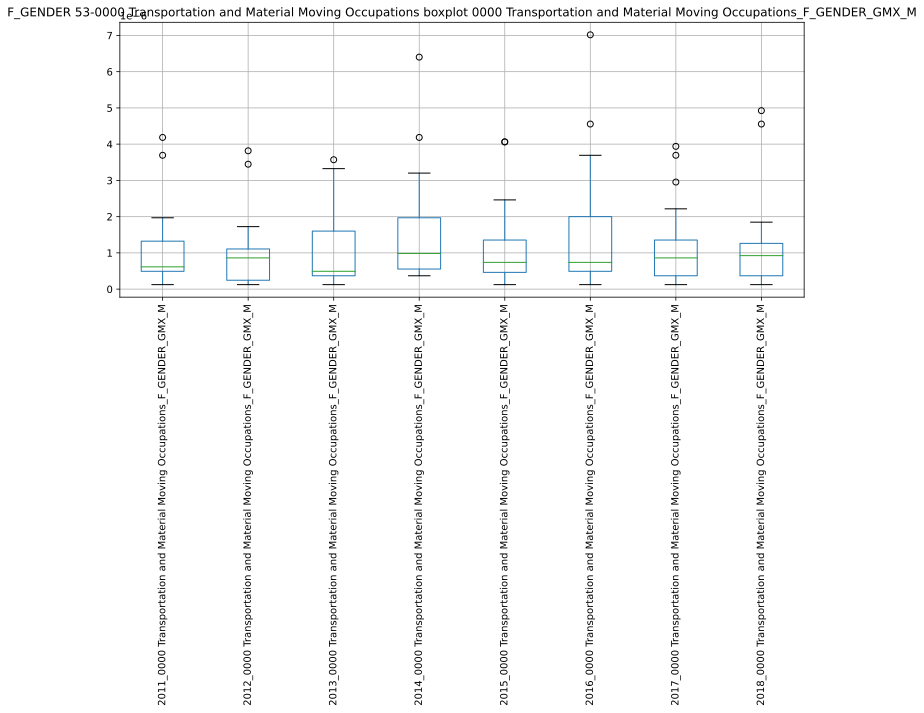

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224623.333105:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224623.370181:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224623.586291:INFO:headless_shell.cc(660)] Written to file /tmp/tmpz__r4f28/temp.png.
[1013/224623.792075:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224623.834326:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224624.103936:INFO:headless_shell.cc(660)] Written to file /tmp/tmp60txpy2s/temp.png.
[1013/224624.345892:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224624.383317:WARNI

,2011_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2012_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2013_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2014_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2015_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2016_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2017_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2018_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M
2011_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,1.000000,0.288818,0.074940,-0.049168,0.554221,0.223466,-0.116652,-0.119081
2012_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.288818,1.000000,0.103984,-0.039134,0.384901,0.271677,-0.160346,-0.212459
2013_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.074940,0.103984,1.000000,-0.228531,-0.018593,0.679679,0.468136,0.336389
2014_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,-0.049168,-0.039134,-0.228531,1.000000,0.113200,-0.331802,0.181950,-0.124304
2015_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.554221,0.384901,-0.018593,0.113200,1.000000,-0.191618,0.164119,0.311865
2016_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.223466,0.271677,0.679679,-0.331802,-0.191618,1.000000,0.103504,-0.220902
2017_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,-0.116652,-0.160346,0.468136,0.181950,0.164119,0.103504,1.000000,0.846487
2018_0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,-0.119081,-0.212459,0.336389,-0.124304,0.311865,-0.220902,0.846487,1.000000


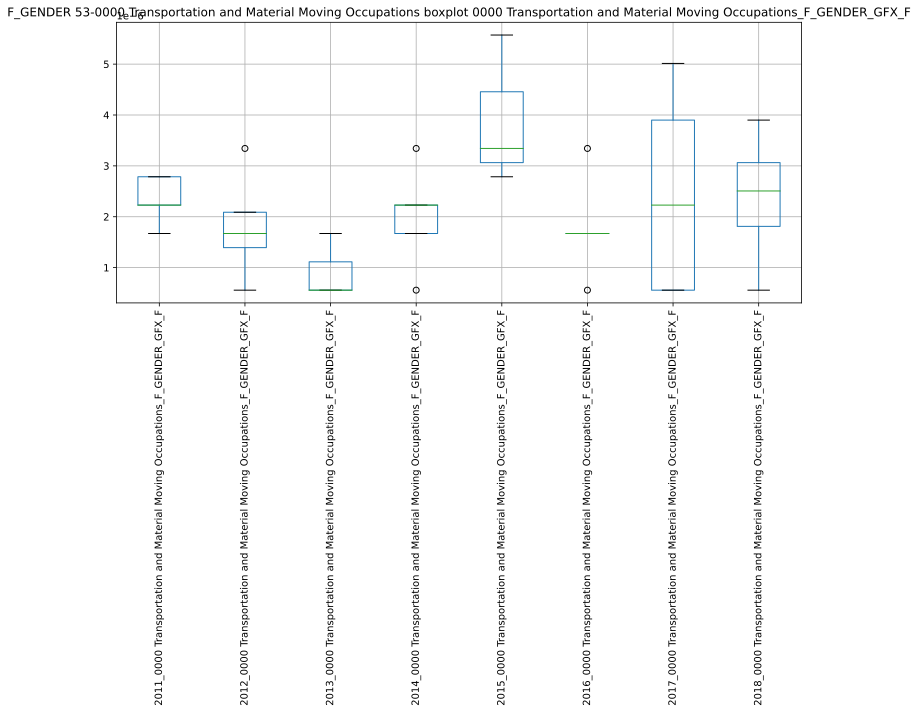

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224628.386322:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224628.424057:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224628.667425:INFO:headless_shell.cc(660)] Written to file /tmp/tmpiovf7ccz/temp.png.
[1013/224628.883171:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224628.927390:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224629.212172:INFO:headless_shell.cc(660)] Written to file /tmp/tmp4wmto1od/temp.png.
[1013/224629.469270:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224629.510276:WARNI

,2011_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2012_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2013_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2014_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2015_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2016_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2017_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2018_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F
2011_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,1.000000,0.866025,nan,-0.083624,nan,0.990148,0.074605,-1.000000
2012_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,0.866025,1.000000,nan,0.188982,-1.000000,1.000000,0.917663,0.755929
2013_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,nan,nan,1.000000,nan,nan,nan,nan,nan
2014_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,-0.083624,0.188982,nan,1.000000,-1.000000,-0.914659,0.646230,-0.995871
2015_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,nan,-1.000000,nan,-1.000000,1.000000,nan,-1.000000,-0.188982
2016_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,0.990148,1.000000,nan,-0.914659,nan,1.000000,-0.464420,nan
2017_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,0.074605,0.917663,nan,0.646230,-1.000000,-0.464420,1.000000,-0.500000
2018_0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,-1.000000,0.755929,nan,-0.995871,-0.188982,nan,-0.500000,1.000000


########################################## CORRELATIONS ###############################################
['53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M', '53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F']


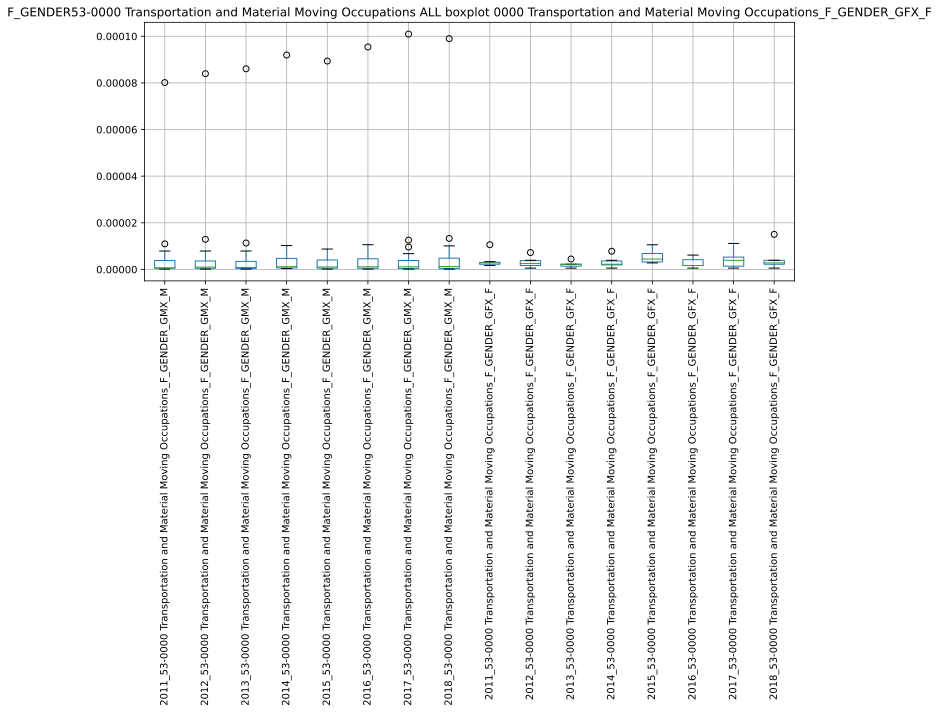

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224634.121363:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224634.157938:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224634.402621:INFO:headless_shell.cc(660)] Written to file /tmp/tmp34j8eigi/temp.png.
[1013/224634.627209:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224634.669180:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224635.077566:INFO:headless_shell.cc(660)] Written to file /tmp/tmpnnk4unxo/temp.png.
[1013/224635.395970:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224635.437763:WARNI

,2011_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2012_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2013_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2014_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2015_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2016_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2017_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2018_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,2011_53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2012_53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2013_53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2014_53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2015_53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2016_53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2017_53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,2018_53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F
2011_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,1.000000,0.038463,0.015591,0.068749,0.101151,0.092910,0.068356,0.977785,-0.222339,-0.541179,0.032596,-0.143700,-0.615332,-0.471018,-0.199780,-0.307072
2012_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.038463,1.000000,0.980738,0.058801,0.093795,0.070225,0.085568,-0.027712,0.773933,0.105259,-0.154210,0.432785,-0.459551,0.361403,0.390642,-0.066624
2013_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.015591,0.980738,1.000000,0.024957,0.049251,0.039044,0.053593,-0.031758,0.920919,0.041056,-0.136809,0.633061,-0.536483,0.407267,0.567578,-0.160447
2014_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.068749,0.058801,0.024957,1.000000,0.987180,0.986460,0.987440,0.084643,-0.058906,-0.225593,-0.504170,-0.426015,-0.490862,0.107499,-0.385722,-0.096599
2015_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.101151,0.093795,0.049251,0.987180,1.000000,0.992534,0.985186,0.096841,-0.094199,-0.361433,-0.502115,-0.454051,-0.468594,0.090036,-0.411772,-0.059484
2016_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.092910,0.070225,0.039044,0.986460,0.992534,1.000000,0.984608,0.094300,-0.067743,-0.361840,-0.492758,-0.431498,-0.562609,0.107276,-0.388473,-0.144513
2017_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.068356,0.085568,0.053593,0.987440,0.985186,0.984608,1.000000,0.095641,-0.090090,-0.302806,-0.508390,-0.453748,-0.536437,0.097628,-0.413562,-0.174756
2018_53-0000 Transportation and Material Moving Occupations_F_GENDER_GMX_M,0.977785,-0.027712,-0.031758,0.084643,0.096841,0.094300,0.095641,1.000000,-0.245835,-0.538962,0.029220,-0.168949,-0.565299,-0.483063,-0.221183,-0.273568
2011_53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,-0.222339,0.773933,0.920919,-0.058906,-0.094199,-0.067743,-0.090090,-0.245835,1.000000,0.096643,0.001813,0.861528,-0.585941,0.525771,0.790543,-0.166048
2012_53-0000 Transportation and Material Moving Occupations_F_GENDER_GFX_F,-0.541179,0.105259,0.041056,-0.225593,-0.361433,-0.361840,-0.302806,-0.538962,0.096643,1.000000,-0.304187,0.289798,0.934911,-0.093505,0.203909,0.922946


########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
55-0000 Military Specific Occupations
 
############ OCCUPATION ############
55-0000 Military Specific Occupations
 
########################################## NEW YEAR ###############################################


/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
55-0000 Military Specific Occupations
 
############ OCCUPATION ############
55-0000 Military Specific Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############
55-0000 Military Specific Occupations
 
############ OCCUPATION ############
55-0000 Military Specific Occupations
 
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
F_GENDER_GMX_M_all.csv
F_GENDER_GFX_F_all.csv
dict_keys(['F_GENDER_GMX_M', 'F_GENDER_GFX_F'])
############ OCCUPATION ############

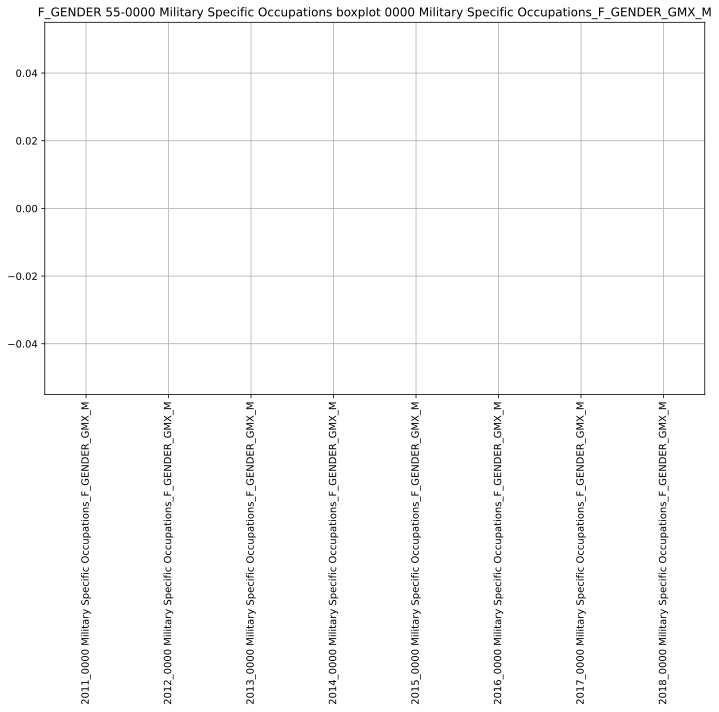

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224644.739951:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224644.781953:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224644.974829:INFO:headless_shell.cc(660)] Written to file /tmp/tmp2mk1oikn/temp.png.
[1013/224645.203084:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224645.244578:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224645.532443:INFO:headless_shell.cc(660)] Written to file /tmp/tmpwi2sa788/temp.png.
[1013/224645.784349:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224645.826630:WARNI

,2011_0000 Military Specific Occupations_F_GENDER_GMX_M,2012_0000 Military Specific Occupations_F_GENDER_GMX_M,2013_0000 Military Specific Occupations_F_GENDER_GMX_M,2014_0000 Military Specific Occupations_F_GENDER_GMX_M,2015_0000 Military Specific Occupations_F_GENDER_GMX_M,2016_0000 Military Specific Occupations_F_GENDER_GMX_M,2017_0000 Military Specific Occupations_F_GENDER_GMX_M,2018_0000 Military Specific Occupations_F_GENDER_GMX_M
2011_0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan


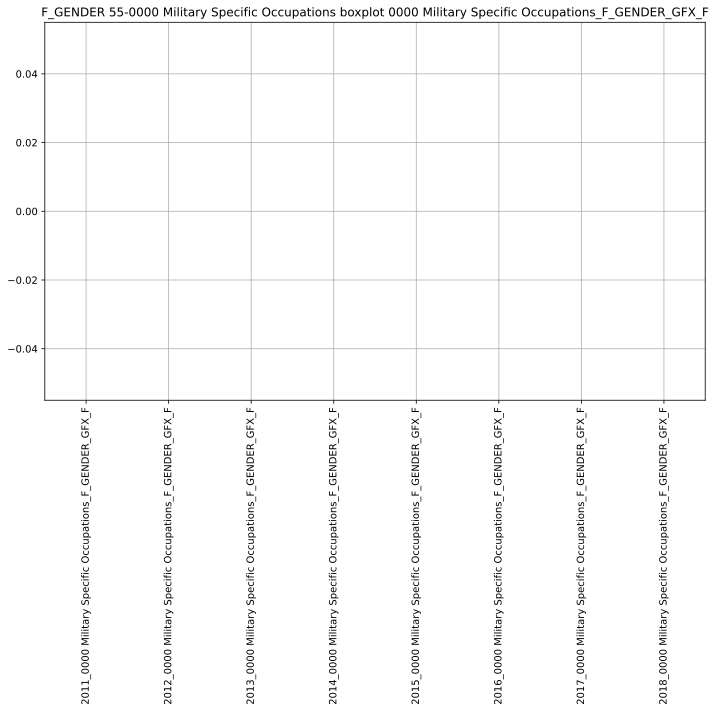

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224648.363843:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224648.402133:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224648.608372:INFO:headless_shell.cc(660)] Written to file /tmp/tmpzqnjbp6q/temp.png.
[1013/224648.815135:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224648.854807:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224649.108440:INFO:headless_shell.cc(660)] Written to file /tmp/tmpnw9quomv/temp.png.
[1013/224649.351022:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224649.388699:WARNI

,2011_0000 Military Specific Occupations_F_GENDER_GFX_F,2012_0000 Military Specific Occupations_F_GENDER_GFX_F,2013_0000 Military Specific Occupations_F_GENDER_GFX_F,2014_0000 Military Specific Occupations_F_GENDER_GFX_F,2015_0000 Military Specific Occupations_F_GENDER_GFX_F,2016_0000 Military Specific Occupations_F_GENDER_GFX_F,2017_0000 Military Specific Occupations_F_GENDER_GFX_F,2018_0000 Military Specific Occupations_F_GENDER_GFX_F
2011_0000 Military Specific Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Military Specific Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Military Specific Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Military Specific Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Military Specific Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Military Specific Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Military Specific Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Military Specific Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['55-0000 Military Specific Occupations_F_GENDER_GMX_M', '55-0000 Military Specific Occupations_F_GENDER_GFX_F']


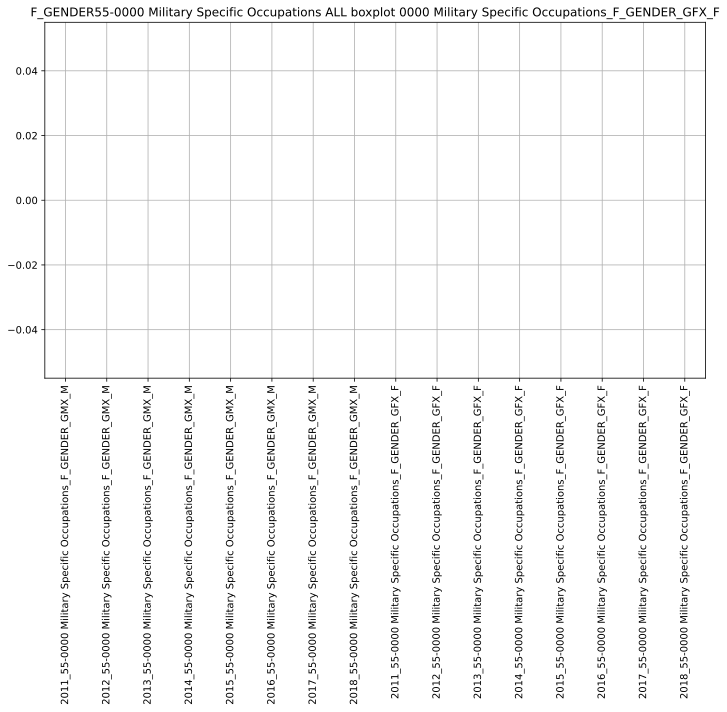

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1013/224652.376635:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224652.417793:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224652.672366:INFO:headless_shell.cc(660)] Written to file /tmp/tmp47hfw0sz/temp.png.
[1013/224652.896506:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224652.939474:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1013/224653.241388:INFO:headless_shell.cc(660)] Written to file /tmp/tmplxiyuw9o/temp.png.
[1013/224653.501620:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1013/224653.538331:WARNI

,2011_55-0000 Military Specific Occupations_F_GENDER_GMX_M,2012_55-0000 Military Specific Occupations_F_GENDER_GMX_M,2013_55-0000 Military Specific Occupations_F_GENDER_GMX_M,2014_55-0000 Military Specific Occupations_F_GENDER_GMX_M,2015_55-0000 Military Specific Occupations_F_GENDER_GMX_M,2016_55-0000 Military Specific Occupations_F_GENDER_GMX_M,2017_55-0000 Military Specific Occupations_F_GENDER_GMX_M,2018_55-0000 Military Specific Occupations_F_GENDER_GMX_M,2011_55-0000 Military Specific Occupations_F_GENDER_GFX_F,2012_55-0000 Military Specific Occupations_F_GENDER_GFX_F,2013_55-0000 Military Specific Occupations_F_GENDER_GFX_F,2014_55-0000 Military Specific Occupations_F_GENDER_GFX_F,2015_55-0000 Military Specific Occupations_F_GENDER_GFX_F,2016_55-0000 Military Specific Occupations_F_GENDER_GFX_F,2017_55-0000 Military Specific Occupations_F_GENDER_GFX_F,2018_55-0000 Military Specific Occupations_F_GENDER_GFX_F
2011_55-0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_55-0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2013_55-0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014_55-0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2015_55-0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2016_55-0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2017_55-0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2018_55-0000 Military Specific Occupations_F_GENDER_GMX_M,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2011_55-0000 Military Specific Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2012_55-0000 Military Specific Occupations_F_GENDER_GFX_F,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [6]:

for ocup_sel in range(1,24):
    
    print("########################################## NEW OCCUPATION ###############################################")
    print("")
    global_y_soc1 = []

    for year in range(0,8):  
        print("########################################## NEW YEAR ###############################################")
        desired_file_output = "./NF_SUB_GENDER/NF_GENDER_" + str(2011+year) + "_"    
        %run ./analysis-code-subcat.ipynb
    
    print("########################################## BOX PLOTS ###############################################")
    gen_boxplot()

    print("########################################## CORRELATIONS ###############################################")
    gen_corr()